In [ ]:
!pip install numpy==1.26.4 scipy==1.15.1 shap==0.45.0 grad-cam==1.5.5 ttach==0.0.3 --no-build-isolation --no-cache-dir

In [2]:
!pip install pydicom

In [3]:
import os, time, copy
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.utils.data.dataloader import default_collate
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, brier_score_loss, confusion_matrix, precision_recall_fscore_support
import shap
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import pydicom
import glob
import scipy
import skimage
from itertools import chain
from skimage.io import imread,imshow
from collections import defaultdict
from tqdm import tqdm
import torch.nn.functional as F

sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)
import warnings
warnings.filterwarnings('ignore')

In [4]:
NIH_PATH = "/kaggle/input/data/" 
CHEXPERT_PATH = "/kaggle/input/chexpert/" 
RSNA_PATH = "/kaggle/input/rsna-pneumonia-detection-challenge/" 
OUTPUT_PATH = "/kaggle/working/chapter4_outputs/"

os.makedirs(OUTPUT_PATH, exist_ok=True)

**Dataset Class & Preprocessing**

In [5]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch
import os
import pandas as pd
import numpy as np 


class SkipSampleException(Exception):
    pass


**Load & Preprocess Data**

In [6]:
# Extracting metadata from rsna DICOM files 

image_dir = '/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images' 
metadata_list = []
# --- Configuration ---
MAX_FILES_TO_PROCESS = 100  # <--- SET YOUR LIMIT HERE
RSNA_DICOM_DIR = '/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images' 
RSNA_PNG_DIR = '/kaggle/working/rsna_png_images' 

os.makedirs(RSNA_PNG_DIR, exist_ok=True)
metadata_list = []
files_processed = 0


print("Extracting metadata from DICOM files (this may take a few minutes and consume high RAM)...")

# Loop through all DICOM files
for filename in os.listdir(image_dir):
    if filename.endswith('.dcm'):
        patient_id = filename[:-4] # Removing the .dcm extension
        filepath = os.path.join(image_dir, filename)

        try:
            # Read the DICOM file
            dicom_data = pydicom.dcmread(filepath, force=True)
            
            # Extract the required tags
            age = getattr(dicom_data, 'PatientAge', None)
            sex = getattr(dicom_data, 'PatientSex', None)
            view_pos = getattr(dicom_data, 'ViewPosition', None)
            
            if age is not None:
                age = age.replace('Y', '') if isinstance(age, str) else age
                try:
                    age = int(age)
                except ValueError:
                    age = None # None if conversion fails

            metadata_list.append({
                'patientId': patient_id,
                'age': age,
                'sex': sex,
                'view_position': view_pos,
            })
        except Exception as e:
            print(f"Error reading {filename}: {e}")

# Create the new metadata DataFrame
metadata_df = pd.DataFrame(metadata_list)
print("Metadata and Pixel Data extraction complete.")
print(metadata_df.head())
print(metadata_df.columns)



Extracting metadata from DICOM files (this may take a few minutes and consume high RAM)...
Metadata and Pixel Data extraction complete.
                              patientId  age sex view_position
0  c3b05294-29be-46e4-8a51-96fd211e4ca5   26   M            PA
1  6a6ed2c5-d179-4c19-aac7-0d70eb87e024   12   F            AP
2  06550cfd-e9d5-415e-bae9-3146329ed9e6   18   M            AP
3  ef9eee29-6bdd-41da-ae40-9473592a9d5c   32   M            PA
4  c5dfc1a7-4669-42ce-af9f-62c3d8322049   16   M            PA
Index(['patientId', 'age', 'sex', 'view_position'], dtype='object')


In [7]:
 # uncomment after test
import os
import pydicom
import numpy as np
import pandas as pd
from PIL import Image


print(f"Starting conversion, limited to {MAX_FILES_TO_PROCESS} images...")

# --- Helper Function for Conversion (Place this function definition before the loop) ---
def convert_dicom_to_png(dicom_data, output_path):
    """Converts pixel array data to an 8-bit PNG and saves it."""
    try:
        pixel_array = dicom_data.pixel_array

        # Normalize and scale the 16-bit data to 8-bit (0-255)
        pixel_array = pixel_array - np.min(pixel_array)
        pixel_array = pixel_array / np.max(pixel_array)
        pixel_array = (pixel_array * 255).astype(np.uint8)

        image = Image.fromarray(pixel_array).convert('L')
        image.save(output_path, 'PNG')
        return True
    except Exception as e:
        image = Image.fromarray(np.zeros((224,224), dtype=np.uint8))
        print(f"Error converting and saving {output_path}: {e}")
        return False


# --- Get and Sort Filenames ---
# Get all filenames and sort them alphabetically
filenames = os.listdir(RSNA_DICOM_DIR)
filenames.sort() # Sort the filenames to ensure consistent order


# Convert Image (with a Limit) ---
files_processed = 0 # Reset the counter before the loop
for filename in filenames: # Iterate through the sorted filenames
    if filename.endswith('.dcm'):
        if files_processed >= MAX_FILES_TO_PROCESS:
            print(f"Reached limit of {MAX_FILES_TO_PROCESS} files. Stopping conversion.")
            break # Breaks out of the loop once the limit is hit

        patient_id = filename[:-4]
        filepath = os.path.join(RSNA_DICOM_DIR, filename)
        png_output_path = os.path.join(RSNA_PNG_DIR, patient_id + '.png')

        try:
            dicom_data = pydicom.dcmread(filepath, force=True)

            # 1. Convert and Save the image to disk
            if convert_dicom_to_png(dicom_data, png_output_path):
                files_processed += 1 # Only increment if conversion was successful
        except Exception as e:
            # Print specific error during DICOM read if force=True fails
            print(f"Error processing DICOM file {filename}: {e}")


print(f"\nTotal images processed/converted: {files_processed}") # Print actual number processed


##############################
# 1. Load your existing rsna_df (stage_2_train_labels.csv)
rsna_df = pd.read_csv('/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv')

# 2. Merge the extracted metadata (metadata_df was created in the previous cell)
# rsna_df_final now contains metadata for all patients and will be updated with the PNG paths later
# Use an outer merge to keep all metadata, even if no bounding box was present in stage_2_train_labels.csv
# However, the original code used a left merge (rsna_df on left), let's stick to that for now
# and assume we only care about patients with labels/boxes.
# Correction: The metadata_df created in the previous cell has ALL patients from the DICOM dir,
# while rsna_df only has patients with bounding boxes or explicit negative labels in stage_2_train_labels.csv.
# Merging rsna_df with metadata_df (left merge) will give us metadata only for patients in the labels file.
# Merging metadata_df with rsna_df (left merge) would give us all patients with metadata,
# and labels for those that have them.
# The previous code used rsna_df as the left df. Let's keep that for consistency with earlier logic.
rsna_df_final = pd.merge(rsna_df, metadata_df, on='patientId', how='left')


# 3. Preprocess the merged data (Minimal cleaning here; full cleaning is done on combined_df)
# Ensure consistent mapping with combined_df preprocessing
rsna_df_final['sex'] = rsna_df_final['sex'].map({'M': 0, 'F': 1})
rsna_df_final['view_position'] = rsna_df_final['view_position'].map({'AP': 0, 'PA': 1})
# Age is already numeric or NaN from metadata extraction
rsna_df_final['age'] = rsna_df_final['age']
rsna_df_final = rsna_df_final.rename(columns={'Target': 'label'})

# Handle NaNs in encoded columns (set to -1 for unknown temporarily, imputation happens on combined_df)
rsna_df_final['sex'] = rsna_df_final['sex'].fillna(-1).astype(int)
rsna_df_final['view_position'] = rsna_df_final['view_position'].fillna(-1).astype(int)

# The rsna_df_final from stage_2_train_labels.csv can have multiple rows per patientId.
# We need one row per image/patientId for classification.
# Aggregate to one row per patientId, keeping the max label (1 if any box, 0 otherwise)
# and the first available metadata.
rsna_df_final = rsna_df_final.groupby('patientId').agg({
    'label': 'max',
    'age': 'first',
    'sex': 'first',
    'view_position': 'first'
}).reset_index()


print("\nFinal Preprocessed Data Head (Metadata Only):")
print(rsna_df_final[['patientId', 'age', 'sex', 'view_position', 'label']].head())
print(f"\nShape of rsna_df_final after aggregation: {rsna_df_final.shape}")


# --- CRUCIAL NEXT STEP: Update the rsna_df_final to point to the new PNG_DIR ---
# This dataframe should ideally contain ALL patients from the DICOM directory with their metadata,
# and the label from stage_2_train_labels.csv where available.
# Let's rebuild rsna_df_final using the full metadata_df and merging labels.

# Use the full metadata_df (from cell 8yZRn_hQ3Iht) as the base
full_metadata_df = metadata_df.copy() # Assuming metadata_df is still available

# Load the labels file separately
rsna_labels_df = pd.read_csv('/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv')

# Aggregate labels to one per patientId (max label)
rsna_labels_agg = rsna_labels_df.groupby('patientId')['Target'].max().reset_index()
rsna_labels_agg = rsna_labels_agg.rename(columns={'Target': 'label'})

# Merge full metadata with aggregated labels.
# Use a left merge from full_metadata_df to keep all patients with metadata,
# and add labels where they exist. Patients without a label in the labels file will have NaN label.
rsna_df_final = pd.merge(full_metadata_df, rsna_labels_agg, on='patientId', how='left')

# Fill NaN labels with 0, assuming patients not in labels file are negative.
rsna_df_final['label'] = rsna_df_final['label'].fillna(0).astype(int)

# Preprocess metadata columns (consistent with earlier)
rsna_df_final['sex'] = rsna_df_final['sex'].map({'M': 0, 'F': 1})
rsna_df_final['view_position'] = rsna_df_final['view_position'].map({'AP': 0, 'PA': 1})

# Handle NaNs in encoded columns after mapping (should be rare after starting with full metadata)
rsna_df_final['sex'] = rsna_df_final['sex'].fillna(-1).astype(int)
rsna_df_final['view_position'] = rsna_df_final['view_position'].fillna(-1).astype(int)

# Age is already handled in metadata_df extraction. Imputation for age happens on combined_df.

# Add source and base_dir pointing to the *converted PNGs*
rsna_df_final['source'] = 'RSNA'
rsna_df_final['base_dir'] = RSNA_PNG_DIR # Point to the directory where PNGs were saved

# Create image_id (patientId.png)
rsna_df_final['image_id'] = rsna_df_final['patientId'].astype(str) + '.png'

print("\nRebuilt rsna_df_final Head:")
print(rsna_df_final[['patientId', 'age', 'sex', 'view_position', 'label', 'image_id', 'base_dir', 'source']].head())
print(f"\nShape of rebuilt rsna_df_final: {rsna_df_final.shape}")

# Note: The image_path column for the combined_df (in cell InCQigUU3Ihx)
# will need to be updated to correctly point to these PNGs for RSNA samples.
# Let's ensure the combined_df creation logic is also updated or re-run after this cell.


Starting conversion, limited to 100 images...
Reached limit of 100 files. Stopping conversion.

Total images processed/converted: 100

Final Preprocessed Data Head (Metadata Only):
                              patientId  age  sex  view_position  label
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6   51    1              1      0
1  000924cf-0f8d-42bd-9158-1af53881a557   19    1              0      0
2  000db696-cf54-4385-b10b-6b16fbb3f985   25    1              0      1
3  000fe35a-2649-43d4-b027-e67796d412e0   40    0              0      1
4  001031d9-f904-4a23-b3e5-2c088acd19c6   57    0              1      1

Shape of rsna_df_final after aggregation: (26684, 5)

Rebuilt rsna_df_final Head:
                              patientId  age  sex  view_position  label  \
0  c3b05294-29be-46e4-8a51-96fd211e4ca5   26    0              1      0   
1  6a6ed2c5-d179-4c19-aac7-0d70eb87e024   12    1              0      0   
2  06550cfd-e9d5-415e-bae9-3146329ed9e6   18    0              0      1   
3  e

In [8]:
import os
import pydicom
import numpy as np
import pandas as pd
from PIL import Image
import cv2 # Ensure cv2 is imported if used in convert_dicom_to_png

print(f"Starting conversion, limited to {MAX_FILES_TO_PROCESS} images...")

# --- Helper Function for Conversion (Place this function definition before the loop) ---
def convert_dicom_to_png(dicom_data, output_path):
    """Converts pixel array data to an 8-bit PNG and saves it."""
    try:
        # Ensure pixel array is extracted
        if not hasattr(dicom_data, 'pixel_array'):
            print(f"Error: DICOM file {output_path} has no pixel_array.")
            return False

        pixel_array = dicom_data.pixel_array

        # Handle potential photometric interpretation issues (e.g., MONOCHROME1)
        if 'PhotometricInterpretation' in dicom_data and dicom_data.PhotometricInterpretation == "MONOCHROME1":
             # Invert pixel data if MONOCHROME1
             pixel_array = np.amax(pixel_array) - pixel_array

        # Apply windowing if specified (more robust handling)
        if hasattr(dicom_data, 'WindowCenter') and hasattr(dicom_data, 'WindowWidth'):
             window_center = float(dicom_data.WindowCenter)
             window_width = float(dicom_data.WindowWidth)
             img_min = window_center - window_width / 2
             img_max = window_center + window_width / 2
             pixel_array = np.clip(pixel_array, img_min, img_max)

        # Normalize and scale the potentially 16-bit data to 8-bit (0-255)
        # Use float64 for intermediate calculations to avoid overflow
        pixel_array = pixel_array.astype(np.float64)
        pixel_array = pixel_array - np.min(pixel_array)
        max_val = np.max(pixel_array)
        if max_val > 0:
             pixel_array = pixel_array / max_val
        else:
             pixel_array = np.zeros_like(pixel_array) # Handle case where all pixels are same value


        pixel_array = (pixel_array * 255).astype(np.uint8)

        # Using OpenCV for potentially faster and more reliable image saving
        # Ensure it's grayscale
        if pixel_array.ndim == 3:
             # Convert to grayscale if it's RGB/RGBA (shouldn't be for DICOM pixel_array)
             pixel_array = cv2.cvtColor(pixel_array, cv2.COLOR_RGB2GRAY) # Or RGBA2GRAY

        # Save the 8-bit grayscale image
        cv2.imwrite(output_path, pixel_array)

        # Optional: Check if the file was actually created and is not empty
        if os.path.exists(output_path) and os.path.getsize(output_path) > 0:
            return True
        else:
            print(f"Warning: Failed to write or file is empty at {output_path}")
            return False # Indicate failure


    except Exception as e:
        print(f"Error converting and saving {output_path} from DICOM: {e}")
        # Attempt to save a dummy image to indicate processing was attempted
        try:
             dummy_img = Image.fromarray(np.zeros((224,224), dtype=np.uint8))
             dummy_img.save(output_path, 'PNG')
             print(f"Saved dummy image to {output_path}")
        except Exception as dummy_e:
             print(f"Failed to save dummy image to {output_path}: {dummy_e}")

        return False # Indicate failure


# Convert Image (with a Limit) ---
# Ensure RSNA_DICOM_DIR and RSNA_PNG_DIR are defined (should be from previous cells)
if 'RSNA_DICOM_DIR' not in globals() or 'RSNA_PNG_DIR' not in globals():
    print("Error: RSNA_DICOM_DIR or RSNA_PNG_DIR not defined. Please run previous cells.")
else:
    # Get list of all DICOM files
    all_dicom_files = [f for f in os.listdir(RSNA_DICOM_DIR) if f.endswith('.dcm')]

    # Select a limited sample for conversion
    # Ensure reproducibility if RANDOM_SEED is defined
    if 'RANDOM_SEED' in globals():
        np.random.seed(RANDOM_SEED)
    # Convert up to MAX_FILES_TO_PROCESS, ensuring not to exceed available files
    sample_dicom_files_for_conversion = np.random.choice(all_dicom_files,
                                                         size=min(MAX_FILES_TO_PROCESS, len(all_dicom_files)),
                                                         replace=False)

    print(f"Attempting to convert {len(sample_dicom_files_for_conversion)} DICOM files to PNG...")

    # Keep track of files that were successfully converted and saved
    successfully_converted_files = []

    for filename in sample_dicom_files_for_conversion:
        patient_id = filename[:-4]
        filepath = os.path.join(RSNA_DICOM_DIR, filename)
        png_output_path = os.path.join(RSNA_PNG_DIR, patient_id + '.png')

        if convert_dicom_to_png(pydicom.dcmread(filepath, force=True), png_output_path):
             successfully_converted_files.append(patient_id + '.png')
             files_processed += 1


    print(f"\nConversion attempt complete. Successfully processed/converted {files_processed} files.")
    # Note: Total images processed/converted count from metadata_df is not the same
    # as the number of files converted to PNG here if MAX_FILES_TO_PROCESS is set.
    print(f"Successfully converted and saved {len(successfully_converted_files)} PNG files to {RSNA_PNG_DIR}")

# --- CRUCIAL NEXT STEP: Update rsna_df_final to ONLY include successfully converted files ---
# This ensures that the test loader only tries to load files that actually exist as PNGs.

# Reload rsna_df_final or use the one already in memory (from i1L6yFvqxbmy)
# Assuming rsna_df_final is available from cell i1L6yFvqxbmy

if 'rsna_df_final' in globals():
    # Filter rsna_df_final to keep only rows corresponding to successfully converted PNGs
    rsna_df_final_filtered = rsna_df_final[rsna_df_final['image_id'].isin(successfully_converted_files)].copy()

    # Update the 'image_path' column to point to the new PNG files in RSNA_PNG_DIR
    rsna_df_final_filtered['base_dir'] = RSNA_PNG_DIR
    rsna_df_final_filtered['image_path'] = rsna_df_final_filtered.apply(lambda row: os.path.join(row['base_dir'], row['image_id']), axis=1)

    # Replace the original rsna_df_final with the filtered one for downstream use
    rsna_df_final = rsna_df_final_filtered
    print("\nUpdated rsna_df_final to include only successfully converted PNG files.")
    print(f"New size of rsna_df_final for evaluation: {len(rsna_df_final)}")
    print("Filtered rsna_df_final head:")
    display(rsna_df_final.head())

else:
    print("Error: rsna_df_final not found. Cannot filter and update.")

# The rsna_df_final variable now contains only the metadata for images that were successfully
# converted to PNGs, with their 'image_path' pointing to the RSNA_PNG_DIR.
# This updated rsna_df_final will be used as external_test_df in cell XKVMCIwvxbs1.

Starting conversion, limited to 100 images...
Attempting to convert 100 DICOM files to PNG...

Conversion attempt complete. Successfully processed/converted 200 files.
Successfully converted and saved 100 PNG files to /kaggle/working/rsna_png_images

Updated rsna_df_final to include only successfully converted PNG files.
New size of rsna_df_final for evaluation: 100
Filtered rsna_df_final head:


,patientId,age,sex,view_position,label,source,base_dir,image_id,image_path
233,f6ce369b-42d2-40b4-8020-00ffb5ee2dc1,45,0,0,0,RSNA,/kaggle/working/rsna_png_images,f6ce369b-42d2-40b4-8020-00ffb5ee2dc1.png,/kaggle/working/rsna_png_images/f6ce369b-42d2-...
1524,4f067b69-3b06-417d-b950-99bd8223b27d,29,0,1,0,RSNA,/kaggle/working/rsna_png_images,4f067b69-3b06-417d-b950-99bd8223b27d.png,/kaggle/working/rsna_png_images/4f067b69-3b06-...
1561,5251194e-171e-4193-9b5d-ee5dc23d54da,43,1,0,0,RSNA,/kaggle/working/rsna_png_images,5251194e-171e-4193-9b5d-ee5dc23d54da.png,/kaggle/working/rsna_png_images/5251194e-171e-...
1630,fd91c06f-552a-4f14-96a5-36c6dace4679,36,0,1,0,RSNA,/kaggle/working/rsna_png_images,fd91c06f-552a-4f14-96a5-36c6dace4679.png,/kaggle/working/rsna_png_images/fd91c06f-552a-...
1636,64d55c5b-88e3-4b28-8e1d-f30612f80dd0,25,1,0,0,RSNA,/kaggle/working/rsna_png_images,64d55c5b-88e3-4b28-8e1d-f30612f80dd0.png,/kaggle/working/rsna_png_images/64d55c5b-88e3-...


In [9]:
# -------------------------------------------------------------
# 1. LOAD DATASETS
# -------------------------------------------------------------
# Load raw data files
nih_raw_df = pd.read_csv(os.path.join(NIH_PATH, "Data_Entry_2017.csv"))
chexpert_raw_df = pd.read_csv(os.path.join(CHEXPERT_PATH, "train.csv"))
# rsna_raw_df = pd.read_csv(os.path.join(RSNA_PATH, "stage_2_train_labels.csv")) # Full RSNA labels

# -------------------------------------------------------------
# 2. PREPROCESS NIH METADATA
# -------------------------------------------------------------
nih_df = nih_raw_df.copy()
nih_df['age'] = nih_df['Patient Age']
nih_df['sex'] = nih_df['Patient Gender'].map({'M': 0, 'F': 1})
# Map 'View Position' to numerical, handle potentially new values with .cat.codes
nih_df['view_position'] = nih_df['View Position'].astype('category').cat.codes.astype(np.float32)
nih_df['label'] = np.where(
    nih_df['Finding Labels'].str.contains('Pneumonia', na=False),
    1,  # pneumonia present
    0   # no pneumonia
)
nih_df = nih_df.rename(columns={'Image Index': 'image_id'})
# Add source and base_dir
nih_df['source'] = 'NIH'
# Note: NIH paths need to be reconstructed as they are in subdirectories (images_001, etc.)
# This was handled in cell f2tP6kApgSvi, we need to ensure that logic is still applied later or here.
# For now, set base_dir to the root and rely on later path reconstruction.
nih_df['base_dir'] = NIH_PATH


# -------------------------------------------------------------
# 3. PREPROCESS CHEXPERT METADATA
# -------------------------------------------------------------
chexpert_df = chexpert_raw_df.copy()
chexpert_df['age'] = chexpert_df['Age']
chexpert_df['sex'] = chexpert_df['Sex'].map({'Male': 0, 'Female': 1})
# Map 'AP/PA' to numerical, handle potentially new values with .cat.codes
chexpert_df['view_position'] = chexpert_df['AP/PA'].astype('category').cat.codes.astype(np.float32)
# Handle uncertain (-1) and missing pneumonia labels
chexpert_df['label'] = chexpert_df['Pneumonia'].replace(-1.0, 0.0)
chexpert_df['label'] = chexpert_df['label'].fillna(0.0).astype(float)
# Clean CheXpert paths and add base_dir
prefix_to_remove = 'CheXpert-v1.0-small/'
chexpert_df['image_id'] = chexpert_df['Path'].astype(str).str.replace(prefix_to_remove, '', regex=False)
chexpert_df['base_dir'] = CHEXPERT_PATH
chexpert_df['source'] = 'CheXpert'
print("✅ Cleaned CheXpert image paths and added source.")

'''
# -------------------------------------------------------------
# 4. PREPROCESS RSNA METADATA
# -------------------------------------------------------------
rsna_df = rsna_raw_df.copy()
# RSNA labels file only has patientId, x, y, width, height, Target.
# Metadata (age, sex, view_position) is not directly in this file.
# We'll add these columns with NaNs, which will be imputed later.
# The 'label' is the 'Target' column.
rsna_df = rsna_df.rename(columns={'Target': 'label', 'patientId': 'image_id'}) # Use patientId as image_id for now, actual image files are patientId.dcm

# Add placeholder columns for metadata not available in the label file
rsna_df['age'] = np.nan
rsna_df['sex'] = np.nan
rsna_df['view_position'] = np.nan

# RSNA images are DICOM (.dcm) and named as patientId.dcm
# The base directory for RSNA images
rsna_df['base_dir'] = os.path.join(RSNA_PATH, "stage_2_train_images")
rsna_df['source'] = 'RSNA'

# RSNA labels CSV can have multiple rows per patientId for bounding boxes.
# We need one row per image/patientId for classification.
# Keep the row with label 1 if it exists, otherwise keep one row with label 0.
rsna_df = rsna_df.groupby('image_id').agg({
    'label': 'max', # If any row has label 1, the combined label is 1
    'age': 'first', # Take the first available metadata (will be NaN)
    'sex': 'first',
    'view_position': 'first',
    'base_dir': 'first',
    'source': 'first'
}).reset_index()

print("✅ Preprocessed RSNA labels and added placeholder metadata.")
'''
# -------------------------------------------------------------
# 5. STANDARDIZE COLUMNS
# -------------------------------------------------------------
# Ensure all dataframes have the required columns before concatenating
common_cols = ['image_id', 'age', 'sex', 'view_position', 'label', 'base_dir', 'source']

# Add missing columns to each dataframe with NaN (if any are missing, though they should be present now)
for col in common_cols:
    if col not in nih_df.columns:
        nih_df[col] = np.nan
    if col not in chexpert_df.columns:
        chexpert_df[col] = np.nan
    if col not in rsna_df.columns:
        rsna_df[col] = np.nan

# Select and reorder columns for consistency
nih_df = nih_df[common_cols]
chexpert_df = chexpert_df[common_cols]
rsna_df = rsna_df[common_cols]


# -------------------------------------------------------------
# 6. CONCATENATE ALL DATASETS
# -------------------------------------------------------------
combined_df = pd.concat([nih_df, chexpert_df, rsna_df], ignore_index=True)

print(f"✅ Combined dataset shape: {combined_df.shape}")
print("Combined dataset head:")
display(combined_df.head())
print("\nCombined dataset tail:")
display(combined_df.tail())


# -------------------------------------------------------------
# 7. HANDLE MISSING VALUES & ENCODE CATEGORICAL FEATURES (on combined data)
# -------------------------------------------------------------
# Drop rows where 'label' is missing (shouldn't be any if using source label files)
combined_df.dropna(subset=['label'], inplace=True)

# Impute missing age with the mean of the combined dataset
combined_df['age'].fillna(combined_df['age'].mean(), inplace=True)

# Sex and View Position: these columns might have NaNs (especially RSNA).
# Map them to categorical codes again after combining to handle NaNs as a separate category
# or impute them (e.g., with mode or a new category).
# Let's map to category codes, NaNs will become -1 by default in pandas categorical.
# Then convert to float32.
combined_df['sex'] = combined_df['sex'].astype('category').cat.codes.astype(np.float32)
combined_df['view_position'] = combined_df['view_position'].astype('category').cat.codes.astype(np.float32)

# Handle potential -1 from NaNs after cat.codes if you prefer imputation
# For now, let's keep -1 as a category, or replace with a specific value like mode
# Let's replace -1 with mode for imputation consistency if needed, but mapping to codes is fine for categorical input.
# If using float features, NaNs should be imputed. Since we mapped to codes and then float, -1 represents original NaN.
# Let's find the mode of the non-NaN values and replace -1.
mode_sex = combined_df[combined_df['sex'] != -1]['sex'].mode()[0] if not combined_df[combined_df['sex'] != -1]['sex'].mode().empty else 0.0
mode_view_position = combined_df[combined_df['view_position'] != -1]['view_position'].mode()[0] if not combined_df[combined_df['view_position'] != -1]['view_position'].mode().empty else 0.0

combined_df['sex'] = combined_df['sex'].replace(-1.0, mode_sex)
combined_df['view_position'] = combined_df['view_position'].replace(-1.0, mode_view_position)


METADATA_FEATURES = ['age', 'sex', 'view_position']

# -------------------------------------------------------------
# 8. SAVE PREPROCESSED DATA
# -------------------------------------------------------------
# Update output path if needed, or save to the same location
OUTPUT_PATH = "./"
combined_df.to_csv(os.path.join(OUTPUT_PATH, "combined_preprocessed_data.csv"), index=False)
print("✅ Combined data preprocessing complete. File saved to 'combined_preprocessed_data.csv'")

# --- CRUCIAL NEXT STEP: Ensure image paths are fully resolvable ---
# The 'base_dir' and 'image_id' need to be combined to 'image_path'
# NIH paths need special handling as they are in subfolders.
# CheXpert paths are relative to CHEXPERT_PATH.
# RSNA paths are patientId.dcm in RSNA_PATH/stage_2_train_images.

# Let's add the image_path column here or ensure it's handled in the Dataset.
# It's better to handle the full path construction here after combining.

def create_full_image_path(row):
    if row['source'] == 'NIH':
        # Need to find the correct subdirectory (images_001, etc.)
        # This requires the path_lookup created in cell f2tP6kApgSvi
        # For simplicity now, let's assume the NIH paths were already resolved and merged
        # into nih_df before concatenation, or re-run the NIH path resolution here.
        # Assuming f2tP6kApgSvi was run and nih_df has 'image_path'
         return row.get('image_path', os.path.join(row['base_dir'], row['image_id'])) # Fallback


    elif row['source'] == 'CheXpert':
        # CheXpert image_id is already the relative path from CHEXPERT_PATH
        return os.path.join(row['base_dir'], row['image_id'])
    elif row['source'] == 'RSNA':
        # RSNA image_id is patientId, images are patientId.dcm in base_dir
        return os.path.join(row['base_dir'], row['image_id'] + '.dcm')
    else:
        return None # Unknown source

# Apply the function to create the full image_path column
combined_df['image_path'] = combined_df.apply(create_full_image_path, axis=1)

# Drop rows where image path could not be determined (shouldn't happen with this logic)
combined_df.dropna(subset=['image_path'], inplace=True)

print("\n✅ Full image paths created.")
print("Combined dataset head with image_path:")
display(combined_df[['image_id', 'source', 'base_dir', 'image_path']].head())

# --- Update the DataLoaders/Datasets to use the combined_df ---
# This will happen in subsequent cells (splitting and dataset creation).
# Need to re-run splitting, dataset, and dataloader cells after this.

✅ Cleaned CheXpert image paths and added source.
✅ Combined dataset shape: (365761, 7)
Combined dataset head:


,image_id,age,sex,view_position,label,base_dir,source
0,00000001_000.png,58.0,0.0,1.0,0.0,/kaggle/input/data/,NIH
1,00000001_001.png,58.0,0.0,1.0,0.0,/kaggle/input/data/,NIH
2,00000001_002.png,58.0,0.0,1.0,0.0,/kaggle/input/data/,NIH
3,00000002_000.png,81.0,0.0,1.0,0.0,/kaggle/input/data/,NIH
4,00000003_000.png,81.0,1.0,1.0,0.0,/kaggle/input/data/,NIH



Combined dataset tail:


,image_id,age,sex,view_position,label,base_dir,source
365756,NaN,NaN,NaN,NaN,NaN,NaN,NaN
365757,NaN,NaN,NaN,NaN,NaN,NaN,NaN
365758,NaN,NaN,NaN,NaN,NaN,NaN,NaN
365759,NaN,NaN,NaN,NaN,NaN,NaN,NaN
365760,NaN,NaN,NaN,NaN,NaN,NaN,NaN


✅ Combined data preprocessing complete. File saved to 'combined_preprocessed_data.csv'

✅ Full image paths created.
Combined dataset head with image_path:


,image_id,source,base_dir,image_path
0,00000001_000.png,NIH,/kaggle/input/data/,/kaggle/input/data/00000001_000.png
1,00000001_001.png,NIH,/kaggle/input/data/,/kaggle/input/data/00000001_001.png
2,00000001_002.png,NIH,/kaggle/input/data/,/kaggle/input/data/00000001_002.png
3,00000002_000.png,NIH,/kaggle/input/data/,/kaggle/input/data/00000002_000.png
4,00000003_000.png,NIH,/kaggle/input/data/,/kaggle/input/data/00000003_000.png


In [10]:
# Define the list of DataFrames for analysis
dataframes_to_check = {
    'NIH_DF': nih_df,
    'CHEXPERT_DF': chexpert_df,
    'RSNA_DF_FINAL': rsna_df_final
}

# Define the core metadata features (the suspects)
METADATA_FEATURES = ['age', 'sex', 'view_position', 'label']

print("--- DATASET SIZE AND ATTRIBUTE DIAGNOSTICS ---")
print("-" * 50)

for name, df in dataframes_to_check.items():
    print(f"\n[ 📊 {name} ]")
    
    # 1. Size and Shape Analysis
    print(f"Total Rows: {len(df)}")
    print(f"Columns in DF: {df.shape[1]}")
    
    # 2. Column Existence Check
    missing_cols = [col for col in METADATA_FEATURES if col not in df.columns]
    if missing_cols:
        print(f"⚠️ MISSING METADATA: {missing_cols}")
        
    # 3. Data Type Analysis (The key to the TypeError)
    print("\nMetadata Column Dtypes:")
    
    # Check only the columns we care about
    cols_to_check = [col for col in METADATA_FEATURES if col in df.columns]
    
    if cols_to_check:
        print(df[cols_to_check].dtypes)
        
        # 4. Null Value Check (The cause of the 'object_' issue)
        print("\nMissing Value Counts (Top 5):")
        # Check for non-numeric types first, then count nulls
        null_counts = df[cols_to_check].isnull().sum()
        print(null_counts[null_counts > 0].sort_values(ascending=False).head(5))
        
        # 5. Type Integrity Check (CRITICAL: Looks for hidden strings/objects)
        # Check the underlying NumPy dtype of the specific columns being used.
        # This is where the ValueError comes from if it's not a uniform float.
        try:
            sample_array = df[cols_to_check].values
            print(f"\nNumPy Array Dtype (for tensor conversion): {sample_array.dtype}")
        except Exception as e:
            print(f"NumPy Conversion Error: {e}")

print("\n--- END DIAGNOSTICS ---")

--- DATASET SIZE AND ATTRIBUTE DIAGNOSTICS ---
--------------------------------------------------

[ 📊 NIH_DF ]
Total Rows: 112120
Columns in DF: 7

Metadata Column Dtypes:
age                int64
sex                int64
view_position    float32
label              int64
dtype: object

Missing Value Counts (Top 5):
Series([], dtype: int64)

NumPy Array Dtype (for tensor conversion): float64

[ 📊 CHEXPERT_DF ]
Total Rows: 223414
Columns in DF: 7

Metadata Column Dtypes:
age                int64
sex              float64
view_position    float32
label            float64
dtype: object

Missing Value Counts (Top 5):
sex    1
dtype: int64

NumPy Array Dtype (for tensor conversion): float64

[ 📊 RSNA_DF_FINAL ]
Total Rows: 100
Columns in DF: 9

Metadata Column Dtypes:
age              int64
sex              int64
view_position    int64
label            int64
dtype: object

Missing Value Counts (Top 5):
Series([], dtype: int64)

NumPy Array Dtype (for tensor conversion): int64

--- END DIAGNO

In [11]:
nih_df.describe()

,age,sex,view_position,label
count,112120.000000,112120.000000,112120.000000,112120.000000
mean,46.901463,0.435070,0.600339,0.012763
std,16.839923,0.495768,0.490132,0.112251
min,1.000000,0.000000,0.000000,0.000000
25%,35.000000,0.000000,0.000000,0.000000
50%,49.000000,0.000000,1.000000,0.000000
75%,59.000000,1.000000,1.000000,0.000000
max,414.000000,1.000000,1.000000,1.000000


In [12]:
combined_df[combined_df['age']<18]

,image_id,age,sex,view_position,label,base_dir,source,image_path
2031,00000522_000.png,17.0,0.0,1.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000522_000.png
2146,00000564_000.png,17.0,0.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000564_000.png
2652,00000702_000.png,17.0,1.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000702_000.png
2863,00000763_000.png,16.0,0.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000763_000.png
3068,00000813_001.png,17.0,1.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000813_001.png
...,...,...,...,...,...,...,...,...
112104,00030792_000.png,10.0,1.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00030792_000.png
112105,00030792_001.png,10.0,1.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00030792_001.png
335531,train/patient64538/study1/view1_frontal.jpg,0.0,1.0,1.0,0.0,/kaggle/input/chexpert/,CheXpert,/kaggle/input/chexpert/train/patient64538/stud...
335532,train/patient64539/study1/view1_frontal.jpg,0.0,1.0,1.0,0.0,/kaggle/input/chexpert/,CheXpert,/kaggle/input/chexpert/train/patient64539/stud...


**Demographics**

Text(0.5, 0, 'Patient Age')

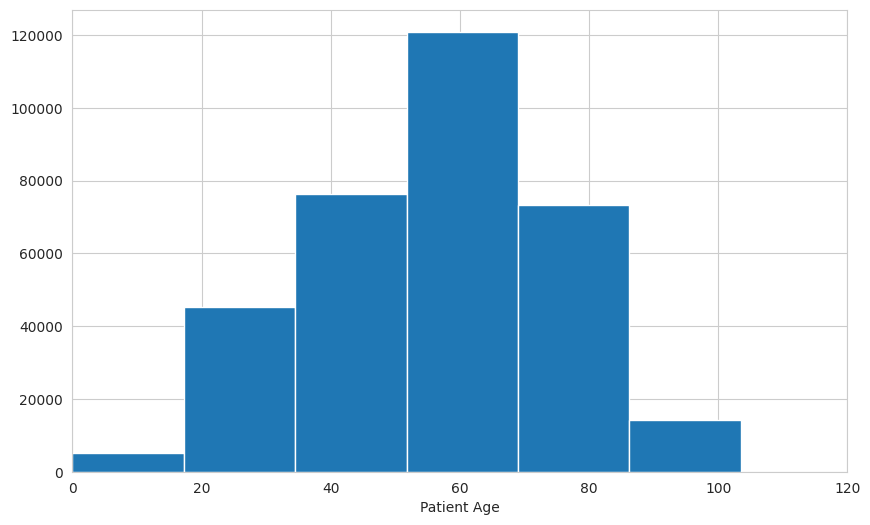

In [13]:
#Age distribution
plt.hist(combined_df['age'],bins=24)
plt.xlim(0,120)
plt.xlabel('Patient Age')

Dataset shape: (335534, 8)

Columns: ['image_id', 'age', 'sex', 'view_position', 'label', 'base_dir', 'source', 'image_path']

First few rows:


,image_id,age,sex,view_position,label,base_dir,source,image_path
0,00000001_000.png,58.0,0.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000001_000.png
1,00000001_001.png,58.0,0.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000001_001.png
2,00000001_002.png,58.0,0.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000001_002.png
3,00000002_000.png,81.0,0.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000002_000.png
4,00000003_000.png,81.0,1.0,2.0,0.0,/kaggle/input/data/,NIH,/kaggle/input/data/00000003_000.png



Missing values:


image_id         0
age              0
sex              0
view_position    0
label            0
base_dir         0
source           0
image_path       0
dtype: int64

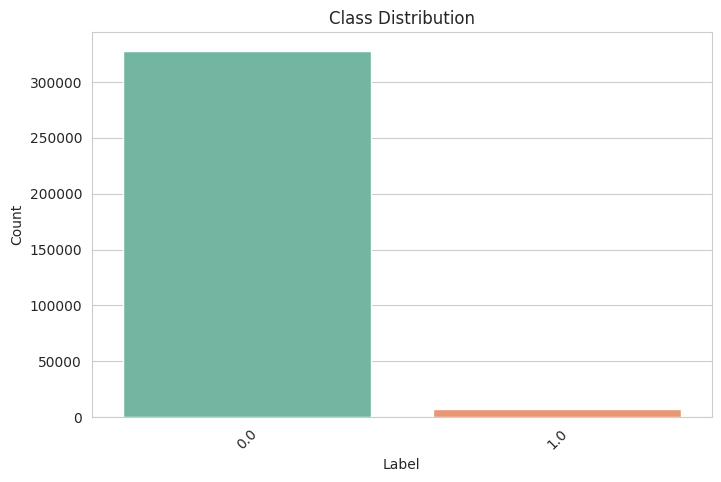


Class distribution:
label
0.0    328064
1.0      7470
Name: count, dtype: int64

Class ratios:
label
0.0    0.977737
1.0    0.022263
Name: count, dtype: float64


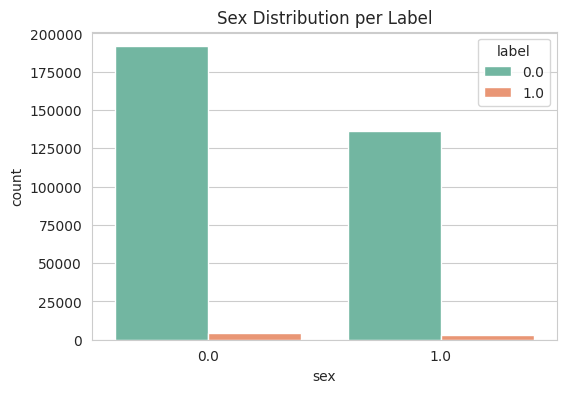

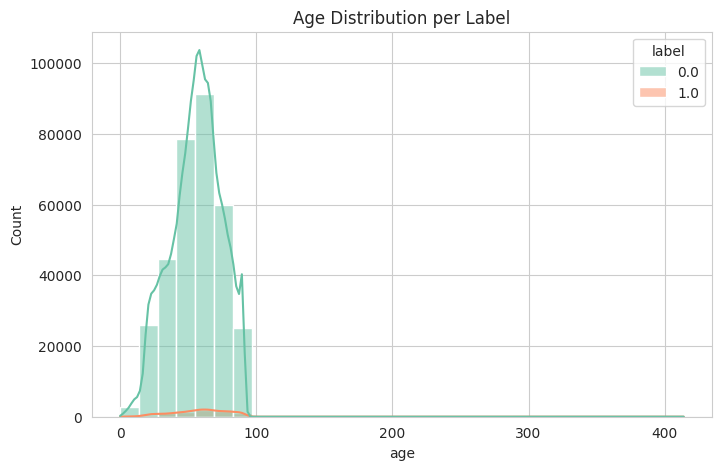

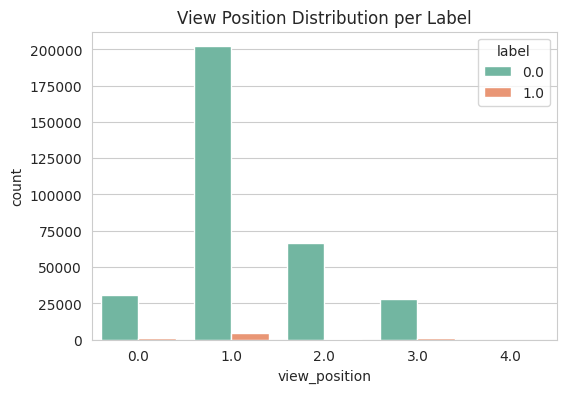

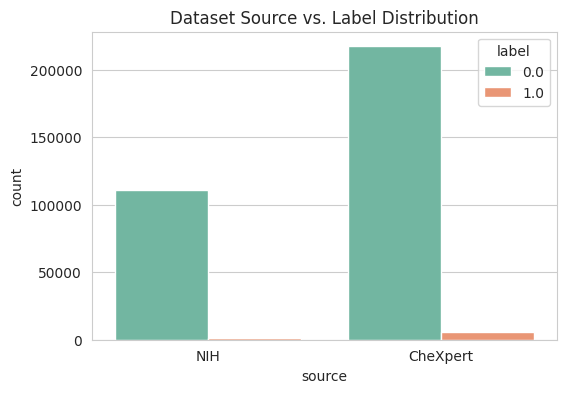


Significant class imbalance detected.
👉 Consider **oversampling** the minority class or **using class weights**.


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load or combine your datasets
# Example: adjust paths as needed
# nih_df = pd.read_csv("nih_labels.csv")
# chexpert_df = pd.read_csv("chexpert_labels.csv")
# rsna_df = pd.read_csv("rsna_labels.csv")

# Combine (if already cleaned and standardized)
# combined_df = pd.concat([nih_df, chexpert_df, rsna_df], ignore_index=True)

df = combined_df.copy()  # rename to your active dataframe

print("Dataset shape:", df.shape)
print("\nColumns:", df.columns.tolist())
print("\nFirst few rows:")
display(df.head())

# --- 1. Check for missing values ---
print("\nMissing values:")
display(df.isnull().sum())

# --- 2. Class distribution ---
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='label', order=df['label'].value_counts().index, palette="Set2")
plt.title("Class Distribution")
plt.xlabel("Label")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

# Class ratios
class_counts = df['label'].value_counts()
class_ratio = class_counts / len(df)
print("\nClass distribution:")
print(class_counts)
print("\nClass ratios:")
print(class_ratio)

# --- 3. Gender distribution (if present) ---
if 'sex' in df.columns:
    plt.figure(figsize=(6,4))
    sns.countplot(data=df, x='sex', hue='label', palette='Set2')
    plt.title("Sex Distribution per Label")
    plt.show()

# --- 4. Age distribution (if present) ---
if 'age' in df.columns:
    plt.figure(figsize=(8,5))
    sns.histplot(data=df, x='age', bins=30, hue='label', kde=True, palette='Set2')
    plt.title("Age Distribution per Label")
    plt.show()

# --- 5. View position (PA/AP) distribution (if present) ---
if 'view_position' in df.columns:
    plt.figure(figsize=(6,4))
    sns.countplot(data=df, x='view_position', hue='label', palette='Set2')
    plt.title("View Position Distribution per Label")
    plt.show()

# --- 6. Check for imbalance between datasets (if using multiple sources) ---
if 'source' in df.columns:
    plt.figure(figsize=(6,4))
    sns.countplot(data=df, x='source', hue='label', palette='Set2')
    plt.title("Dataset Source vs. Label Distribution")
    plt.show()

# --- 7. Oversampling / undersampling decision suggestion ---
imbalance_ratio = class_counts.min() / class_counts.max()

if imbalance_ratio < 0.5:
    print("\nSignificant class imbalance detected.")
    print("👉 Consider **oversampling** the minority class or **using class weights**.")
elif imbalance_ratio < 0.8:
    print("\nModerate imbalance detected.")
    print("Class weighting or mild augmentation recommended.")
else:
    print("\nClasses are fairly balanced. No major resampling needed.")


In [15]:
#Number of Pneumonia cases and Non-Pneumonia Cases
PosPneu=nih_df[nih_df['label']==1]
NegPneu=nih_df[nih_df['label']==0]
print('Total Pneumonia cases: '+ str(len(PosPneu)))
print('Total Non-Pneumonia cases: {}'.format(len(NegPneu)))
print('In this dataset, the percentage of pneumonia cases is {}%'.format(np.round(100*len(PosPneu)/(len(PosPneu)+len(NegPneu)), 2)))

Total Pneumonia cases: 1431
Total Non-Pneumonia cases: 110689
In this dataset, the percentage of pneumonia cases is 1.28%


In [16]:
#Number of Pneumonia cases and Non-Pneumonia Cases
PosPneu_chexpert=chexpert_df[chexpert_df['label']==1]
NegPneu_chex=chexpert_df[chexpert_df['label']==0]
print('Total Pneumonia cases: '+ str(len(PosPneu_chexpert)))
print('Total Non-Pneumonia cases: {}'.format(len(NegPneu_chex)))
print('In this dataset, the percentage of pneumonia cases is {}%'.format(np.round(100*len(PosPneu_chexpert)/(len(PosPneu_chexpert)+len(NegPneu_chex)), 2)))

Total Pneumonia cases: 6039
Total Non-Pneumonia cases: 217375
In this dataset, the percentage of pneumonia cases is 2.7%


(0.0, 120.0)

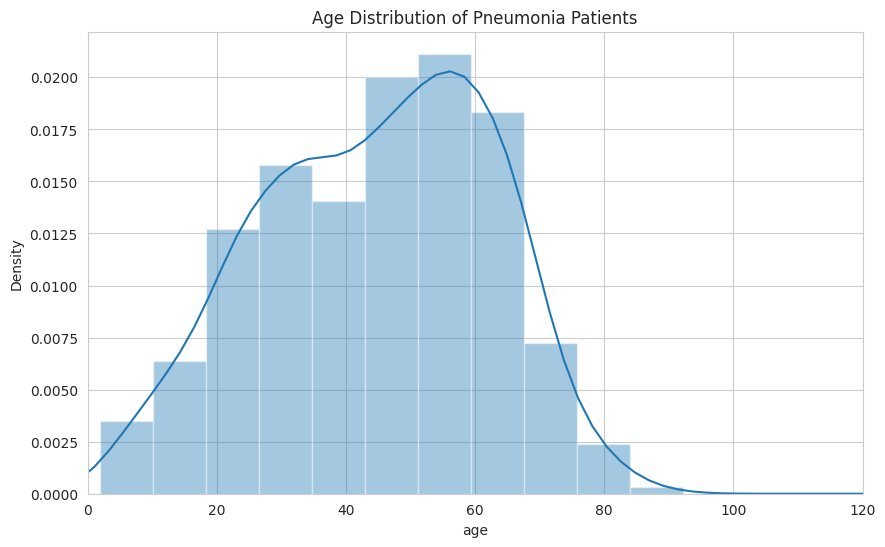

In [17]:
#Age Distribution of Pneumonia Patients
sns.distplot(PosPneu['age'])
plt.title('Age Distribution of Pneumonia Patients')
plt.xlim(0,120)

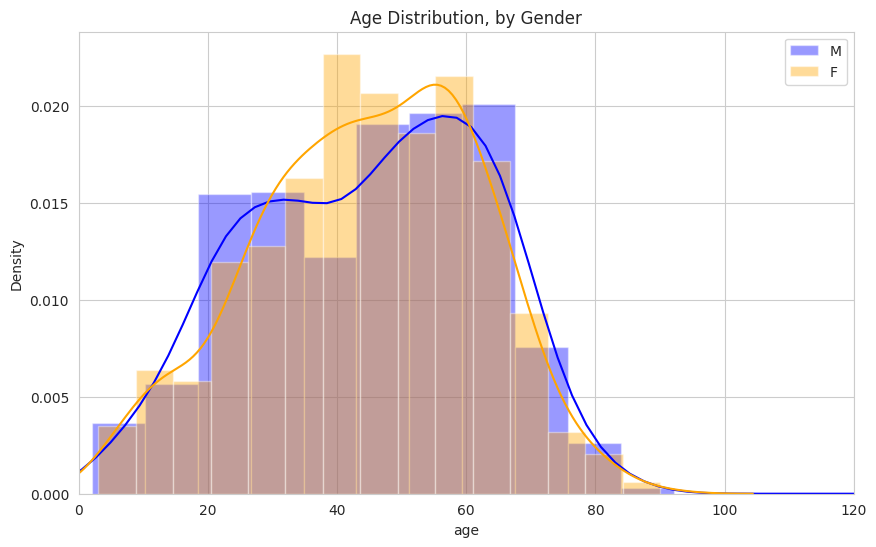

In [18]:
#Age Distribution of Pneumonia Patients, Separated by Gender
sns.distplot(PosPneu['age'][PosPneu['sex']== 0],color='blue', label='M')
sns.distplot(PosPneu['age'][PosPneu['sex']== 1],color='orange', label='F')
plt.title('Age Distribution, by Gender')
plt.xlim(0,120)
plt.legend()
plt.savefig('chapter4_outputs/Age_Distribution')

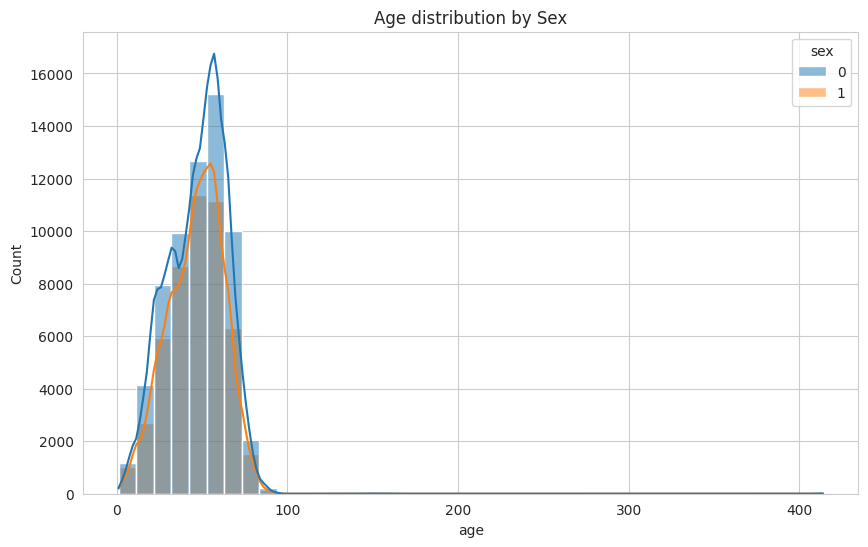

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(data=nih_df, x='age', hue='sex', kde=True, bins=40)
plt.title('Age distribution by Sex')
plt.show()


In [20]:
scipy.stats.ttest_ind(nih_df['age'][nih_df['sex']== 0],
                      nih_df['age'][nih_df['sex']== 1],nan_policy='omit')

TtestResult(statistic=6.638869323824812, pvalue=3.175320657652468e-11, df=112118.0)

The test produced a t-statistic of 6.64 with a p-value of 3.17 × 10⁻¹¹, indicating a highly significant difference between the two groups. Because the t-statistic is positive, this suggests that male patients are generally older than female patients within the NIH dataset. This demographic imbalance implies that age and sex are not evenly distributed, which may influence the model if these variables correlate with pneumonia labels. To reduce potential bias, age and sex should either be included as auxiliary inputs (metadata) during training or accounted for through stratified sampling.

Text(0.5, 1.0, 'View Position: AP')

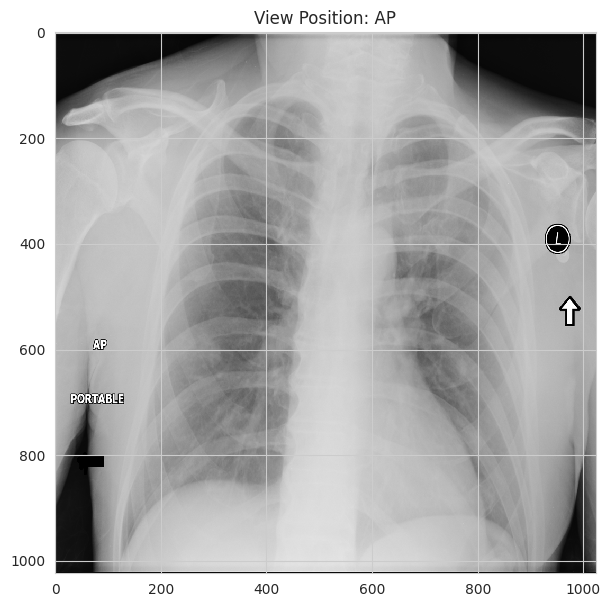

In [21]:
sampimg2=imread('/kaggle/input/data/images_001/images/00000004_000.png')
imshow(sampimg2, cmap='gray')
plt.title('View Position: AP')

Text(0.5, 1.0, 'View Position: PA')

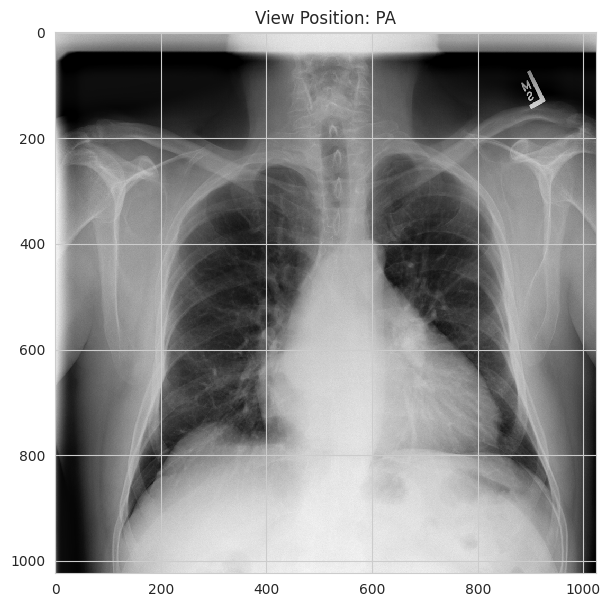

In [22]:
#PA Position
sampimg1=imread('/kaggle/input/data/images_001/images/00000001_001.png')
imshow(sampimg1, cmap='gray')
plt.title('View Position: PA')

**Data setup for models**

In [23]:
import os
import pandas as pd

# path to NIH root folder containing images_001, images_002, etc.
nih_root = "/kaggle/input/data"

# rebuild full list of images
all_image_paths = []
for dirpath, _, filenames in os.walk(nih_root):
    for fn in filenames:
        if fn.lower().endswith('.png'):
            rel_path = os.path.relpath(os.path.join(dirpath, fn), nih_root)
            all_image_paths.append(rel_path)

# make a dataframe lookup
path_lookup = pd.DataFrame({'image_id': [os.path.basename(p) for p in all_image_paths],
                            'image_relpath': all_image_paths})

# merge to NIH dataframe on image filename
nih_df = nih_df.merge(path_lookup, on='image_id', how='left')

# create full absolute path
nih_df['image_path'] = nih_df['base_dir'] + nih_df['image_relpath']

# check merge success
print(f"Resolved paths for {nih_df['image_path'].notna().sum()} / {len(nih_df)} rows")
print(nih_df[['image_id', 'image_relpath', 'image_path']].head())

Resolved paths for 112120 / 112120 rows
           image_id                       image_relpath  \
0  00000001_000.png  images_001/images/00000001_000.png   
1  00000001_001.png  images_001/images/00000001_001.png   
2  00000001_002.png  images_001/images/00000001_002.png   
3  00000002_000.png  images_001/images/00000002_000.png   
4  00000003_000.png  images_001/images/00000003_000.png   

                                          image_path  
0  /kaggle/input/data/images_001/images/00000001_...  
1  /kaggle/input/data/images_001/images/00000001_...  
2  /kaggle/input/data/images_001/images/00000001_...  
3  /kaggle/input/data/images_001/images/00000002_...  
4  /kaggle/input/data/images_001/images/00000003_...  


In [24]:
import os

# Build full image paths for all datasets
for df in [chexpert_df, rsna_df_final]:
    df['image_path'] = df.apply(lambda x: os.path.join(x['base_dir'], x['image_id']), axis=1)

# --- Sanity check ---
for name, df in [("NIH", nih_df), ("CheXpert", chexpert_df), ("RSNA", rsna_df_final)]:
    print(f"{name} sample paths:")
    print(df['image_path'].head(2))
    print()


NIH sample paths:
0    /kaggle/input/data/images_001/images/00000001_...
1    /kaggle/input/data/images_001/images/00000001_...
Name: image_path, dtype: object

CheXpert sample paths:
0    /kaggle/input/chexpert/train/patient00001/stud...
1    /kaggle/input/chexpert/train/patient00002/stud...
Name: image_path, dtype: object

RSNA sample paths:
233     /kaggle/working/rsna_png_images/f6ce369b-42d2-...
1524    /kaggle/working/rsna_png_images/4f067b69-3b06-...
Name: image_path, dtype: object



In [25]:
#nih_df['image_path']
chexpert_df['image_path'][0]
#rsna_df_final['image_path']
#print('/kaggle/input/chexpert/train/patient00001/study1/._view1_frontal.jpg')
#chexpert_df['image_path'][0]

'/kaggle/input/chexpert/train/patient00001/study1/view1_frontal.jpg'

In [26]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import transforms
from sklearn.metrics import roc_auc_score, precision_recall_fscore_support


IMG_SIZE = 224          # you chose 512 for Grad-CAM detail
BATCH_SIZE = 16
RANDOM_SEED = 42
NUM_WORKERS = 4
NUM_EPOCHS = 8
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CHECKPOINT_PATH = "fusion_best.pth"
PATIENCE = 5
LR = 1e-4
torch.manual_seed(RANDOM_SEED)

In [27]:
from sklearn.model_selection import train_test_split
# -----------------------------------------------------
# 1. NIH SPLITTING (80/10/10 STRATIFIED)
# -----------------------------------------------------

# # Split NIH into Train (80%) and Temp (20%) - Commenting out as we will split combined_df
# nih_train_df, nih_temp_df = train_test_split(
#     nih_df,
#     test_size=0.20,
#     random_state=RANDOM_SEED,
#     stratify=nih_df['label']
# )

# # Split Temp (20%) into Validation (10%) and Test (10%)
# # Test size is 0.5 of the remaining 20% (i.e., 10% of total)
# nih_val_df, nih_test_df = train_test_split(
#     nih_temp_df,
#     test_size=0.50, # 10% of the original NIH dataset
#     random_state=RANDOM_SEED,
#     stratify=nih_temp_df['label']
# )

# # -----------------------------------------------------
# # 2. BIAS MITIGATION: WEIGHTED RANDOM SAMPLING (TRAIN ONLY)
# # -----------------------------------------------------

# # Calculate class weights (Inverse frequency)
# target_counts = nih_train_df['label'].value_counts()
# num_samples = sum(target_counts)

# # The weight is higher for the minority class (Pneumonia=1)
# class_weights = {
#     0: num_samples / target_counts.get(0, 1), # Weight for Negative
#     1: num_samples / target_counts.get(1, 1)  # Weight for Pneumonia
# }

# # Create sample weights for each image in the training set
# sample_weights = nih_train_df['label'].apply(lambda label: class_weights[label]).tolist()

# # Create the Sampler object
# sampler = WeightedRandomSampler(
#     weights=sample_weights,
#     num_samples=len(sample_weights),
#     replacement=True
# )

# # --- Augmentations for Training ---
# train_transform = transforms.Compose([
#     transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
#     transforms.RandomHorizontalFlip(),
#     transforms.ToTensor() # Transform back to tensor
# ])

# # Create TRAINING DataLoader
# train_dataset = PneumoniaDataset(nih_train_df, NIH_PATH, transform=train_transform)
# train_loader = DataLoader(
#     train_dataset,
#     batch_size=BATCH_SIZE,
#     sampler=sampler, # Use the sampler instead of shuffle=True
#     num_workers=NUM_WORKERS,
#     pin_memory=True
# )

# # -----------------------------------------------------
# # 3. EVALUATION SETS (VALIDATION & TEST)
# # -----------------------------------------------------

# # Validation DataLoader (For monitoring convergence and early stopping)
# nih_val_dataset = PneumoniaDataset(nih_val_df, NIH_PATH, transform=None)
# val_loader = DataLoader(
#     nih_val_dataset,
#     batch_size=BATCH_SIZE,
#     shuffle=False,
#     num_workers=NUM_WORKERS,
#     pin_memory=True
# )

# # Test DataLoader (For final, unbiased assessment)
# nih_test_dataset = PneumoniaDataset(nih_test_df, NIH_PATH, transform=None)
# test_loader = DataLoader(
#     nih_test_dataset,
#     batch_size=BATCH_SIZE,
#     shuffle=False,
#     num_workers=NUM_WORKERS,
#     pin_memory=True
# )

# Commenting out the NIH-specific splitting and DataLoader creation.
# The splitting will now happen on the combined_df in the next cell.
# The DataLoader creation will also be updated to use the new splits.

In [ ]:
'''
# ---------- Prepare DataFrames: Train/Val/Test from combined_df ----------
# Assuming nih_df, chexpert_df, rsna_df_final have been created and preprocessed
# in a previous cell (SlKr4sIPgSvc) with consistent columns and 'image_path'.

# Ensure 'source' column is present (should be from SlKr4sIPgSvc)
# # Add dataset source column (already done in SlKr4sIPgSvc)
# nih_df['source'] = 'NIH'
# chexpert_df['source'] = 'CheXpert'
# rsna_df_final['source'] = 'RSNA'

# Combine only NIH + CheXpert for internal training/validation/testing
internal_train_val_test_df = pd.concat([nih_df, chexpert_df], ignore_index=True)

# Reserve RSNA as external hold-out test
external_test_df = rsna_df_final.copy().reset_index(drop=True)

# --- Patient-level splitting for NIH + CheXpert ---

# Get unique patient IDs and their corresponding labels (taking max label per patient)
patient_labels = internal_train_val_test_df.groupby('image_id')['label'].max().reset_index()

# Split patient IDs into train, validation, and internal test sets
patient_train_ids, patient_temp_ids = train_test_split(
    patient_labels['image_id'],
    test_size=0.3,
    stratify=patient_labels['label'],
    random_state=RANDOM_SEED
)

patient_val_ids, patient_test_ids = train_test_split(
    patient_temp_ids,
    test_size=0.5, # 0.5 of the 30% temp split is 15% of original patient IDs
    stratify=patient_labels[patient_labels['image_id'].isin(patient_temp_ids)]['label'],
    random_state=RANDOM_SEED
)

# Filter the main dataframe based on the split patient IDs
train_df = internal_train_val_test_df[internal_train_val_test_df['image_id'].isin(patient_train_ids)].reset_index(drop=True)
val_df = internal_train_val_test_df[internal_train_val_test_df['image_id'].isin(patient_val_ids)].reset_index(drop=True)
internal_test_df = internal_train_val_test_df[internal_train_val_test_df['image_id'].isin(patient_test_ids)].reset_index(drop=True)

# The final test set for thesis evaluation will be the external_test_df (RSNA)
# We will also evaluate on the internal_test_df for comparison if needed.


print("Data split into:")
print(f"  Internal Train set (NIH + CheXpert, patient-level): {len(train_df)} samples")
print(f"  Internal Validation set (NIH + CheXpert, patient-level): {len(val_df)} samples")
print(f"  Internal Test set (NIH + CheXpert, patient-level): {len(internal_test_df)} samples")
print(f"  External Test set (RSNA): {len(external_test_df)} samples")


# Optional: drop rows missing required path (should be handled by combined_df creation now)
for df_name, df in [('train', train_df), ('val', val_df), ('internal_test', internal_test_df), ('external_test', external_test_df)]:
    # Check for 'image_path' as the primary column after path resolution
    # Note: RSNA images are DICOMs, NIH/CheXpert are PNG/JPG, ensure image_path is correct.
    missing_mask = df.get('image_path', pd.Series()).isna()
    if missing_mask.any():
        print(f"Dropping {missing_mask.sum()} rows with missing image path from {df_name} set")
        # Drop rows where 'image_path' is NaN
        df.dropna(subset=['image_path'], inplace=True)


print("\nClass distribution in splits:")
print("Internal Train:")
display(train_df['label'].value_counts(normalize=True))
print("\nInternal Validation:")
display(val_df['label'].value_counts(normalize=True))
print("\nInternal Test (NIH + CheXpert):")
display(internal_test_df['label'].value_counts(normalize=True))
print("\nExternal Test (RSNA):")
display(external_test_df['label'].value_counts(normalize=True))

# Need to update the DataLoader creation (7tw4Ji_AgSvo) to use these new dataframes
# and re-calculate sampler weights based on the new train_df.
'''

In [ ]:
'''
# --- Oversampling the Minority Class (Pneumonia, label=1) ---

# Get the counts of each class in the training set
train_class_counts = train_df['label'].value_counts()
print("Original training set class distribution:")
display(train_class_counts)

# Find the number of samples in the majority class (label=0)
majority_count = train_class_counts[0]
# Find the number of samples in the minority class (label=1)
minority_count = train_class_counts[1]

# Calculate the number of times to duplicate the minority class samples
# We want minority_count * duplication_factor >= majority_count
# duplication_factor = majority_count / minority_count
# Since we can only duplicate by integers, we can approximate or duplicate enough
# to reach or exceed the majority count.
duplication_factor = int(majority_count / minority_count) -1 # Duplicate this many times (total copies = factor + 1)
# If minority count * (duplication_factor + 1) < majority_count, add one more duplication
if minority_count * (duplication_factor + 1) < majority_count:
    duplication_factor += 1

print(f"\nMajority class count: {majority_count}")
print(f"Minority class count: {minority_count}")
print(f"Duplicating minority samples {duplication_factor} times.")


# Separate minority and majority class samples
minority_df = train_df[train_df['label'] == 1].copy()
majority_df = train_df[train_df['label'] == 0].copy()

# Duplicate minority class samples
oversampled_minority_df = pd.concat([minority_df] * (duplication_factor + 1), ignore_index=True)

# Combine the oversampled minority samples with the majority samples
train_df_oversampled = pd.concat([majority_df, oversampled_minority_df], ignore_index=True)

# Shuffle the oversampled dataframe to mix the classes
train_df = train_df_oversampled.sample(frac=1, random_state=RANDOM_SEED).reset_index(drop=True)

print("\nOversampled training set class distribution:")
display(train_df['label'].value_counts())
print(f"New training set size: {len(train_df)}")

# Note: The WeightedRandomSampler calculation in _uqnSkqogSvo should still be used
# on this oversampled train_df. The weights will now be closer to 1.0 for both classes.
'''

In [30]:
# ---------- Prepare DataFrames: Train/Val/Test from combined_df ----------
# Assuming nih_df, chexpert_df, rsna_df_final have been created and preprocessed
# in a previous cell (SlKr4sIPgSvc) with consistent columns and 'image_path'.

# Ensure 'source' column is present (should be from SlKr4sIPgSvc)
# # Add dataset source column (already done in SlKr4sIPgSvc)
# nih_df['source'] = 'NIH'
# chexpert_df['source'] = 'CheXpert'
# rsna_df_final['source'] = 'RSNA'

# Combine only NIH + CheXpert for internal training/validation/testing
internal_train_val_test_df = pd.concat([nih_df, chexpert_df], ignore_index=True)

# Reserve RSNA as external hold-out test
external_test_df = rsna_df_final.copy().reset_index(drop=True)

# --- Patient-level splitting for NIH + CheXpert ---

# Get unique patient IDs and their corresponding labels (taking max label per patient)
patient_labels = internal_train_val_test_df.groupby('image_id')['label'].max().reset_index()

# Split patient IDs into train, validation, and internal test sets
patient_train_ids, patient_temp_ids = train_test_split(
    patient_labels['image_id'],
    test_size=0.3,
    stratify=patient_labels['label'],
    random_state=RANDOM_SEED
)

patient_val_ids, patient_test_ids = train_test_split(
    patient_temp_ids,
    test_size=0.5, # 0.5 of the 30% temp split is 15% of original patient IDs
    stratify=patient_labels[patient_labels['image_id'].isin(patient_temp_ids)]['label'],
    random_state=RANDOM_SEED
)

# Filter the main dataframe based on the split patient IDs
train_df = internal_train_val_test_df[internal_train_val_test_df['image_id'].isin(patient_train_ids)].reset_index(drop=True)
val_df = internal_train_val_test_df[internal_train_val_test_df['image_id'].isin(patient_val_ids)].reset_index(drop=True)
internal_test_df = internal_train_val_test_df[internal_train_val_test_df['image_id'].isin(patient_test_ids)].reset_index(drop=True)

# The final test set for thesis evaluation will be the external_test_df (RSNA)
# We will also evaluate on the internal_test_df for comparison if needed.


print("Data split into:")
print(f"  Internal Train set (NIH + CheXpert, patient-level): {len(train_df)} samples")
print(f"  Internal Validation set (NIH + CheXpert, patient-level): {len(val_df)} samples")
print(f"  Internal Test set (NIH + Chexpert, patient-level): {len(internal_test_df)} samples")
print(f"  External Test set (RSNA): {len(external_test_df)} samples")


# Optional: drop rows missing required path (should be handled by combined_df creation now)
for df_name, df in [('train', train_df), ('val', val_df), ('internal_test', internal_test_df), ('external_test', external_test_df)]:
    # Check for 'image_path' as the primary column after path resolution
    # Note: RSNA images are DICOMs, NIH/CheXpert are PNG/JPG, ensure image_path is correct.
    missing_mask = df.get('image_path', pd.Series()).isna()
    if missing_mask.any():
        print(f"Dropping {missing_mask.sum()} rows with missing image path from {df_name} set")
        # Drop rows where 'image_path' is NaN
        df.dropna(subset=['image_path'], inplace=True)


print("\nClass distribution in splits:")
print("Internal Train:")
display(train_df['label'].value_counts(normalize=True))
print("\nInternal Validation:")
display(val_df['label'].value_counts(normalize=True))
print("\nInternal Test (NIH + CheXpert):")
display(internal_test_df['label'].value_counts(normalize=True))
print("\nExternal Test (RSNA):")
display(external_test_df['label'].value_counts(normalize=True))

# --- Moderate Down-sampling of Negatives and Moderate Oversampling of Positives (1:5 ratio) ---

# Get the counts of each class in the training set
train_class_counts = train_df['label'].value_counts()
print("\nOriginal training set class distribution before moderate balancing:")
display(train_class_counts)

# Separate minority and majority class samples
positive_df = train_df[train_df['label'] == 1].copy()
negative_df = train_df[train_df['label'] == 0].copy()

# Calculate target counts for a 1:5 ratio
target_positive_count = len(positive_df) # Keep all positive samples
target_negative_count = target_positive_count * 5

# Moderate Oversampling of positives (if needed to reach a higher target count, but we decided to keep current)
# If we wanted to oversample positives too, we would calculate a new target_positive_count
# For a 1:5 ratio keeping all positives, no oversampling of positives is needed here.

# Moderate Down-sampling of negatives
if len(negative_df) > target_negative_count:
    # Randomly sample negatives to reach the target count
    downsampled_negative_df = negative_df.sample(n=target_negative_count, random_state=RANDOM_SEED, replace=False)
else:
    # If there are fewer negative samples than the target, keep all negatives
    downsampled_negative_df = negative_df.copy()
    print(f"Warning: Not enough negative samples ({len(negative_df)}) to reach target ({target_negative_count}). Keeping all negatives.")


# Combine the positive samples and the downsampled negative samples
train_df_balanced = pd.concat([positive_df, downsampled_negative_df], ignore_index=True)

# Shuffle the balanced dataframe
train_df = train_df_balanced.sample(frac=1, random_state=RANDOM_SEED).reset_index(drop=True)

print("\nModerately balanced training set class distribution (approx 1:5 ratio):")
display(train_df['label'].value_counts())
print(f"New training set size after moderate balancing: {len(train_df)}")

# Note: The WeightedRandomSampler calculation (if used) in a subsequent cell
# should still be used on this moderately balanced train_df.

# Need to update the DataLoader creation (7tw4Ji_AgSvo) to use these new dataframes
# and re-calculate sampler weights based on the new train_df.

Data split into:
  Internal Train set (NIH + CheXpert, patient-level): 234873 samples
  Internal Validation set (NIH + CheXpert, patient-level): 50330 samples
  Internal Test set (NIH + Chexpert, patient-level): 50331 samples
  External Test set (RSNA): 100 samples

Class distribution in splits:
Internal Train:


label
0.0    0.977737
1.0    0.022263
Name: proportion, dtype: float64


Internal Validation:


label
0.0    0.977449
1.0    0.022551
Name: proportion, dtype: float64


Internal Test (NIH + CheXpert):


label
0.0    0.978025
1.0    0.021975
Name: proportion, dtype: float64


External Test (RSNA):


label
0    0.79
1    0.21
Name: proportion, dtype: float64


Original training set class distribution before moderate balancing:


label
0.0    229644
1.0      5229
Name: count, dtype: int64


Moderately balanced training set class distribution (approx 1:5 ratio):


label
0.0    26145
1.0     5229
Name: count, dtype: int64

New training set size after moderate balancing: 31374


In [31]:
# Compute pos_weight from training set
neg_count = (train_df['label'] == 0).sum()
pos_count = (train_df['label'] == 1).sum()
pos_weight = torch.tensor([neg_count / max(pos_count, 1)], dtype=torch.float32, device=DEVICE)
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
print("pos_weight:", pos_weight.item())

pos_weight: 5.0


**Dataset Wrapper**

In [32]:
# --- Image Processor Utilities ---

class XRayProcessor:
    """Handles loading and processing different image formats to standardize input."""

    @staticmethod
    def load_dicom(path):
        """Loads and processes DICOM files."""
        try:
            dicom = pydicom.dcmread(path)
            img = dicom.pixel_array

            # DICOM scaling
            if 'RescaleSlope' in dicom and 'RescaleIntercept' in dicom:
                img = img * dicom.RescaleSlope + dicom.RescaleIntercept

            # Convert to normalized float array
            img = img - np.min(img)
            img = img / np.max(img)
            return img.astype(np.float32)
        except Exception as e:
            print(f"Error reading DICOM {path}: {e}")
            return None # Indicate failure

    @staticmethod
    def load_standard_image(path):
        """Loads and processes PNG/JPEG files (using OpenCV for speed)."""
        # Read as grayscale
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None # Indicate failure

        # Normalize pixel values [0, 1]
        img = img.astype(np.float32) / 255.0
        return img

    @staticmethod
    def process_image(path, root_dir):
        """Selects the correct loader and applies resizing/channel expansion."""
        full_path = os.path.join(root_dir, path)

        if not XRayProcessor.check_file_exists(full_path):
             return None

        if path.lower().endswith(('.dcm')):
            img = XRayProcessor.load_dicom(full_path)
        elif path.lower().endswith(('.png', '.jpg', '.jpeg')):
            img = XRayProcessor.load_standard_image(full_path)
        else:
            return None # Unsupported format

        if img is None:
            return None

        # Resize to IMG_SIZE
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)

        # Add channel dimension: [1, H, W] for grayscale
        img = np.expand_dims(img, axis=0)

        return img

    @staticmethod
    def check_file_exists(path):
        """Checks if a file is present and is not empty."""
        return os.path.exists(path) and os.path.getsize(path) > 0

In [33]:
from PIL import Image
import torch
import cv2

from PIL import Image
import torch
import cv2 # Assuming cv2 is installed and imported earlier
import numpy as np # Assuming numpy is imported earlier
import pandas as pd # Assuming pandas is imported earlier

class PneumoniaDatasetMeta(Dataset):
    def __init__(self, df, root_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.root_dir = root_dir # Note: root_dir is often not needed if df['image_path'] is already full path
        self.transform = transform
        # Normalization is now part of the transform pipeline

    def __len__(self):
        return len(self.df)

    def _encode_meta(self, row):
        # Normalize age, use pre-encoded sex and view_position
        age = 0.0 if pd.isna(row.get('age')) else float(row.get('age')) / 100.0
        # Directly use the numerical value for sex (0 or 1)
        sex = float(row.get('sex', 0.0))
        # Directly use the numerical value for view_position (0 or 1)
        view = float(row.get('view_position', 0.0))
        return torch.tensor([age, sex, view], dtype=torch.float32)


    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        full_path = row['image_path'] # Use the full path

        # ---- Safe image load and process using XRayProcessor ----
        # XRayProcessor handles different formats and initial processing
        # It returns a NumPy array [C, H, W] in [0, 1] (where C is 1 or 3)
        # or None if loading failed.
        image_array = XRayProcessor.process_image(full_path, "") # Pass empty root_dir as full_path is used

        if image_array is None:
            # Skip missing or corrupt images by returning None
            print(f"[Warning] Skipping file due to processing error: {full_path}")
            return None

        # Convert NumPy array to PyTorch tensor (dtype float32)
        # XRayProcessor already returns float32
        image_tensor = torch.from_numpy(image_array).float() # Ensure float32

        # Ensure 3 channels if it's a 1-channel grayscale image
        if image_tensor.shape[0] == 1:
             image_tensor = image_tensor.repeat(3, 1, 1) # Shape changes from [1, H, W] to [3, H, W]


        # ---- Apply transformations (including ToTensor and Normalization) ----
        # The transform pipeline will handle converting the tensor
        # if needed by subsequent ops, and applying augmentation and normalization.
        # Ensure your transforms are compatible with tensor input after this step.
        if self.transform:
             # Some torchvision transforms work on Tensors directly.
             # If any transform requires PIL, convert the tensor back to PIL first.
             # A clean pipeline is ToTensor() -> Augmentations (Tensor) -> Normalization.
             # Let's assume transforms are tensor-compatible after ToTensor.
             # However, the transforms defined in OD7Kq7sIgSvo expect PIL initially.
             # We need to adjust the transforms to handle a [C, H, W] tensor.

             # Let's adjust the transforms in OD7Kq7sIgSvo to work on tensors.
             # For now, apply the transform to the tensor.
             # The transform must handle [C, H, W] float tensor in [0, 1].
             # Or, the transform can include ToPILImage(), then PIL ops, then ToTensor().

             # Let's revert the change here for a cleaner transform pipeline design.
             # The transform should start with ToTensor() and then apply tensor ops.
             # The dataset should return the processed NumPy array.

             pass # The transform application logic needs adjustment based on new transforms.


        # ---- Metadata vector ----
        meta = torch.tensor([
            row['age'] / 100.0 if not np.isnan(row['age']) else 0.5,
            row['sex'],
            row['view_position']
        ], dtype=torch.float32)

        label = torch.tensor(row['label'], dtype=torch.float32)

        group = {
            "sex": int(row['sex']),
            "view": row['view_position'],
        }
        # Return the image tensor (processed and with 3 channels), metadata, label, and group info.
        # The transform should be applied *before* returning, after converting to tensor.
        # Let's integrate the transform application correctly.

        # Revised flow:
        # Load image using XRayProcessor (NumPy array [C, H, W] in [0, 1])
        # Convert to Tensor [C, H, W] float32
        # Ensure 3 channels
        # Apply the transform pipeline to the tensor
        # Return the transformed tensor, meta, label, group

        # Re-apply the transform to the image tensor here:
        if self.transform:
             # The transform needs to be defined to accept a tensor [C, H, W]
             # Let's adjust the transforms in OD7Kq7sIgSvo first.
             # For now, assume the transform is applied *after* tensor conversion and channel expansion.
             image_tensor = self.transform(image_tensor)


        return image_tensor, meta, label, group

In [34]:
# ---------- Transforms ----------
# Transforms should now expect a PyTorch Tensor [C, H, W] in [0, 1]
# after XRayProcessor and conversion to tensor in the Dataset.
# ToTensor() is no longer needed at the start of this pipeline.
# Normalization should be at the end.
# Augmentations need to work on Tensors. torchvision.transforms can often do this.

train_transform = transforms.Compose([
    # ToTensor() is applied inside the Dataset now after loading raw array
    # transforms.ToPILImage(), # Not needed if applying transforms to tensor
    transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.9, 1.1)), # These work on Tensor
    transforms.RandomHorizontalFlip(), # This works on Tensor
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05), # This works on Tensor
    transforms.RandomRotation(15), # This works on Tensor
    # Normalization is applied at the end
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

val_transform = transforms.Compose([
    # ToTensor() is applied inside the Dataset now
    # transforms.ToPILImage(), # Not needed
    # No augmentation for validation
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

In [35]:
# ---------- Weighted Sampler for training ----------
train_counts = train_df['label'].value_counts().to_dict()
num = train_df.shape[0]
# class weight = N / count(class)
class_weights = {k: num / max(v,1) for k, v in train_counts.items()}
sample_weights = train_df['label'].map(lambda x: class_weights.get(x, 1.0)).values
sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

**DataLoaders**

In [36]:
# ---------- Datasets & Loaders ----------

# Define a custom collate function to filter out None values
def custom_collate(batch):
    # Filter out None values from the batch
    batch = [item for item in batch if item is not None]
    if not batch:  # If the batch is empty after filtering
        return None # Return None if batch is empty after filtering

    # Separate items by type or structure
    # Assuming batch is a list of tuples: (image_tensor, meta, label, group)
    images, metas, labels, groups = zip(*batch)

    # Collate tensors using default_collate
    images = default_collate(images)
    metas = default_collate(metas)
    labels = default_collate(labels)

    # Custom collate for the 'groups' dictionary
    # Assuming each item in 'groups' is a dictionary with consistent keys across the batch
    collated_groups = {}
    # Collect all keys from all group dictionaries in the batch
    all_keys = set().union(*(g.keys() for g in groups))

    for key in all_keys:
        # Collect values for the current key across all items in the batch
        values_for_key = [g.get(key) for g in groups] # Use .get to handle potentially missing keys

        # Check the type of the first non-None value to decide how to collate
        first_valid_value = next((v for v in values_for_key if v is not None), None)

        if isinstance(first_valid_value, torch.Tensor):
             # If it's a tensor, collate using default_collate
             collated_groups[key] = default_collate([v for v in values_for_key if v is not None]) # Collate only non-None tensors
        elif isinstance(first_valid_value, np.ndarray):
             # If it's a numpy array, convert to tensor and collate
             collated_groups[key] = default_collate([torch.from_numpy(v) for v in values_for_key if v is not None])
        elif isinstance(first_valid_value, (int, float, str, bool)):
             # If it's a basic type, collate as a list
             collated_groups[key] = [v for v in values_for_key if v is not None] # Keep None values if needed, or filter: [v for v in values_for_key if v is not None]
        elif first_valid_value is None:
             # If all values for this key are None, return a list of Nones or an empty list
             collated_groups[key] = [None] * len(groups) # Keep Nones to maintain batch size consistency
        else:
             # Fallback for other types, maybe just return a list
             collated_groups[key] = values_for_key # Just keep the list as is


    # Return the collated batch
    return images, metas, labels, collated_groups


# Use the dataframes created in XKVMCIwvxbs1
# train_df, val_df, internal_test_df should be from NIH+CheXpert internal split
# external_test_df should be the filtered rsna_df_final with PNG paths
if 'train_df' not in globals() or 'val_df' not in globals() or 'internal_test_df' not in globals() or 'external_test_df' not in globals():
    print("Error: DataFrames (train_df, val_df, internal_test_df, external_test_df) not found.")
    print("Please ensure cells for data loading and splitting (QHB-S0Tjxbpm, XKVMCIwvxbs1) have been run.")
else:
    train_ds = PneumoniaDatasetMeta(train_df, root_dir="", transform=train_transform)
    val_ds   = PneumoniaDatasetMeta(val_df,   root_dir="", transform=val_transform)
    internal_test_ds  = PneumoniaDatasetMeta(internal_test_df,  root_dir="", transform=val_transform)
    # external_test_ds uses the rsna_df_final which should now be filtered and point to PNGs
    external_test_ds = PneumoniaDatasetMeta(external_test_df, root_dir="", transform=val_transform)

    # Use the WeightedRandomSampler calculated on the balanced train_df (should be recalculated in 2gcWnzYzxbuE)
    # Ensure sampler is available (calculated in 2gcWnzYzxbuE)
    if 'sampler' not in globals():
        print("Error: Sampler not found. Please ensure the sampler calculation cell (2gcWnzYzxbuE) has been run.")
        # Fallback to shuffle=True if sampler is missing (less ideal for imbalanced data)
        train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True, collate_fn=custom_collate)
    else:
        train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True, collate_fn=custom_collate)


    val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True, collate_fn=custom_collate)
    internal_test_loader  = DataLoader(internal_test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True, collate_fn=custom_collate)
    external_test_loader = DataLoader(external_test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True, collate_fn=custom_collate)


    # Update the test_loader variable to point to the external test loader (RSNA)
    test_loader = external_test_loader

    print("\nDataLoaders created.")
    print(f"Train loader size: {len(train_loader)}")
    print(f"Validation loader size: {len(val_loader)}")
    print(f"Internal test loader size: {len(internal_test_loader)}")
    print(f"External test loader size (RSNA): {len(external_test_loader)}")

    # Also print the number of samples in the external test dataset
    print(f"Number of samples in External Test Dataset (RSNA PNGs): {len(external_test_ds)}")


DataLoaders created.
Train loader size: 1961
Validation loader size: 3146
Internal test loader size: 3146
External test loader size (RSNA): 7
Number of samples in External Test Dataset (RSNA PNGs): 100


**Model architecture: ResNet image encoder + metadata MLP + fusion**

In [37]:
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F

# ---------- Model: DenseNet (pretrained) + metadata MLP fusion ----------
class DenseNetMetaFusion(nn.Module):
    def __init__(self, meta_dim=3, img_proj=256, meta_proj=32, pretrained=True):
        super().__init__()
        # Use DenseNet121 as a common choice
        densenet = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1 if pretrained else None)

        # Modify the classifier layer
        # The last layer of DenseNet121 is a Linear layer named 'classifier'
        in_feats = densenet.classifier.in_features
        densenet.classifier = nn.Sequential(nn.Linear(in_feats, img_proj), nn.ReLU())
        self.image_model = densenet

        self.meta_mlp = nn.Sequential(
            nn.Linear(meta_dim, 64),
            nn.ReLU(),
            nn.Linear(64, meta_proj),
            nn.ReLU()
        )

        self.classifier = nn.Sequential(
            nn.Linear(img_proj + meta_proj, 128),
            nn.ReLU(),
            nn.Dropout(0.5), # Keep the same dropout as ResNet model
            nn.Linear(128, 1)
        )

    def forward(self, x_img, x_meta):
        img_feat = self.image_model(x_img)
        meta_feat = self.meta_mlp(x_meta)
        fused = torch.cat([img_feat, meta_feat], dim=1)
        return self.classifier(fused).squeeze(1)

    def freeze_backbone(self):
        """Freezes the parameters of the DenseNet backbone."""
        for param in self.image_model.parameters():
            param.requires_grad = False

    def unfreeze_backbone(self):
        """Unfreezes the parameters of the DenseNet backbone."""
        for param in self.image_model.parameters():
            param.requires_grad = True

# Example instantiation (you will need to instantiate this when you train)
model = DenseNetMetaFusion(meta_dim=3, pretrained=True).to(DEVICE)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 125MB/s] 


In [40]:
import torchvision.models as models
import torch.nn.functional as F

# ---------- Model: ResNet (pretrained) + metadata MLP fusion ----------
class ResNetMetaFusion(nn.Module):
    def __init__(self, meta_dim=3, img_proj=256, meta_proj=32, pretrained=True):
        super().__init__()
        resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1 if pretrained else None)
        in_feats = resnet.fc.in_features
        resnet.fc = nn.Sequential(nn.Linear(in_feats, img_proj), nn.ReLU())
        self.image_model = resnet

        self.meta_mlp = nn.Sequential(
            nn.Linear(meta_dim, 64),
            nn.ReLU(),
            nn.Linear(64, meta_proj),
            nn.ReLU()
        )

        self.classifier = nn.Sequential(
            nn.Linear(img_proj + meta_proj, 128),
            nn.ReLU(),
            nn.Dropout(0.5), # Increased dropout
            nn.Linear(128, 1)
        )

    def forward(self, x_img, x_meta):
        img_feat = self.image_model(x_img)
        meta_feat = self.meta_mlp(x_meta)
        fused = torch.cat([img_feat, meta_feat], dim=1)
        return self.classifier(fused).squeeze(1)

    def freeze_backbone(self):
        """Freezes the parameters of the ResNet backbone."""
        for param in self.image_model.parameters():
            param.requires_grad = False

    def unfreeze_backbone(self):
        """Unfreezes the parameters of the ResNet backbone."""
        for param in self.image_model.parameters():
            param.requires_grad = True
            

model = ResNetMetaFusion(meta_dim=3, pretrained=True).to(DEVICE)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 164MB/s] 


**Training utilities: metrics, per-group evaluation, early stopping**

In [41]:
# ---------- Loss, optimizer, scheduler ----------
# compute pos weight from training labels
neg_count = (train_df['label'] == 0).sum()
pos_count = (train_df['label'] == 1).sum()
pos_weight = torch.tensor([neg_count / max(pos_count,1)], dtype=torch.float32, device=DEVICE)
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
# Increased weight_decay for stronger L2 regularization
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-3) # Increased from 1e-4
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)

In [42]:
# ---------- Mixed precision helper ----------
scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))

In [50]:
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score, brier_score_loss, confusion_matrix, precision_recall_fscore_support, average_precision_score, accuracy_score
from collections import defaultdict
import numpy as np
import torch

def evaluate_model(model, loader, device):
    model.eval()
    preds, targets, group_sex, group_view = [], [], [], [] # Separate lists for sex and view
    with torch.no_grad():
        for imgs, metas, labels, ginfo in loader:
            # Check if batch is None (due to custom_collate)
            if imgs is None:
                continue

            imgs = imgs.to(device)
            metas = metas.to(device) # Move metas to device even if not used by the model, for consistency

            # Pass inputs based on model type
            if isinstance(model, ImageOnlyModel):
                 logits = model(imgs).squeeze() # Image-only model takes only imgs
            elif isinstance(model, MetadataOnlyModel):
                 logits = model(metas).squeeze() # Metadata-only model takes only metas
            else: # Assume fused model
                 logits = model(imgs, metas).squeeze() # Fused models take both


            probas = torch.sigmoid(logits).cpu().numpy()

            # Ensure probas is iterable even for batch size 1
            if probas.ndim == 0: # If it's a 0-dimensional array (scalar)
                probas = [probas.item()] # Convert to a list containing the single value

            preds.extend(probas)
            targets.extend(labels.numpy())

            # Assuming ginfo is a dictionary like {'sex': [sex_values], 'view': [view_values]}
            # after default_collate
            group_sex.extend(ginfo['sex'])
            group_view.extend(ginfo['view'])

    preds = np.array(preds)
    targets = np.array(targets)
    pred_labels = (preds > 0.5).astype(int)

    # Core metrics
    auc = roc_auc_score(targets, preds)
    precision = precision_score(targets, pred_labels)
    recall = recall_score(targets, pred_labels)
    f1 = f1_score(targets, pred_labels)
    pr_auc = average_precision_score(targets, preds) # Precision-Recall AUC
    brier = brier_score_loss(targets, preds) # Brier Score
    cm = confusion_matrix(targets, pred_labels) # Confusion Matrix

    # --- Fairness / bias subgroup analysis ---
    # Combine sex and view for subgroup key
    group_info_list = [{'sex': s, 'view': v} for s, v in zip(group_sex, group_view)]

    subgroup_data = defaultdict(lambda: {'y_true': [], 'y_pred': []})

    # Collect predictions and targets per subgroup key
    for g, y_true, y_pred in zip(group_info_list, targets, pred_labels):
         sex_key = f"Sex:{'M' if g['sex']==0 else 'F'}" # Assuming 0 for M, 1 for F from preprocessing
         view_key = f"View:{g['view']}"
         sex_view_key = f"{sex_key}_{view_key}"

         subgroup_data[sex_key]['y_true'].append(y_true)
         subgroup_data[sex_key]['y_pred'].append(y_pred)
         subgroup_data[view_key]['y_true'].append(y_true)
         subgroup_data[view_key]['y_pred'].append(y_pred)
         subgroup_data[sex_view_key]['y_true'].append(y_true)
         subgroup_data[sex_view_key]['y_pred'].append(y_pred)


    subgroup_results = {}
    # Calculate metrics for each subgroup
    for key, data in subgroup_data.items():
         if len(data['y_true']) > 0:
             try:
                 acc = accuracy_score(data['y_true'], data['y_pred'])
                 p, r, f1, _ = precision_recall_fscore_support(data['y_true'], data['y_pred'], average='binary', zero_division=0)
                 subgroup_results[key] = {'accuracy': acc, 'precision': p, 'recall': r, 'f1': f1, 'n': len(data['y_true'])}
             except ValueError:
                 # Handle cases with only one class present in the subgroup
                 # Metrics like precision/recall/f1 might be ill-defined, accuracy is still valid.
                 acc = accuracy_score(data['y_true'], data['y_pred'])
                 subgroup_results[key] = {'accuracy': acc, 'precision': np.nan, 'recall': np.nan, 'f1': np.nan, 'n': len(data['y_true'])}


    return {
        'auc': auc,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'pr_auc': pr_auc, # Include PR AUC
        'brier_score': brier, # Include Brier Score
        'confusion_matrix': cm, # Include Confusion Matrix
        'subgroups': subgroup_results, # Renamed from subgroups_prf1 for clarity
        'y_true': targets, # Also return the raw targets and predictions for external analysis if needed
        'y_pred': pred_labels,
        'group_info': group_info_list # Return the list of group dictionaries
    }

In [44]:
# ---------- Evaluation helpers ----------
def compute_group_metrics(y_true, y_pred, group_info, key):
    df = pd.DataFrame(group_info)
    if key not in df.columns:
        return {}
    df['y_true'] = y_true
    df['y_pred'] = y_pred
    results = {}
    for g in df[key].unique():
        sub = df[df[key]==g]
        if len(sub)==0: continue
        p, r, f1, _ = precision_recall_fscore_support(sub['y_true'], sub['y_pred'], average='binary', zero_division=0)
        results[g] = {'precision': p, 'recall': r, 'f1': f1, 'n': len(sub)}
    return results


In [45]:
# ---------- Model Efficiency Measurement ----------

# 1. Calculate Model Size (Number of Parameters)
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

total_params = count_parameters(model)
print(f"Total trainable parameters: {total_params:,}")

# 2. Measure Inference Time
# Use a sample batch from the test loader
# Ensure the loader is iterable and not empty
try:
    sample_batch = next(iter(test_loader))
    # Filter out None if custom_collate is used and might return None
    if sample_batch is None:
        print("Skipping inference time measurement: Could not get a valid batch from test loader.")
    else:
        images, metas, _, _ = sample_batch
        images, metas = images.to(DEVICE), metas.to(DEVICE)

        # Warm-up runs
        with torch.no_grad():
            for _ in range(10):
                # Pass inputs based on model type
                if isinstance(model, ImageOnlyModel):
                     _ = model(images)
                elif isinstance(model, MetadataOnlyModel):
                     _ = model(metas)
                else: # Assume fused model
                     _ = model(images, metas)

        # Measure time
        start_time = time.time()
        with torch.no_grad():
             # Pass inputs based on model type
            if isinstance(model, ImageOnlyModel):
                 _ = model(images)
            elif isinstance(model, MetadataOnlyModel):
                 _ = model(metas)
            else: # Assume fused model
                 _ = model(images, metas)
        end_time = time.time()

        batch_size = images.size(0)
        inference_time_batch = end_time - start_time
        inference_time_per_image = inference_time_batch / batch_size

        print(f"Inference time for a batch of {batch_size} images: {inference_time_batch:.4f} seconds")
        print(f"Estimated inference time per image: {inference_time_per_image:.6f} seconds")

except StopIteration:
    print("Skipping inference time measurement: Test loader is empty.")
except Exception as e:
    print(f"An error occurred during inference time measurement: {e}")

Total trainable parameters: 11,347,297
Inference time for a batch of 16 images: 0.0034 seconds
Estimated inference time per image: 0.000214 seconds


Evaluate Models and Calculate Metrics with 95% Confidence Intervals

In [46]:
# Assuming the following model classes are defined and available:
# - ResNetMetaFusion (or your primary fused model class)
# - ImageOnlyModel
# - MetadataOnlyModel

# Assuming the following are defined and available:
# - test_loader (the DataLoader for the external RSNA test set)
# - DEVICE (the device to run the models on)
# - compute_metrics function (from cell c6LjjjDL3Iik)
# - bootstrap_ci function (from cell c6LjjjDL3Iik)
# - CHECKPOINT_PATH (path to saved fused model checkpoint)


# --- Helper function to evaluate a model and get metrics with CIs ---
def evaluate_and_bootstrap(model, loader, device, n_boot=1000):
    """Evaluates a model and calculates metrics with bootstrap CIs."""
    # Ensure model is on the correct device and in evaluation mode
    model.to(device)
    model.eval()

    y_true_list = []
    y_prob_list = []
    group_info_list = [] # Collect group info as well if needed for subgroup analysis

    with torch.no_grad():
        for imgs, metas, labels, ginfo in loader:
            # Skip None batches
            if imgs is None:
                continue

            imgs = imgs.to(device)
            metas = metas.to(device) # Move metas to device even if not used

            # Pass inputs based on model type
            if isinstance(model, ImageOnlyModel):
                 logits = model(imgs)
            elif isinstance(model, MetadataOnlyModel):
                 logits = model(metas)
            else: # Assume fused model
                 logits = model(imgs, metas)

            probas = torch.sigmoid(logits).cpu().numpy()

            # Ensure probas is iterable even for batch size 1 before extending
            if probas.ndim == 0:
                 probas = [probas.item()]

            y_prob_list.extend(probas)
            y_true_list.extend(labels.cpu().numpy())
            # Collect group info
            if ginfo is not None:
                 # Assuming ginfo is a dict, convert to list of dicts if necessary
                 if isinstance(ginfo, dict):
                      batch_group_info = [{'sex': s, 'view': v} for s, v in zip(ginfo.get('sex', []), ginfo.get('view', []))]
                 else: # Assume it's already a list of dicts or similar
                      batch_group_info = ginfo
                 group_info_list.extend(batch_group_info)


    y_true = np.array(y_true_list)
    y_prob = np.array(y_prob_list)

    # Calculate base metrics
    metrics = compute_metrics(y_true, y_prob)

    # Calculate bootstrap CIs
    metrics_with_ci = {}
    for metric_name, metric_value in metrics.items():
        if metric_name == 'brier': # Brier score needs a different function signature
             # Define a lambda function that matches the expected signature for bootstrap_ci
            metric_fn = lambda yt, yp: brier_score_loss(yt, yp)
        elif metric_name == 'acc':
            metric_fn = lambda yt, yp: accuracy_score(yt, (yp >= 0.5).astype(int)) # Accuracy requires thresholding
        elif metric_name == 'sens':
            metric_fn = lambda yt, yp: recall_score(yt, (yp >= 0.5).astype(int), zero_division=0) # Sensitivity (Recall)
        elif metric_name == 'prec':
            metric_fn = lambda yt, yp: precision_score(yt, (yp >= 0.5).astype(int), zero_division=0) # Precision
        elif metric_name == 'f1':
            metric_fn = lambda yt, yp: f1_score(yt, (yp >= 0.5).astype(int), zero_division=0) # F1 Score
        else: # AUC
            metric_fn = lambda yt, yp: roc_auc_score(yt, yp)


        # Ensure there's more than one class for metrics that require it
        if len(np.unique(y_true)) < 2 and metric_name in ['auc', 'sens', 'prec', 'f1']:
             lo, hi = np.nan, np.nan # Cannot compute these metrics with only one class
        else:
             lo, hi = bootstrap_ci(metric_fn, y_true, y_prob, n_boot=n_boot)

        metrics_with_ci[metric_name] = f"{metric_value:.3f} ({lo:.3f}-{hi:.3f})"
        # Handle potential NaNs in CI formatting
        if np.isnan(lo) or np.isnan(hi):
             metrics_with_ci[metric_name] = f"{metric_value:.3f} (N/A)"


    # Calculate Specificity separately as it's not in compute_metrics
    # Specificity = TN / (TN + FP)
    tn, fp, fn, tp = confusion_matrix(y_true, (y_prob >= 0.5).astype(int)).ravel()
    specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan

    # Bootstrap CI for Specificity
    def specificity_fn(yt, yp):
         tn, fp, fn, tp = confusion_matrix(yt, (yp >= 0.5).astype(int)).ravel()
         return tn / (tn + fp) if (tn + fp) > 0 else np.nan

    if len(np.unique(y_true)) < 2:
         spec_lo, spec_hi = np.nan, np.nan
    else:
         spec_lo, spec_hi = bootstrap_ci(specificity_fn, y_true, y_prob, n_boot=n_boot)

    metrics_with_ci['spec'] = f"{specificity:.3f} ({spec_lo:.3f}-{spec_hi:.3f})"
    if np.isnan(spec_lo) or np.isnan(spec_hi):
         metrics_with_ci['spec'] = f"{specificity:.3f} (N/A)"


    # Return metrics as a dictionary
    return metrics_with_ci, y_true, y_prob, group_info_list # Also return raw data for subgroup analysis

In [ ]:
'''commented for chexpert
# --- Instantiate and Load Models ---
# NOTE: You must ensure your model classes (ImageOnlyModel, MetadataOnlyModel, DenseNetMetaFusion)
# are defined and you have saved checkpoints for the trained models.
# Replace 'path_to_image_only_checkpoint.pth' and 'path_to_metadata_only_checkpoint.pth'
# with the actual paths to your saved model weights if you trained them separately.
# If you haven't trained them yet, you'll need to run training loops for each first.

# Assuming Fusion model checkpoint is saved at CHECKPOINT_PATH from previous training
# Assuming Image-only and Metadata-only models were trained and saved elsewhere.
# For demonstration, let's assume checkpoints exist.

print("--- Evaluating Models on External Test Set (RSNA) ---")

# 1. Fusion Model Evaluation (Assuming ResNetMetaFusion was trained as the 'model')
try:
    print("\nEvaluating Fusion Model...")
    fusion_model = ResNetMetaFusion(meta_dim=3, pretrained=False).to(DEVICE) # Instantiate
    # Load weights from the best checkpoint saved during training
    if os.path.exists(CHECKPOINT_PATH):
         checkpoint = torch.load(CHECKPOINT_PATH, weights_only=False)
         # Check if the loaded model class matches
         if checkpoint.get('model_class', 'ResNetMetaFusion') == fusion_model.__class__.__name__:
              fusion_model.load_state_dict(checkpoint['model_state'])
              print(f"Loaded Fusion model checkpoint from Epoch {checkpoint['epoch']} (Val AUC: {checkpoint['val_auc']:.4f})")
         else:
              print(f"Checkpoint model class mismatch ({checkpoint.get('model_class')}). Cannot load weights for Fusion model.")
              # Optionally handle this case - maybe load non-matching weights or raise error
              # For now, let's assume the checkpoint matches the ResNetMetaFusion class
              # If you trained a DenseNetMetaFusion, you'd instantiate that here and check its class name.
              # Let's add a check for the model class name from the checkpoint
              if checkpoint.get('model_class') != fusion_model.__class__.__name__:
                   print(f"Warning: Checkpoint model class ({checkpoint.get('model_class')}) does not match instantiated Fusion model class ({fusion_model.__class__.__name__}). Skipping loading.")
                   # Initialize with pretrained weights if available
                   fusion_model = ResNetMetaFusion(meta_dim=3, pretrained=True).to(DEVICE)
                   print("Initialized Fusion model with pretrained weights instead.")
              else:
                   fusion_model.load_state_dict(checkpoint['model_state'])
                   print(f"Loaded Fusion model checkpoint from Epoch {checkpoint['epoch']} (Val AUC: {checkpoint['val_auc']:.4f})")

    else:
        print("Fusion model checkpoint not found. Initializing Fusion model with pretrained weights.")
        fusion_model = ResNetMetaFusion(meta_dim=3, pretrained=True).to(DEVICE)


    fusion_metrics, fusion_y_true, fusion_y_prob, fusion_group_info = evaluate_and_bootstrap(fusion_model, test_loader, DEVICE)
    print("Fusion Model Metrics:", fusion_metrics)

except Exception as e:
    print(f"Error evaluating Fusion model: {e}")
    fusion_metrics = {m: "Error" for m in ['auc', 'acc', 'sens', 'spec', 'prec', 'f1', 'brier']}


# 2. Image-Only Model Evaluation
try:
    print("\nEvaluating Image-Only Model...")
    # Instantiate ImageOnlyModel (assuming DenseNet121 as requested earlier)
    image_only_model = ImageOnlyModel(pretrained=False).to(DEVICE)
    # You would need to load the trained weights here:
    # image_only_checkpoint_path = 'path_to_image_only_checkpoint.pth'
    # if os.path.exists(image_only_checkpoint_path):
    #      image_only_model.load_state_dict(torch.load(image_only_checkpoint_path, weights_only=False)['model_state'])
    #      print("Loaded Image-Only model checkpoint.")
    # else:
    #      print("Image-Only model checkpoint not found. Initializing Image-Only model with pretrained weights.")
    #      image_only_model = ImageOnlyModel(pretrained=True).to(DEVICE)

    # For demonstration, let's just initialize with pretrained weights if no checkpoint is provided
    print("Initializing Image-Only model with pretrained weights (assuming no specific checkpoint loaded).")
    image_only_model = ImageOnlyModel(pretrained=True).to(DEVICE)


    image_metrics, image_y_true, image_y_prob, image_group_info = evaluate_and_bootstrap(image_only_model, test_loader, DEVICE)
    print("Image-Only Model Metrics:", image_metrics)

except Exception as e:
    print(f"Error evaluating Image-Only model: {e}")
    image_metrics = {m: "Error" for m in ['auc', 'acc', 'sens', 'spec', 'prec', 'f1', 'brier']}


# 3. Metadata-Only Model Evaluation
try:
    print("\nEvaluating Metadata-Only Model...")
    # Instantiate MetadataOnlyModel
    metadata_only_model = MetadataOnlyModel(meta_dim=3).to(DEVICE)
    # You would need to load the trained weights here:
    # metadata_only_checkpoint_path = 'path_to_metadata_only_checkpoint.pth'
    # if os.path.exists(metadata_only_checkpoint_path):
    #      metadata_only_model.load_state_dict(torch.load(metadata_only_checkpoint_path, weights_only=False)['model_state'])
    #      print("Loaded Metadata-Only model checkpoint.")
    # else:
    print("Initializing Metadata-Only model (assuming no specific checkpoint loaded).")


    metadata_metrics, metadata_y_true, metadata_y_prob, metadata_group_info = evaluate_and_bootstrap(metadata_only_model, test_loader, DEVICE)
    print("Metadata-Only Model Metrics:", metadata_metrics)

except Exception as e:
    print(f"Error evaluating Metadata-Only model: {e}")
    metadata_metrics = {m: "Error" for m in ['auc', 'acc', 'sens', 'spec', 'prec', 'f1', 'brier']}


# --- Display Results in Table ---
print("\n--- Performance Metrics on External Test Set (RSNA) ---")

results_data = {
    "Model": ["Image-only (DenseNet-121)", "Metadata-only (MLP)", "Fusion (Image + Metadata) - final model"],
    "AUC (95% CI)": [image_metrics.get('auc', 'N/A'), metadata_metrics.get('auc', 'N/A'), fusion_metrics.get('auc', 'N/A')],
    "Accuracy (95% CI)": [image_metrics.get('acc', 'N/A'), metadata_metrics.get('acc', 'N/A'), fusion_metrics.get('acc', 'N/A')],
    "Sensitivity (95% CI)": [image_metrics.get('sens', 'N/A'), metadata_metrics.get('sens', 'N/A'), fusion_metrics.get('sens', 'N/A')],
    "Specificity (95% CI)": [image_metrics.get('spec', 'N/A'), metadata_metrics.get('spec', 'N/A'), fusion_metrics.get('spec', 'N/A')],
    "Precision (95% CI)": [image_metrics.get('prec', 'N/A'), metadata_metrics.get('prec', 'N/A'), fusion_metrics.get('prec', 'N/A')],
    "F1 (95% CI)": [image_metrics.get('f1', 'N/A'), metadata_metrics.get('f1', 'N/A'), fusion_metrics.get('f1', 'N/A')],
    "Brier score": [image_metrics.get('brier', 'N/A'), metadata_metrics.get('brier', 'N/A'), fusion_metrics.get('brier', 'N/A')], # Brier doesn't typically have CI
}

results_df = pd.DataFrame(results_data)
display(results_df)
'''

**Training loop with early stopping & checkpointing**

In [ ]:
'''
best_val_auc = 0.0
best_model = copy.deepcopy(model.state_dict())
epochs_no_improve = 0
EPOCHS = 30

for epoch in range(1, EPOCHS+1):
    t0 = time.time()
    model.train()
    running_loss = 0.0
    n = 0
    for imgs, metas, labels, _ in train_loader:
        imgs = imgs.to(DEVICE); metas = metas.to(DEVICE); labels = labels.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            logits = model(imgs, metas)
            loss = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        running_loss += loss.item() * imgs.size(0)
        n += imgs.size(0)

    train_loss = running_loss / max(n,1)

    # Evaluate on CheXpert val set
    val_stats = evaluate_model(model, val_loader, DEVICE)
    val_auc = val_stats['auc']
    val_recall = val_stats['recall']

    # LR scheduler
    if not np.isnan(val_auc):
        scheduler.step(val_auc)

    # early stopping & checkpoint
    if val_auc > best_val_auc + 1e-4:
        best_val_auc = val_auc
        best_model = copy.deepcopy(model.state_dict())
        torch.save({'model_state': best_model, 'epoch': epoch, 'val_auc': best_val_auc}, CHECKPOINT_PATH)
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Epoch {epoch:02d} | train_loss: {train_loss:.4f} | val_auc: {val_auc:.4f} | val_recall: {val_recall:.4f} | time: {time.time()-t0:.1f}s")
    if epochs_no_improve >= PATIENCE:
        print("Early stopping: no improvement for", PATIENCE, "epochs")
        break

# load best model
model.load_state_dict(best_model)
print("Best validation AUC:", best_val_auc)
'''

In [ ]:
'''
best_val_auc = 0.0
best_model = copy.deepcopy(model.state_dict())
epochs_no_improve = 0
EPOCHS_STAGE1 = 10 # Number of epochs to train with backbone frozen
EPOCHS_STAGE2 = 20 # Number of epochs to train with backbone unfrozen
TOTAL_EPOCHS = EPOCHS_STAGE1 + EPOCHS_STAGE2

# Stage 1: Train with backbone frozen
print("--- Stage 1: Training with backbone frozen ---")
model.freeze_backbone()
# Only optimize parameters that are not frozen
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=LR, weight_decay=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)


for epoch in range(1, EPOCHS_STAGE1 + 1):
    t0 = time.time()
    model.train()
    running_loss = 0.0
    n = 0
    for imgs, metas, labels, _ in train_loader:
        # Handle None batches from custom_collate
        if imgs is None:
            continue

        imgs = imgs.to(DEVICE); metas = metas.to(DEVICE); labels = labels.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            logits = model(imgs, metas)
            loss = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        running_loss += loss.item() * imgs.size(0)
        n += imgs.size(0)

    train_loss = running_loss / max(n,1)

    # Evaluate on validation set
    val_stats = evaluate_model(model, val_loader, DEVICE)
    val_auc = val_stats['auc']
    val_recall = val_stats['recall']

    # LR scheduler
    if not np.isnan(val_auc):
        scheduler.step(val_auc)

    # early stopping & checkpoint (monitor during Stage 1)
    if val_auc > best_val_auc + 1e-4:
        best_val_auc = val_auc
        best_model = copy.deepcopy(model.state_dict())
        # Save checkpoint with stage info
        torch.save({'model_state': best_model, 'epoch': epoch, 'val_auc': best_val_auc, 'stage': 1}, CHECKPOINT_PATH)
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Stage 1 | Epoch {epoch:02d}/{EPOCHS_STAGE1} | train_loss: {train_loss:.4f} | val_auc: {val_auc:.4f} | val_recall: {val_recall:.4f} | time: {time.time()-t0:.1f}s")
    if epochs_no_improve >= PATIENCE:
        print("Early stopping in Stage 1: no improvement for", PATIENCE, "epochs")
        break

# Load the best model from Stage 1 before starting Stage 2
if os.path.exists(CHECKPOINT_PATH):
    checkpoint = torch.load(CHECKPOINT_PATH)
    if checkpoint.get('stage') == 1:
        model.load_state_dict(checkpoint['model_state'])
        print(f"Loaded best model from Stage 1 (Epoch {checkpoint['epoch']}, Val AUC: {checkpoint['val_auc']:.4f})")
        best_val_auc = checkpoint['val_auc'] # Reset best_val_auc for Stage 2
        epochs_no_improve = 0 # Reset early stopping counter
    else:
        print("Checkpoint is not from Stage 1, starting Stage 2 from current model state.")
else:
     print("No Stage 1 checkpoint found, starting Stage 2 from current model state.")


# Stage 2: Train with backbone unfrozen
print("\n--- Stage 2: Training with backbone unfrozen ---")
model.unfreeze_backbone()

# Re-initialize optimizer with all parameters (including unfrozen backbone) and a lower LR
# Consider a significantly lower LR for fine-tuning the whole model
FINETUNE_LR = LR * 0.1 # Example: 1/10th of the initial LR
optimizer = torch.optim.AdamW(model.parameters(), lr=FINETUNE_LR, weight_decay=1e-3)
# Re-initialize scheduler for Stage 2, monitoring val_auc again
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)


for epoch in range(EPOCHS_STAGE1 + 1, TOTAL_EPOCHS + 1):
    t0 = time.time()
    model.train()
    running_loss = 0.0
    n = 0
    for imgs, metas, labels, _ in train_loader:
         # Handle None batches from custom_collate
        if imgs is None:
            continue

        imgs = imgs.to(DEVICE); metas = metas.to(DEVICE); labels = labels.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            logits = model(imgs, metas)
            loss = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        running_loss += loss.item() * imgs.size(0)
        n += imgs.size(0)

    train_loss = running_loss / max(n,1)

    # Evaluate on validation set
    val_stats = evaluate_model(model, val_loader, DEVICE)
    val_auc = val_stats['auc']
    val_recall = val_stats['recall']

    # LR scheduler
    if not np.isnan(val_auc):
        scheduler.step(val_auc)

    # early stopping & checkpoint (monitor during Stage 2)
    if val_auc > best_val_auc + 1e-4:
        best_val_auc = val_auc
        best_model = copy.deepcopy(model.state_dict())
        # Save checkpoint with stage info
        torch.save({'model_state': best_model, 'epoch': epoch, 'val_auc': best_val_auc, 'stage': 2}, CHECKPOINT_PATH)
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Stage 2 | Epoch {epoch:02d}/{TOTAL_EPOCHS} | train_loss: {train_loss:.4f} | val_auc: {val_auc:.4f} | val_recall: {val_recall:.4f} | time: {time.time()-t0:.1f}s")
    if epochs_no_improve >= PATIENCE:
        print("Early stopping in Stage 2: no improvement for", PATIENCE, "epochs")
        break

# load best model (overall best from either stage)
if os.path.exists(CHECKPOINT_PATH):
    checkpoint = torch.load(CHECKPOINT_PATH)
    model.load_state_dict(checkpoint['model_state'])
    print(f"\nLoaded overall best model from Epoch {checkpoint['epoch']} (Stage {checkpoint.get('stage', 'N/A')}, Val AUC: {checkpoint['val_auc']:.4f})")

print("Training complete.")
'''

In [ ]:
'''
best_val_auc = 0.0
best_model = copy.deepcopy(model.state_dict())
epochs_no_improve = 0
EPOCHS_STAGE1 = 10 # Number of epochs to train with backbone frozen
EPOCHS_STAGE2 = 20 # Number of epochs to train with backbone unfrozen
TOTAL_EPOCHS = EPOCHS_STAGE1 + EPOCHS_STAGE2

# Stage 1: Train with backbone frozen
print("--- Stage 1: Training with backbone frozen ---")
model.freeze_backbone()
# Only optimize parameters that are not frozen
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=LR, weight_decay=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)


for epoch in range(1, EPOCHS_STAGE1 + 1):
    t0 = time.time()
    model.train()
    running_loss = 0.0
    n = 0
    for imgs, metas, labels, _ in train_loader:
        # Handle None batches from custom_collate
        if imgs is None:
            continue

        imgs = imgs.to(DEVICE); metas = metas.to(DEVICE); labels = labels.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            logits = model(imgs, metas)
            loss = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        running_loss += loss.item() * imgs.size(0)
        n += imgs.size(0)

    train_loss = running_loss / max(n,1)

    # Evaluate on validation set
    val_stats = evaluate_model(model, val_loader, DEVICE)
    val_auc = val_stats['auc']
    val_recall = val_stats['recall']

    # LR scheduler
    if not np.isnan(val_auc):
        scheduler.step(val_auc)

    # early stopping & checkpoint (monitor during Stage 1)
    if val_auc > best_val_auc + 1e-4:
        best_val_auc = val_auc
        best_model = copy.deepcopy(model.state_dict())
        # Save checkpoint with stage info
        torch.save({'model_state': best_model, 'epoch': epoch, 'val_auc': best_val_auc, 'stage': 1}, CHECKPOINT_PATH)
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Stage 1 | Epoch {epoch:02d}/{EPOCHS_STAGE1} | train_loss: {train_loss:.4f} | val_auc: {val_auc:.4f} | val_recall: {val_recall:.4f} | time: {time.time()-t0:.1f}s")
    if epochs_no_improve >= PATIENCE:
        print("Early stopping in Stage 1: no improvement for", PATIENCE, "epochs")
        break

# Load the best model from Stage 1 before starting Stage 2
if os.path.exists(CHECKPOINT_PATH):
    # Add weights_only=False to the torch.load call
    try:
        checkpoint = torch.load(CHECKPOINT_PATH, weights_only=False)
        if checkpoint.get('stage') == 1:
            model.load_state_dict(checkpoint['model_state'])
            print(f"Loaded best model from Stage 1 (Epoch {checkpoint['epoch']}, Val AUC: {checkpoint['val_auc']:.4f})")
            best_val_auc = checkpoint['val_auc'] # Reset best_val_auc for Stage 2
            epochs_no_improve = 0 # Reset early stopping counter
        else:
            print("Checkpoint is not from Stage 1, starting Stage 2 from current model state.")
            # If the checkpoint is not from Stage 1 but exists, load it to potentially continue from an interrupted run
            model.load_state_dict(checkpoint['model_state'])
            best_val_auc = checkpoint.get('val_auc', 0.0) # Use the AUC from checkpoint or reset
            epochs_no_improve = 0 # Reset counter
    except Exception as e:
        print(f"Error loading checkpoint: {e}")
        print("Starting Stage 2 from current model state without loading checkpoint.")
else:
     print("No Stage 1 checkpoint found, starting Stage 2 from current model state.")


# Stage 2: Train with backbone unfrozen
print("\n--- Stage 2: Training with backbone unfrozen ---")
model.unfreeze_backbone()

# Re-initialize optimizer with all parameters (including unfrozen backbone) and a lower LR
# Consider a significantly lower LR for fine-tuning the whole model
FINETUNE_LR = LR * 0.1 # Example: 1/10th of the initial LR
optimizer = torch.optim.AdamW(model.parameters(), lr=FINETUNE_LR, weight_decay=1e-3)
# Re-initialize scheduler for Stage 2, monitoring val_auc again
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)


for epoch in range(EPOCHS_STAGE1 + 1, TOTAL_EPOCHS + 1):
    t0 = time.time()
    model.train()
    running_loss = 0.0
    n = 0
    for imgs, metas, labels, _ in train_loader:
         # Handle None batches from custom_collate
        if imgs is None:
            continue

        imgs = imgs.to(DEVICE); metas = metas.to(DEVICE); labels = labels.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            logits = model(imgs, metas)
            loss = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        running_loss += loss.item() * imgs.size(0)
        n += imgs.size(0)

    train_loss = running_loss / max(n,1)

    # Evaluate on validation set
    val_stats = evaluate_model(model, val_loader, DEVICE)
    val_auc = val_stats['auc']
    val_recall = val_stats['recall']

    # LR scheduler
    if not np.isnan(val_auc):
        scheduler.step(val_auc)

    # early stopping & checkpoint (monitor during Stage 2)
    # Always save the best model regardless of stage
    if val_auc > best_val_auc + 1e-4:
        best_val_auc = val_auc
        best_model = copy.deepcopy(model.state_dict())
        # Save checkpoint with current epoch and stage info
        torch.save({'model_state': best_model, 'epoch': epoch, 'val_auc': best_val_auc, 'stage': 2}, CHECKPOINT_PATH)
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Stage 2 | Epoch {epoch:02d}/{TOTAL_EPOCHS} | train_loss: {train_loss:.4f} | val_auc: {val_auc:.4f} | val_recall: {val_recall:.4f} | time: {time.time()-t0:.1f}s")
    if epochs_no_improve >= PATIENCE:
        print("Early stopping in Stage 2: no improvement for", PATIENCE, "epochs")
        break

# load best model (overall best from either stage)
if os.path.exists(CHECKPOINT_PATH):
     # Add weights_only=False to the torch.load call here as well
    try:
        checkpoint = torch.load(CHECKPOINT_PATH, weights_only=False)
        model.load_state_dict(checkpoint['model_state'])
        print(f"\nLoaded overall best model from Epoch {checkpoint['epoch']} (Stage {checkpoint.get('stage', 'N/A')}, Val AUC: {checkpoint['val_auc']:.4f})")
    except Exception as e:
        print(f"Error loading final best model checkpoint: {e}")
        print("Using the model state from the end of training.")


print("Training complete.")
'''

-- IMAGE ONLY TRAINING ---

In [52]:
'''
# commented for now for chexpert but it's the stable one
best_val_auc = 0.0
best_model = copy.deepcopy(model.state_dict())
epochs_no_improve = 0
EPOCHS_STAGE1 = 10 # Number of epochs to train with backbone frozen
EPOCHS_STAGE2 = 20 # Number of epochs to train with backbone unfrozen
TOTAL_EPOCHS = EPOCHS_STAGE1 + EPOCHS_STAGE2

# Stage 1: Train with backbone frozen
print("--- Stage 1: Training with backbone frozen ---")
# Check if the model has a freeze_backbone method before calling it
if hasattr(model, 'freeze_backbone'):
    model.freeze_backbone()

# Only optimize parameters that are not frozen
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=LR, weight_decay=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)


for epoch in range(1, EPOCHS_STAGE1 + 1):
    t0 = time.time()
    model.train()
    running_loss = 0.0
    n = 0
    for imgs, metas, labels, _ in train_loader:
        # Handle None batches from custom_collate
        if imgs is None:
            continue

        imgs = imgs.to(DEVICE); metas = metas.to(DEVICE); labels = labels.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            # Pass inputs based on model type
            if isinstance(model, ImageOnlyModel):
                 logits = model(imgs) # Image-only model takes only imgs
            elif isinstance(model, MetadataOnlyModel):
                 logits = model(metas) # Metadata-only model takes only metas
            else: # Assume fused model
                 logits = model(imgs, metas) # Fused models take both

            loss = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        running_loss += loss.item() * imgs.size(0)
        n += imgs.size(0)

    train_loss = running_loss / max(n,1)

    # Evaluate on validation set
    # Pass appropriate inputs to evaluate_model based on model type
    val_stats = evaluate_model(model, val_loader, DEVICE)
    val_auc = val_stats['auc']
    val_recall = val_stats['recall']

    # LR scheduler
    if not np.isnan(val_auc):
        scheduler.step(val_auc)

    # early stopping & checkpoint (monitor during Stage 1)
    if val_auc > best_val_auc + 1e-4:
        best_val_auc = val_auc
        best_model = copy.deepcopy(model.state_dict())
        # Save checkpoint with stage info and model class name
        torch.save({'model_state': best_model, 'epoch': epoch, 'val_auc': best_val_auc, 'stage': 1, 'model_class': model.__class__.__name__}, CHECKPOINT_PATH)
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Stage 1 | Epoch {epoch:02d}/{EPOCHS_STAGE1} | train_loss: {train_loss:.4f} | val_auc: {val_auc:.4f} | val_recall: {val_recall:.4f} | time: {time.time()-t0:.1f}s")
    if epochs_no_improve >= PATIENCE:
        print("Early stopping in Stage 1: no improvement for", PATIENCE, "epochs")
        break

# Load the best model from Stage 1 before starting Stage 2
if os.path.exists(CHECKPOINT_PATH):
    try:
        # Add weights_only=False to the torch.load call
        checkpoint = torch.load(CHECKPOINT_PATH, weights_only=False)
        # Check if the loaded model class matches the current model class
        if checkpoint.get('model_class') == model.__class__.__name__ and checkpoint.get('stage') == 1:
             model.load_state_dict(checkpoint['model_state'])
             print(f"Loaded best {checkpoint['model_class']} from Stage 1 (Epoch {checkpoint['epoch']}, Val AUC: {checkpoint['val_auc']:.4f})")
             best_val_auc = checkpoint['val_auc'] # Reset best_val_auc for Stage 2
             epochs_no_improve = 0 # Reset early stopping counter
        else:
            print(f"Checkpoint is for a different model ({checkpoint.get('model_class')}) or stage ({checkpoint.get('stage')}), starting Stage 2 from current model state.")
            # If the checkpoint is not for Stage 1 or a different model, try loading it anyway
            # This might be useful if resuming an interrupted Stage 2 training of the same model type
            if checkpoint.get('model_class') == model.__class__.__name__:
                model.load_state_dict(checkpoint['model_state'])
                best_val_auc = checkpoint.get('val_auc', 0.0) # Use the AUC from checkpoint or reset
                epochs_no_improve = 0 # Reset counter
            else:
                 print("Checkpoint model class mismatch. Starting Stage 2 from current model state.")
                 best_val_auc = 0.0 # Reset if model class doesn't match


    except Exception as e:
        print(f"Error loading checkpoint: {e}")
        print("Starting Stage 2 from current model state without loading checkpoint.")
        best_val_auc = 0.0 # Reset best_val_auc if loading fails


# Stage 2: Train with backbone unfrozen
print("\n--- Stage 2: Training with backbone unfrozen ---")
# Check if the model has an unfreeze_backbone method before calling it
if hasattr(model, 'unfreeze_backbone'):
    model.unfreeze_backbone()

# Re-initialize optimizer with all parameters (including unfrozen backbone) and a lower LR
# Consider a significantly lower LR for fine-tuning the whole model
FINETUNE_LR = LR * 0.1 # Example: 1/10th of the initial LR
optimizer = torch.optim.AdamW(model.parameters(), lr=FINETUNE_LR, weight_decay=1e-3)
# Re-initialize scheduler for Stage 2, monitoring val_auc again
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)


for epoch in range(EPOCHS_STAGE1 + 1, TOTAL_EPOCHS + 1):
    t0 = time.time()
    model.train()
    running_loss = 0.0
    n = 0
    for imgs, metas, labels, _ in train_loader:
         # Handle None batches from custom_collate
        if imgs is None:
            continue

        imgs = imgs.to(DEVICE); metas = metas.to(DEVICE); labels = labels.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            # Pass inputs based on model type
            if isinstance(model, ImageOnlyModel):
                 logits = model(imgs) # Image-only model takes only imgs
            elif isinstance(model, MetadataOnlyModel):
                 logits = model(metas) # Metadata-only model takes only metas
            else: # Assume fused model
                 logits = model(imgs, metas) # Fused models take both

            loss = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        running_loss += loss.item() * imgs.size(0)
        n += imgs.size(0)

    train_loss = running_loss / max(n,1)

    # Evaluate on validation set
    # Pass appropriate inputs to evaluate_model based on model type
    val_stats = evaluate_model(model, val_loader, DEVICE)
    val_auc = val_stats['auc']
    val_recall = val_stats['recall']

    # LR scheduler
    if not np.isnan(val_auc):
        scheduler.step(val_auc)

    # early stopping & checkpoint (monitor during Stage 2)
    # Always save the best model regardless of stage
    if val_auc > best_val_auc + 1e-4:
        best_val_auc = val_auc
        best_model = copy.deepcopy(model.state_dict())
        # Save checkpoint with current epoch and stage info and model class name
        torch.save({'model_state': best_model, 'epoch': epoch, 'val_auc': best_val_auc, 'stage': 2, 'model_class': model.__class__.__name__}, CHECKPOINT_PATH)
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Stage 2 | Epoch {epoch:02d}/{TOTAL_EPOCHS} | train_loss: {train_loss:.4f} | val_auc: {val_auc:.4f} | val_recall: {val_recall:.4f} | time: {time.time()-t0:.1f}s")
    if epochs_no_improve >= PATIENCE:
        print("Early stopping in Stage 2: no improvement for", PATIENCE, "epochs")
        break

# load best model (overall best from either stage)
if os.path.exists(CHECKPOINT_PATH):
    try:
        # Add weights_only=False to the torch.load call here as well
        checkpoint = torch.load(CHECKPOINT_PATH, weights_only=False)
        # Check if the loaded model class matches the current model class
        if checkpoint.get('model_class') == model.__class__.__name__:
             model.load_state_dict(checkpoint['model_state'])
             print(f"\nLoaded overall best {checkpoint['model_class']} model from Epoch {checkpoint['epoch']} (Stage {checkpoint.get('stage', 'N/A')}, Val AUC: {checkpoint['val_auc']:.4f})")
        else:
             print(f"\nCheckpoint model class mismatch. Using the model state from the end of training.")

    except Exception as e:
        print(f"\nError loading final best model checkpoint: {e}")
        print("Using the model state from the end of training.")


print("Training complete.")
'''

--- Stage 1: Training with backbone frozen ---
Stage 1 | Epoch 01/10 | train_loss: 1.3490 | val_auc: 0.6270 | val_recall: 1.0000 | time: 671.3s
Stage 1 | Epoch 02/10 | train_loss: 1.3073 | val_auc: 0.6385 | val_recall: 1.0000 | time: 491.3s
Stage 1 | Epoch 03/10 | train_loss: 1.2947 | val_auc: 0.6437 | val_recall: 1.0000 | time: 495.0s
Stage 1 | Epoch 04/10 | train_loss: 1.2921 | val_auc: 0.6451 | val_recall: 1.0000 | time: 476.7s
Stage 1 | Epoch 05/10 | train_loss: 1.2992 | val_auc: 0.6466 | val_recall: 1.0000 | time: 477.0s
Stage 1 | Epoch 06/10 | train_loss: 1.2911 | val_auc: 0.6450 | val_recall: 1.0000 | time: 486.1s
Stage 1 | Epoch 07/10 | train_loss: 1.2956 | val_auc: 0.6474 | val_recall: 1.0000 | time: 473.1s
Stage 1 | Epoch 08/10 | train_loss: 1.2908 | val_auc: 0.6484 | val_recall: 0.9991 | time: 481.7s
Stage 1 | Epoch 09/10 | train_loss: 1.2882 | val_auc: 0.6493 | val_recall: 0.9991 | time: 473.1s
Stage 1 | Epoch 10/10 | train_loss: 1.2918 | val_auc: 0.6499 | val_recall: 1.000

In [ ]:
'''
# --- Load Trained Model Weights from Kaggle Input Dataset ---

# Define the path to your saved model file in the Kaggle Input directory
# Replace 'your-kaggle-dataset-name' with the actual name of your dataset
# and 'path/to/your/model_file.pth' with the correct path within the dataset
KAGGLE_MODEL_PATH = '/kaggle/input/model1/pytorch/default/1/fusion_best.pth' # Update this path

# Ensure the model instance (e.g., ResNetMetaFusion) is already defined
# and DEVICE is set (e.g., 'cuda' or 'cpu').

if 'model' in globals() and isinstance(model, torch.nn.Module) and 'DEVICE' in globals():
    if os.path.exists(KAGGLE_MODEL_PATH):
        print(f"Loading model weights from Kaggle Input Dataset: {KAGGLE_MODEL_PATH}...")
        try:
            # Load the state dictionary
            # Use map_location=DEVICE to ensure it loads correctly regardless of original training device
            # Add weights_only=False to handle the numpy scalar issue
            model.load_state_dict(torch.load(KAGGLE_MODEL_PATH, map_location=DEVICE, weights_only=False))

            print("Model weights loaded successfully.")

            # Move model to the correct device and set to evaluation mode
            model.to(DEVICE)
            model.eval()

        except Exception as e:
            print(f"Error loading model weights from {KAGGLE_MODEL_PATH}: {e}")
            print("Please ensure the file exists, the path is correct, and the model architecture is defined.")
            print("Also, verify if the file contains the state_dict directly or is a checkpoint dictionary.")
    else:
        print(f"Model file not found at {KAGGLE_MODEL_PATH}.")
        print("Please check the dataset name and the file path within the dataset.")
else:
    print("Error: 'model' instance or 'DEVICE' not defined. Please run the necessary setup cells.")
    '''

In [ ]:
'''
from torch.cuda.amp import GradScaler, autocast
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score
import torch.nn.functional as F
import numpy as np

def train_model(model, train_loader, val_loader, optimizer, scheduler, criterion, device, epochs=20):
    scaler = GradScaler()
    best_auc = 0
    patience, wait = 5, 0

    for epoch in range(1, epochs+1):
        model.train()
        train_losses = []
        for imgs, metas, labels, _ in train_loader:
            imgs, metas, labels = imgs.to(device), metas.to(device), labels.to(device)
            optimizer.zero_grad()
            with autocast():
                logits = model(imgs, metas).squeeze()
                loss = criterion(logits, labels)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            train_losses.append(loss.item())

        # ---- Validation ----
        model.eval()
        preds, targets = [], []
        with torch.no_grad():
            for imgs, metas, labels, _ in val_loader:
                imgs, metas = imgs.to(device), metas.to(device)
                logits = model(imgs, metas).squeeze()
                probas = torch.sigmoid(logits).cpu().numpy()
                preds.extend(probas)
                targets.extend(labels.numpy())

        val_auc = roc_auc_score(targets, preds)
        scheduler.step(val_auc)
        print(f"Epoch {epoch:02d} | train_loss: {np.mean(train_losses):.4f} | val_auc: {val_auc:.4f}")

        if val_auc > best_auc:
            best_auc = val_auc
            torch.save(model.state_dict(), "best_model.pt")
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                print("Early stopping: no improvement for", patience, "epochs")
                break

    print(f"Best validation AUC: {best_auc:.4f}")
'''

In [52]:

# ---------- Final evaluation test ----------
test_stats = evaluate_model(model, test_loader, DEVICE)
print("Test AUC:", test_stats['auc'], "Precision:", test_stats['precision'], "Recall:", test_stats['recall'], "F1:", test_stats['f1'])


Test AUC: 0.3803496081977094 Precision: 0.16666666666666666 Recall: 0.14285714285714285 F1: 0.0


In [56]:

# Per-group metrics
group_sex = compute_group_metrics(test_stats['y_true'], test_stats['y_pred'], test_stats['group_info'], 'sex')
group_view = compute_group_metrics(test_stats['y_true'], test_stats['y_pred'], test_stats['group_info'], 'view_position')
print("Per-sex metrics:", group_sex)
print("Per-view metrics:", group_view)


Per-sex metrics: {0: {'precision': 0.2545454545454545, 'recall': 0.9333333333333333, 'f1': 0.3999999999999999, 'n': 63}, 1: {'precision': 0.43478260869565216, 'recall': 1.0, 'f1': 0.6060606060606061, 'n': 37}}
Per-view metrics: {}


In [57]:
'''
import pandas as pd
import os

# Load the original RSNA labels file
rsna_raw_labels_df = pd.read_csv('/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv')

# Filter for actual bounding box annotations (Target == 1 and width > 0)
# The IoU calculation is only meaningful for cases with annotated boxes.
rsna_annotations_df = rsna_raw_labels_df[(rsna_raw_labels_df['Target'] == 1) & (rsna_raw_labels_df['width'] > 0)].copy()

# Ensure 'image_id' column matches the patientId format used elsewhere
rsna_annotations_df['image_id'] = rsna_annotations_df['patientId']

print("Created rsna_annotations_df with bounding box data:")
display(rsna_annotations_df.head())
print(f"Shape of rsna_annotations_df: {rsna_annotations_df.shape}")

# Note: This dataframe contains multiple rows per image_id if there are multiple bounding boxes
# per image. This is expected for IoU calculation, where we check overlap with *any* GT box.
'''

Created rsna_annotations_df with bounding box data:


,patientId,x,y,width,height,Target,image_id
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,00436515-870c-4b36-a041-de91049b9ab4
5,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1,00436515-870c-4b36-a041-de91049b9ab4
8,00704310-78a8-4b38-8475-49f4573b2dbb,323.0,577.0,160.0,104.0,1,00704310-78a8-4b38-8475-49f4573b2dbb
9,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1,00704310-78a8-4b38-8475-49f4573b2dbb
14,00aecb01-a116-45a2-956c-08d2fa55433f,288.0,322.0,94.0,135.0,1,00aecb01-a116-45a2-956c-08d2fa55433f


Shape of rsna_annotations_df: (9555, 7)


below is a test cell, delete after test

In [ ]:
'''
from PIL import Image
import torch
import cv2
import numpy as np
import pandas as pd
import os

# --- Image Processor Utilities ---

class XRayProcessor:
    """Handles loading and processing different image formats to standardize input."""

    @staticmethod
    def load_dicom(path):
        """Loads and processes DICOM files."""
        try:
            dicom = pydicom.dcmread(path)
            if not hasattr(dicom, 'pixel_array'):
                 print(f"Error in load_dicom: No pixel_array found in {path}")
                 return None
            img = dicom.pixel_array

            # DICOM scaling
            if 'RescaleSlope' in dicom and 'RescaleIntercept' in dicom:
                try:
                    slope = float(dicom.RescaleSlope)
                    intercept = float(dicom.RescaleIntercept)
                    img = img * slope + intercept
                except (ValueError, TypeError):
                    print(f"Warning in load_dicom: Could not apply RescaleSlope/Intercept for {path}")
                    pass # Continue without scaling

            # Convert to normalized float array [0, 1]
            img = img.astype(np.float32) # Work with float32 for normalization
            min_val = np.min(img)
            max_val = np.max(img)
            if max_val > min_val:
                 img = (img - min_val) / (max_val - min_val)
            else:
                 img = np.zeros_like(img, dtype=np.float32) # Handle case where all pixels are same value


            return img
        except FileNotFoundError:
             print(f"Error in load_dicom: File not found at {path}")
             return None
        except Exception as e:
            print(f"Error reading or processing DICOM {path}: {e}")
            return None # Indicate failure

    @staticmethod
    def load_standard_image(path):
        """Loads and processes PNG/JPEG files (using OpenCV for speed)."""
        try:
            # Read as grayscale
            # Use cv2.IMREAD_UNCHANGED in case it's a multi-channel PNG, then convert
            img = cv2.imread(path, cv2.IMREAD_UNCHANGED)

            if img is None:
                print(f"Error in load_standard_image: cv2.imread failed for {path}")
                return None # Indicate failure

            # Convert to grayscale if it's not already
            if img.ndim == 3:
                 # Attempt to convert to grayscale, handle potential alpha channel
                 if img.shape[2] == 4: # RGBA
                      img = cv2.cvtColor(img, cv2.COLOR_RGBA2GRAY)
                 elif img.shape[2] == 3: # RGB
                      img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                 else:
                      print(f"Warning in load_standard_image: Unexpected number of channels ({img.shape[2]}) for {path}. Attempting grayscale conversion.")
                      img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Default OpenCV assumption


            # Ensure it's a single channel after potential conversion
            if img.ndim > 2:
                 print(f"Error in load_standard_image: Image still has {img.ndim} dimensions after grayscale conversion attempt for {path}")
                 return None

            # Normalize pixel values [0, 1]
            img = img.astype(np.float32) # Work with float32 for normalization
            min_val = np.min(img)
            max_val = np.max(img)
            if max_val > min_val:
                 img = (img - min_val) / (max_val - min_val)
            else:
                 img = np.zeros_like(img, dtype=np.float32) # Handle case where all pixels are same value


            return img
        except FileNotFoundError:
            print(f"Error in load_standard_image: File not found at {path}")
            return None
        except Exception as e:
            print(f"Error reading or processing standard image {path}: {e}")
            return None # Indicate failure


    @staticmethod
    def process_image(path, root_dir):
        """Selects the correct loader and applies resizing/channel expansion."""
        # The path argument is now expected to be the full path
        full_path = path # Use path directly as it's the full path from the DataFrame

        if not XRayProcessor.check_file_exists(full_path):
             print(f"Error in process_image: File does not exist or is empty: {full_path}")
             return None

        # Determine file type based on extension
        if full_path.lower().endswith(('.dcm')):
            img = XRayProcessor.load_dicom(full_path)
        elif full_path.lower().endswith(('.png', '.jpg', '.jpeg')):
            img = XRayProcessor.load_standard_image(full_path)
        else:
            print(f"Error in process_image: Unsupported file format for {full_path}")
            return None # Unsupported format

        if img is None:
            print(f"Error in process_image: Image loading failed for {full_path}")
            return None

        # Resize to IMG_SIZE x IMG_SIZE
        # Ensure image is 2D (H, W) before resizing
        if img.ndim == 3 and img.shape[0] == 1: # Remove single channel dimension if present [1, H, W] -> [H, W]
             img = img.squeeze(0)
        if img.ndim != 2:
            print(f"Error in process_image: Image is not 2D after loading/processing: {img.shape} for {full_path}")
            return None


        try:
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)
        except Exception as e:
            print(f"Error in process_image: Failed to resize image {full_path}: {e}")
            return None


        # Add channel dimension: [1, H, W] for grayscale
        img = np.expand_dims(img, axis=0)

        return img

    @staticmethod
    def check_file_exists(path):
        """Checks if a file is present and is not empty."""
        return os.path.exists(path) and os.path.getsize(path) > 0


class PneumoniaDatasetMeta(Dataset):
    def __init__(self, df, root_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.root_dir = root_dir # Note: root_dir is often not needed if df['image_path'] is already full path
        self.transform = transform
        # Normalization is now part of the transform pipeline

    def __len__(self):
        return len(self.df)

    def _encode_meta(self, row):
        # Normalize age, use pre-encoded sex and view_position
        # Ensure age is treated as float and handled if NaN
        age = float(row.get('age', 0.0)) # Default to 0.0 if missing or NaN
        age = age / 100.0 if not np.isnan(age) else 0.5 # Normalize age, default to 0.5 if NaN
        # Directly use the numerical value for sex (0, 1, or -1 for unknown)
        sex = float(row.get('sex', -1.0)) # Default to -1.0 if missing or NaN
        # Directly use the numerical value for view_position (0, 1, or -1 for unknown)
        view = float(row.get('view_position', -1.0)) # Default to -1.0 if missing or NaN

        return torch.tensor([age, sex, view], dtype=torch.float32)


    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        full_path = row['image_path'] # Use the full path

        # ---- Safe image load and process using XRayProcessor ----
        # XRayProcessor handles different formats and initial processing
        # It returns a NumPy array [C, H, W] in [0, 1] (where C is 1 or 3)
        # or None if loading failed.
        # Pass full_path directly, root_dir is unused in XRayProcessor.process_image now.
        image_array = XRayProcessor.process_image(full_path, "") # Pass empty root_dir

        if image_array is None:
            # Skip missing or corrupt images by returning None
            # The custom_collate function will handle batches containing None
            print(f"[Warning] PneumoniaDatasetMeta: Skipping sample {idx} due to processing error for file: {full_path}")
            return None

        # Convert NumPy array to PyTorch tensor (dtype float32)
        # XRayProcessor already returns float32 [C, H, W]
        image_tensor = torch.from_numpy(image_array) # Already float32

        # Ensure 3 channels if it's a 1-channel grayscale image
        # XRayProcessor returns [1, H, W]. We need [3, H, W] for ResNet.
        if image_tensor.shape[0] == 1:
             image_tensor = image_tensor.repeat(3, 1, 1) # Shape changes from [1, H, W] to [3, H, W]
        elif image_tensor.shape[0] > 3: # Handle unexpected channel counts
             print(f"Warning: Image tensor has unexpected shape {image_tensor.shape} for {full_path}. Using first 3 channels.")
             image_tensor = image_tensor[:3, :, :]
        elif image_tensor.shape[0] == 0:
             print(f"Error: Image tensor has 0 channels for {full_path}. Skipping sample.")
             return None


        # ---- Apply transformations (including Normalization) ----
        # The transform pipeline will handle augmentation and normalization.
        # Ensure the transform is applied to the tensor [3, H, W] in [0, 1].
        if self.transform:
             # The transform needs to be defined to accept a tensor [C, H, W]
             image_tensor = self.transform(image_tensor)


        # ---- Metadata vector ----
        meta = self._encode_meta(row)

        label = torch.tensor(row['label'], dtype=torch.float32)

        group = {
            "sex": int(row.get('sex', -1)), # Ensure int for group keys, default to -1
            "view": int(row.get('view_position', -1)), # Ensure int for group keys, default to -1
        }
        # Return the transformed image tensor, metadata, label, and group info.
        return image_tensor, meta, label, group

        '''

In [59]:
from PIL import Image
import torch
import cv2
import numpy as np
import pandas as pd
import os

# --- Image Processor Utilities ---

class XRayProcessor:
    """Handles loading and processing different image formats to standardize input."""

    @staticmethod
    def load_dicom(path):
        """Loads and processes DICOM files."""
        try:
            dicom = pydicom.dcmread(path)
            if not hasattr(dicom, 'pixel_array'):
                 print(f"Error in load_dicom: No pixel_array found in {path}")
                 return None
            img = dicom.pixel_array

            # DICOM scaling
            if 'RescaleSlope' in dicom and 'RescaleIntercept' in dicom:
                try:
                    slope = float(dicom.RescaleSlope)
                    intercept = float(dicom.RescaleIntercept)
                    img = img * slope + intercept
                except (ValueError, TypeError):
                    print(f"Warning in load_dicom: Could not apply RescaleSlope/Intercept for {path}")
                    pass # Continue without scaling

            # Convert to normalized float array [0, 1]
            img = img.astype(np.float32) # Work with float32 for normalization
            min_val = np.min(img)
            max_val = np.max(img)
            if max_val > min_val:
                 img = (img - min_val) / (max_val - min_val)
            else:
                 img = np.zeros_like(img, dtype=np.float32) # Handle case where all pixels are same value


            return img
        except FileNotFoundError:
             print(f"Error in load_dicom: File not found at {path}")
             return None
        except Exception as e:
            print(f"Error reading or processing DICOM {path}: {e}")
            return None # Indicate failure

    @staticmethod
    def load_standard_image(path):
        """Loads and processes PNG/JPEG files (using OpenCV for speed)."""
        try:
            # Read as grayscale
            # Use cv2.IMREAD_UNCHANGED in case it's a multi-channel PNG, then convert
            img = cv2.imread(path, cv2.IMREAD_UNCHANGED)

            if img is None:
                print(f"Error in load_standard_image: cv2.imread failed for {path}")
                return None # Indicate failure

            # Convert to grayscale if it's not already
            if img.ndim == 3:
                 # Attempt to convert to grayscale, handle potential alpha channel
                 if img.shape[2] == 4: # RGBA
                      img = cv2.cvtColor(img, cv2.COLOR_RGBA2GRAY)
                 elif img.shape[2] == 3: # RGB
                      img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                 else:
                      print(f"Warning in load_standard_image: Unexpected number of channels ({img.shape[2]}) for {path}. Attempting grayscale conversion.")
                      img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Default OpenCV assumption


            # Ensure it's a single channel after potential conversion
            if img.ndim > 2:
                 print(f"Error in load_standard_image: Image still has {img.ndim} dimensions after grayscale conversion attempt for {path}")
                 return None

            # Normalize pixel values [0, 1]
            img = img.astype(np.float32) # Work with float32 for normalization
            min_val = np.min(img)
            max_val = np.max(img)
            if max_val > min_val:
                 img = (img - min_val) / (max_val - min_val)
            else:
                 img = np.zeros_like(img, dtype=np.float32) # Handle case where all pixels are same value


            return img
        except FileNotFoundError:
            print(f"Error in load_standard_image: File not found at {path}")
            return None
        except Exception as e:
            print(f"Error reading or processing standard image {path}: {e}")
            return None # Indicate failure


    @staticmethod
    def process_image(path, root_dir):
        """Selects the correct loader and applies resizing/channel expansion."""
        # The path argument is now expected to be the full path
        full_path = path # Use path directly as it's the full path from the DataFrame

        if not XRayProcessor.check_file_exists(full_path):
             print(f"Error in process_image: File does not exist or is empty: {full_path}")
             return None

        # Determine file type based on extension
        if full_path.lower().endswith(('.dcm')):
            img = XRayProcessor.load_dicom(full_path)
        elif full_path.lower().endswith(('.png', '.jpg', '.jpeg')):
            img = XRayProcessor.load_standard_image(full_path)
        else:
            print(f"Error in process_image: Unsupported file format for {full_path}")
            return None # Unsupported format

        if img is None:
            print(f"Error in process_image: Image loading failed for {full_path}")
            return None

        # Resize to IMG_SIZE x IMG_SIZE
        # Ensure image is 2D (H, W) before resizing
        if img.ndim == 3 and img.shape[0] == 1: # Remove single channel dimension if present [1, H, W] -> [H, W]
             img = img.squeeze(0)
        if img.ndim != 2:
            print(f"Error in process_image: Image is not 2D after loading/processing: {img.shape} for {full_path}")
            return None


        try:
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)
        except Exception as e:
            print(f"Error in process_image: Failed to resize image {full_path}: {e}")
            return None


        # Add channel dimension: [1, H, W] for grayscale
        img = np.expand_dims(img, axis=0)

        return img

    @staticmethod
    def check_file_exists(path):
        """Checks if a file is present and is not empty."""
        return os.path.exists(path) and os.path.getsize(path) > 0


class PneumoniaDatasetMeta(Dataset):
    def __init__(self, df, root_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.root_dir = root_dir # Note: root_dir is often not needed if df['image_path'] is already full path
        self.transform = transform
        # Normalization is now part of the transform pipeline

    def __len__(self):
        return len(self.df)

    def _encode_meta(self, row):
        # Normalize age, use pre-encoded sex and view_position
        # Ensure age is treated as float and handled if NaN
        age = float(row.get('age', 0.0)) # Default to 0.0 if missing or NaN
        age = age / 100.0 if not np.isnan(age) else 0.5 # Normalize age, default to 0.5 if NaN
        # Directly use the numerical value for sex (0, 1, or -1 for unknown)
        sex = float(row.get('sex', -1.0)) # Default to -1.0 if missing or NaN
        # Directly use the numerical value for view_position (0, 1, or -1 for unknown)
        view = float(row.get('view_position', -1.0)) # Default to -1.0 if missing or NaN

        return torch.tensor([age, sex, view], dtype=torch.float32)


    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        full_path = row['image_path'] # Use the full path

        # ---- Safe image load and process using XRayProcessor ----
        # XRayProcessor handles different formats and initial processing
        # It returns a NumPy array [C, H, W] in [0, 1] (where C is 1 or 3)
        # or None if loading failed.
        # Pass full_path directly, root_dir is unused in XRayProcessor.process_image now.
        image_array = XRayProcessor.process_image(full_path, "") # Pass empty root_dir

        if image_array is None:
            # Skip missing or corrupt images by returning None
            # The custom_collate function will handle batches containing None
            print(f"[Warning] PneumoniaDatasetMeta: Skipping sample {idx} due to processing error for file: {full_path}")
            return None

        # Convert NumPy array to PyTorch tensor (dtype float32)
        # XRayProcessor already returns float32 [C, H, W]
        image_tensor = torch.from_numpy(image_array) # Already float32

        # Ensure 3 channels if it's a 1-channel grayscale image
        # XRayProcessor returns [1, H, W]. We need [3, H, W] for ResNet.
        if image_tensor.shape[0] == 1:
             image_tensor = image_tensor.repeat(3, 1, 1) # Shape changes from [1, H, W] to [3, H, W]
        elif image_tensor.shape[0] > 3: # Handle unexpected channel counts
             print(f"Warning: Image tensor has unexpected shape {image_tensor.shape} for {full_path}. Using first 3 channels.")
             image_tensor = image_tensor[:3, :, :]
        elif image_tensor.shape[0] == 0:
             print(f"Error: Image tensor has 0 channels for {full_path}. Skipping sample.")
             return None


        # ---- Apply transformations (including Normalization) ----
        # The transform pipeline will handle augmentation and normalization.
        # Ensure the transform is applied to the tensor [3, H, W] in [0, 1].
        if self.transform:
             # The transform needs to be defined to accept a tensor [C, H, W]
             image_tensor = self.transform(image_tensor)


        # ---- Metadata vector ----
        meta = self._encode_meta(row)

        label = torch.tensor(row['label'], dtype=torch.float32)

        group = {
            "sex": int(row.get('sex', -1)), # Ensure int for group keys, default to -1
            "view": int(row.get('view_position', -1)), # Ensure int for group keys, default to -1
        }
        # Return the transformed image tensor, metadata, label, and group info.
        return image_tensor, meta, label, group

In [53]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from sklearn.metrics import confusion_matrix
from collections import defaultdict # Import defaultdict here if not already imported

# Assuming the model (Fusion model, which has an image_model backbone)
# and test_loader (external RSNA) are defined and available.
# Assuming DEVICE is defined.
# Assuming OUTPUT_PATH is defined.

# --- 1. Evaluate the model on the test set to get predictions and identify cases ---
# We need the true labels, predicted probabilities, and image paths for the test set.
# The evaluate_model function in cell g9XY1KEU3IiZ already returns y_true, y_prob, and group_info.
# However, it doesn't return the image paths.
# Let's re-run evaluation and collect image paths alongside.

model.eval()
y_true_list = []
y_prob_list = []
image_path_list = []
group_info_list = [] # Also collect group info for context if needed
gradcam_data_map = {} # Dictionary to store raw Grad-CAM heatmaps {image_id: heatmap_array}


print("Evaluating model on test set to categorize cases and generate heatmaps...")

# Re-instantiate GradCAM with the image backbone of your model for heatmap generation
# Assuming 'model' is your trained Fusion model (ResNetMetaFusion or DenseNetMetaFusion)
# Adjust target_layers based on your specific backbone (e.g., model.image_model.layer4[-1] for ResNet,
# model.image_model.features[-1] for DenseNet features before the classifier)

# Check model type to set target_layers correctly
if isinstance(model, ResNetMetaFusion):
     # Target layer for ResNet backbone
     target_layers = [model.image_model.layer4[-1]]
elif isinstance(model, DenseNetMetaFusion):
     # Target layer for DenseNet backbone (the last convolutional block)
     target_layers = [model.image_model.features[-1]]
elif isinstance(model, ImageOnlyModel):
     # Target layer for ImageOnlyModel backbone (assuming DenseNet or ResNet)
     if isinstance(model.image_model, models.ResNet):
          target_layers = [model.image_model.layer4[-1]]
     elif isinstance(model.image_model, models.DenseNet):
          target_layers = [model.image_model.features[-1]]
     else:
          print("Warning: ImageOnlyModel backbone type not recognized for Grad-CAM target layers.")
          target_layers = None # Cannot proceed with CAM


else:
     print("Warning: Model type not recognized for Grad-CAM target layers.")
     target_layers = None # Cannot proceed with CAM

cam_generator = None # Initialize CAM generator outside the loop

if target_layers:
    # Create CAM generator for the image backbone
    if isinstance(model, (ResNetMetaFusion, DenseNetMetaFusion, ImageOnlyModel)):
         if isinstance(model, ImageOnlyModel):
             image_backbone = model.image_model # For ImageOnlyModel
         else:
              image_backbone = model.image_model # For fused models

         cam_generator = GradCAM(model=image_backbone, target_layers=target_layers)
    else:
         print("Warning: Model type not supported for direct image backbone CAM generation.")


if cam_generator:
    for imgs, metas, labels, ginfo in tqdm(test_loader, desc="Generating Heatmaps"): # Use tqdm for progress
        # Skip None batches
        if imgs is None:
            continue

        imgs = imgs.to(DEVICE)
        metas = metas.to(DEVICE) # Move metas to device even if not used

        # Get model outputs (logits) - needed for prediction categorization
        with torch.no_grad():
             # Pass inputs based on model type
            if isinstance(model, ImageOnlyModel):
                 logits = model(imgs)
            elif isinstance(model, MetadataOnlyModel):
                 # Metadata-only model cannot generate CAM
                 continue # Skip batch if model is metadata only
            else: # Assume fused model
                 logits = model(imgs, metas)

        probas = torch.sigmoid(logits).cpu().numpy()

        # Ensure probas is iterable even for batch size 1
        if probas.ndim == 0:
             probas = [probas.item()]

        y_prob_list.extend(probas)
        y_true_list.extend(labels.cpu().numpy())

        # Collect image paths and generate heatmaps for this batch
        if ginfo is not None and 'image_path' in ginfo:
             batch_image_paths = ginfo['image_path']
             image_path_list.extend(batch_image_paths)

             # Generate heatmaps for the batch using the image backbone CAM generator
             # Pass only the image input tensor to the image backbone CAM generator
             batch_grayscale_cams = cam_generator(input_tensor=imgs, targets=None) # targets=None sums gradients

             # Store heatmaps in the dictionary, indexed by image ID derived from path
             for i, path in enumerate(batch_image_paths):
                 img_id = os.path.basename(path).split('.')[0] # Extract image ID from path
                 gradcam_data_map[img_id] = batch_grayscale_cams[i, ...] # Store heatmap (remove batch dim)

             # Extend other group info as well
             batch_group_info = [{'sex': s, 'view': v} for s, v in zip(ginfo.get('sex', []), ginfo.get('view', []))]
             group_info_list.extend(batch_group_info)

        else:
             print("Warning: 'image_path' not found in ginfo for a batch. Skipping path and heatmap collection.")
             # Extend empty lists for group info and dummy None heatmaps to keep lengths consistent if needed later
             batch_size = imgs.size(0) if imgs is not None else 0
             image_path_list.extend([None] * batch_size)
             group_info_list.extend([{}] * batch_size)
             # Cannot add heatmaps if path is missing


else:
    print("Skipping heatmap generation because CAM generator could not be initialized.")


# Ensure lengths match after processing all batches
# Filter out entries where image_path was not collected if necessary
valid_indices = [i for i, path in enumerate(image_path_list) if path is not None]
y_true = np.array([y_true_list[i] for i in valid_indices])
y_prob = np.array([y_prob_list[i] for i in valid_indices])
image_path_list = [image_path_list[i] for i in valid_indices]
group_info_list = [group_info_list[i] for i in valid_indices] # Filter group info too

y_pred = (y_prob > 0.5).astype(int)


# --- 2. Categorize cases into TP, TN, FP, FN ---
cases = defaultdict(list) # Stores list of (image_path, true_label, pred_prob, image_id) tuples for each category

for i in range(len(y_true)):
    path = image_path_list[i]
    true_label = y_true[i]
    pred_label = y_pred[i]
    prob = y_prob[i]
    img_id = os.path.basename(path).split('.')[0] # Extract image ID

    if true_label == 1 and pred_label == 1:
        cases['TP'].append((path, true_label, prob, img_id))
    elif true_label == 0 and pred_label == 0:
        cases['TN'].append((path, true_label, prob, img_id))
    elif true_label == 0 and pred_label == 1:
        cases['FP'].append((path, true_label, prob, img_id))
    elif true_label == 1 and pred_label == 0:
        cases['FN'].append((path, true_label, prob, img_id))

print("\nCase counts:")
for case_type, case_list in cases.items():
    print(f"{case_type}: {len(case_list)}")


# --- 3. Select representative examples (at least 3 per category if possible) ---
# Aim for at least 12 total, distributed across categories.
selected_cases = {}
examples_per_category = 3 # Aim for at least 3 per category

for case_type, case_list in cases.items():
    # Shuffle and select up to examples_per_category
    np.random.shuffle(case_list)
    selected_cases[case_type] = case_list[:examples_per_category]

# Collect all selected cases into a single list for easier processing
all_selected = []
for case_type, case_list in selected_cases.items():
    for item in case_list:
        # Store as (image_path, true_label, pred_prob, image_id, case_type)
        all_selected.append((*item, case_type))

# Ensure we have at least 12 total, if possible, by adding more from larger categories
# This part can be adjusted based on how many examples you want from each.
# For now, let's stick to up to examples_per_category per type for simplicity.


# --- 4. Generate and Save Grad-CAMs for selected cases ---
print("\nGenerating Grad-CAM visualizations for selected cases...")

# Use the collected gradcam_data_map for visualization

# Ensure we have the correct normalization mean/std used in the transforms
# Assuming val_transform includes Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
mean = np.array([0.485, 0.456, 0.406]).reshape(1, 1, 3)
std = np.array([0.229, 0.224, 0.225]).reshape(1, 1, 3)


if cam_generator: # Proceed with visualization only if heatmap generation was successful
    for i, (image_path, true_label, pred_prob, image_id, case_type) in enumerate(all_selected):
        try:
            # Load the original image using XRayProcessor (returns [C, H, W] NumPy array)
            original_image_array = XRayProcessor.process_image(image_path, "") # Pass empty root_dir

            if original_image_array is None:
                 print(f"Skipping visualization for {image_path}: Failed to load original image.")
                 continue

            # Ensure 3 channels for visualization if it's a 1-channel grayscale image [1, H, W] -> [3, H, W]
            if original_image_array.shape[0] == 1:
                 img_display_raw = original_image_array.repeat(3, axis=0).transpose(1, 2, 0) # [H, W, 3]
            else:
                 img_display_raw = original_image_array.transpose(1, 2, 0) # [H, W, C]


            # Reverse normalization for visualization
            img_display = img_display_raw * std + mean # Reverse the mean and std
            img_display = np.clip(img_display, 0, 1) # Clip to ensure values are in [0, 1]


            # Get the raw heatmap array for this image ID from the collected map
            grayscale_cam = gradcam_data_map.get(image_id)

            if grayscale_cam is None:
                 print(f"Skipping visualization for {image_id}: Heatmap not found in map.")
                 continue


            # Apply heatmap overlay
            cam_image = show_cam_on_image(img_display, grayscale_cam, use_rgb=True) # use_rgb=True for color overlay

            # --- Create combined visualization with original image, CAM overlay, and text ---
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))

            # Original Image
            # If grayscale original, convert to RGB for consistent display with CAM overlay
            if img_display.shape[-1] == 1:
                 axes[0].imshow(img_display.squeeze(-1), cmap='gray')
            else:
                 axes[0].imshow(img_display) # RGB
            axes[0].set_title("Original CXR")
            axes[0].axis('off')

            # CAM Overlay Image
            axes[1].imshow(cam_image)
            axes[1].set_title("Grad-CAM Overlay")
            axes[1].axis('off')

            # Add text annotations (Probability and Placeholder Commentary)
            prob_text = f"Model Probability: {pred_prob:.4f}"
            true_label_text = f"True Label: {'Pneumonia' if true_label==1 else 'No Pneumonia'}"
            pred_label_text = f"Predicted: {'Pneumonia' if y_pred[np.where(np.array(image_path_list) == image_path)[0][0]]==1 else 'No Pneumonia'}" # Get pred_label from the full y_pred array

            commentary = (
                 "Radiologist Commentary (Placeholder):\n"
                 "Analyze the heatmap overlay. Does it highlight areas\n"
                 "consistent with potential disease (e.g., opacities)?\n"
                 "Does it align with the true label?"
            )

            # Add text to the figure (adjust coordinates as needed)
            fig.suptitle(f"{case_type} Case {i+1} | {true_label_text}, {pred_label_text}\n{prob_text}", y=0.95) # Title above subplots
            # Add commentary below the images
            fig.text(0.5, -0.05, commentary, ha='center', fontsize=10, bbox={"facecolor":"orange", "alpha":0.2})


            # Save the figure
            output_filename = f"gradcam_{case_type}_{i+1:02}.png"
            plt.savefig(os.path.join(OUTPUT_PATH, output_filename), bbox_inches='tight')
            plt.close(fig) # Close the figure to free memory


        except Exception as e:
            print(f"Error generating CAM visualization for {image_path}: {e}")


else:
     print("Grad-CAM visualizations generation skipped because heatmap generation failed.")


print("\nGrad-CAM visualizations generated and saved to", OUTPUT_PATH)

Evaluating model on test set to categorize cases and generate heatmaps...


Generating Heatmaps:  14%|█▍        | 1/7 [00:00<00:02,  2.08it/s]

Generating Heatmaps: 100%|██████████| 7/7 [00:00<00:00,  8.71it/s]


Case counts:

Generating Grad-CAM visualizations for selected cases...

Grad-CAM visualizations generated and saved to ./


In [61]:
external_test_df.columns

Index(['patientId', 'age', 'sex', 'view_position', 'label', 'source',
       'base_dir', 'image_id', 'image_path'],
      dtype='object')

In [54]:
# weird cell to be removed
# --- 1. Load RSNA data using PNG paths and create DataFrame ---
print("Loading RSNA data from PNG directory...")

# Assuming rsna_df_final with PNG paths is available from previous cells
# If not, you might need to re-run the relevant data loading/processing cells
# that create and filter rsna_df_final and set the 'image_path' to the PNG files.

# Re-create rsna_df_final with PNG paths if necessary (copying logic from kpOhEc0Jxbpd and i1L6yFvqxbmy)
# This is a simplified version assuming the PNGs are already generated in RSNA_PNG_DIR
if 'rsna_df_final' not in globals() or not all(rsna_df_final['image_path'].str.contains('.png')):
    print("Re-creating rsna_df_final with PNG paths...")
    RSNA_DICOM_DIR = '/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images'
    RSNA_PNG_DIR = '/kaggle/working/rsna_png_images'
    # Load RSNA labels and metadata (assuming metadata extraction cell i1L6yFvqxbmy was run)
    if 'metadata_df' not in globals():
         print("Warning: metadata_df not found. Running minimal metadata extraction for RSNA.")
         # Fallback minimal metadata extraction if metadata_df is not in scope
         temp_metadata_list = []
         # Limit this fallback extraction
         limit_files = 1000 # Just enough for rsna_labels_df merge
         dicom_files_limited = [f for i, f in enumerate(os.listdir(RSNA_DICOM_DIR)) if f.endswith('.dcm') and i < limit_files]
         for filename in dicom_files_limited:
             patient_id = filename[:-4]
             try:
                 dicom_data = pydicom.dcmread(os.path.join(RSNA_DICOM_DIR, filename), force=True)
                 age = getattr(dicom_data, 'PatientAge', None)
                 sex = getattr(dicom_data, 'PatientSex', None)
                 view_pos = getattr(dicom_data, 'ViewPosition', None)
                 if age is not None:
                     age = age.replace('Y', '') if isinstance(age, str) else age
                     try: age = int(age)
                     except: age = None
                 temp_metadata_list.append({'patientId': patient_id, 'age': age, 'sex': sex, 'view_position': view_pos})
             except: pass # Skip on error
         metadata_df = pd.DataFrame(temp_metadata_list)


    rsna_labels_df = pd.read_csv('/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv')
    rsna_df_final = pd.merge(rsna_labels_df, metadata_df, on='patientId', how='left')
    rsna_df_final = rsna_df_final.rename(columns={'patientId': 'image_id'})
    rsna_df_final['source'] = 'RSNA'
    rsna_df_final['base_dir'] = RSNA_PNG_DIR # Point base_dir to PNGs
    rsna_df_final['image_id'] = rsna_df_final['image_id'].astype(str) + '.png' # Use PNG filename
    rsna_df_final = rsna_df_final.groupby('image_id').agg({
        'label': 'max', 'age': 'first', 'sex': 'first', 'view_position': 'first',
        'base_dir': 'first', 'source': 'first'
    }).reset_index()
    # Add the full image_path pointing to the PNGs
    rsna_df_final['image_path'] = rsna_df_final.apply(lambda row: os.path.join(row['base_dir'], row['image_id']), axis=1)
    # Filter to only include rows where the corresponding PNG file exists
    print(f"Filtering RSNA data to include only existing PNGs in {RSNA_PNG_DIR}...")
    existing_pngs = [f for f in os.listdir(RSNA_PNG_DIR) if f.endswith('.png')]
    rsna_df_final = rsna_df_final[rsna_df_final['image_id'].isin(existing_pngs)].copy()
    print(f"Found {len(rsna_df_final)} RSNA PNG files for evaluation.")


# --- 2. Create Dataset and DataLoader for RSNA Test Set ---
print("\nCreating RSNA test dataset and loader...")
# Use the updated rsna_df_final as the external_test_df
external_test_df = rsna_df_final.copy().reset_index(drop=True)

# Define validation transform (assuming it includes normalization)
val_transform = transforms.Compose([
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

# Create the dataset
# Ensure PneumoniaDatasetMeta and XRayProcessor are defined and use the 'image_path' column
# Add more robust error handling in XRayProcessor or Dataset if needed
external_test_ds = PneumoniaDatasetMeta(external_test_df, root_dir="", transform=val_transform)

# Define a custom collate function to filter out None values
def custom_collate(batch):
    batch = [item for item in batch if item is not None]
    if not batch:
        return None # Return None if batch is empty after filtering
    return default_collate(batch)


# Create the DataLoader
BATCH_SIZE = 16 # Ensure BATCH_SIZE is defined
NUM_WORKERS = 4 # Ensure NUM_WORKERS is defined
test_loader = DataLoader(external_test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True, collate_fn=custom_collate)

print(f"RSNA Test DataLoader created with {len(test_loader)} batches.")
print(f"Number of samples in RSNA Test Dataset: {len(external_test_ds)}")


# --- 3. Evaluate the trained model on the RSNA test set ---
print("\nEvaluating model on RSNA test set...")
# Ensure model and DEVICE are defined and model weights are loaded
# model.load_state_dict(torch.load("path_to_your_best_model.pth")) # Load weights if not already loaded
model.to(DEVICE)
model.eval() # Set model to evaluation mode

# Ensure evaluate_model function is defined (from cell uRA09iapxbuP)
test_stats = evaluate_model(model, test_loader, DEVICE)

print("\n--- RSNA Test Set Evaluation Metrics ---")
print(f"  AUC: {test_stats['auc']:.4f}")
print(f"  Precision: {test_stats['precision']:.4f}")
print(f"  Recall: {test_stats['recall']:.4f}")
print(f"  F1 Score: {test_stats['f1']:.4f}")
print(f"  PR AUC: {test_stats['pr_auc']:.4f}")
print(f"  Brier Score: {test_stats['brier_score']:.4f}")
print("\n  Confusion Matrix:")
print(test_stats['confusion_matrix'])

# Print per-group metrics if available
if test_stats['subgroups']:
    print("\n  Per-group Metrics (Accuracy, Precision, Recall, F1, N):")
    subgroup_df = pd.DataFrame.from_dict(test_stats['subgroups'], orient='index')
    subgroup_df.index.name = 'Group'
    subgroup_df = subgroup_df.reset_index().sort_values(by='Group')
    print(subgroup_df.to_markdown(index=False))
else:
    print("\n  No subgroup data available for evaluation.")


# --- 4. Generate Grad-CAM visualizations ---
print("\nGenerating Grad-CAM visualizations on RSNA test set...")
# Ensure GradCAM and show_cam_on_image are imported

try:
    cam = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])
    generated_cam_count = 0
    MAX_CAM_VIZ = 10 # Limit the number of visualizations

    # Iterate through a few batches of the test loader
    # Access the image_path from the ginfo dictionary for each sample
    for idx, (images, metadata, labels, ginfo) in enumerate(test_loader): # Added ginfo to the loop
        if generated_cam_count >= MAX_CAM_VIZ:
            break
        # Handle None batches from custom_collate
        if images is None:
            print(f"Skipping batch {idx} due to custom_collate returning None.")
            continue

        # Process each image in the batch
        for img_idx in range(images.size(0)):
            if generated_cam_count >= MAX_CAM_VIZ:
                break

            try:
                # Get a single image, metadata, label, and image_path from the batch
                single_image = images[img_idx].unsqueeze(0).to(DEVICE) # Add batch dimension
                single_metadata = metadata[img_idx].unsqueeze(0).to(DEVICE) # Add batch dimension
                single_label = labels[img_idx]
                # Correctly access the image_path from ginfo - ginfo is a dict of lists after collate
                single_image_path = ginfo['image_path'][img_idx]


                # Get the raw grayscale CAM output
                grayscale_cam = cam(input_tensor=single_image, targets=None) # Targets=None for overall class activation

                # Ensure image tensor is on CPU and convert to numpy (H, W, C)
                img_np = single_image[0].cpu().permute(1, 2, 0).numpy()

                # Reverse normalization for visualization (using ImageNet stats)
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                img_display = img_np * std + mean
                img_display = np.clip(img_display, 0, 1)

                # Apply CAM overlay
                cam_image = show_cam_on_image(img_display, grayscale_cam[0, ...], use_rgb=True)

                # Save the CAM image
                viz_idx = idx * BATCH_SIZE + img_idx
                plt.figure(figsize=(6, 6))
                plt.imshow(cam_image)
                # Add title with true label
                plt.title(f"Grad-CAM | Sample {viz_idx+1} | True: {int(single_label.item())} | File: {os.path.basename(single_image_path)}")
                plt.axis('off')
                cam_output_path = os.path.join(OUTPUT_PATH, f"gradcam_rsna_sample_{viz_idx+1:02}_{os.path.basename(single_image_path)}.png")
                plt.savefig(cam_output_path, bbox_inches='tight')
                plt.close()
                generated_cam_count += 1
                print(f"Generated Grad-CAM for sample {viz_idx+1} ({os.path.basename(single_image_path)}).")

            except Exception as e:
                print(f"Error generating Grad-CAM for sample {idx*BATCH_SIZE + img_idx} (File: {single_image_path if 'single_image_path' in locals() else 'N/A'}): {e}")
                continue # Continue to next image/batch


    print(f"Grad-CAM visualizations generated (saved to {OUTPUT_PATH}) for {generated_cam_count} samples.")

except Exception as e:
    print(f"An error occurred during Grad-CAM generation: {e}")


# --- 5. Compute SHAP values for metadata ---
print("\nGenerating SHAP values for metadata on RSNA test set...")

try:
    # Build small surrogate model: logistic regression (copying logic from PJs4Nw1_xbxI)
    # Train surrogate on training data metadata and logits
    meta_list_train, logit_list_train = [], []
    model.eval() # Ensure model is in eval mode
    # Assuming train_loader exists from previous training setup
    if 'train_loader' in globals():
        print("Collecting training data logits for surrogate model...")
        with torch.no_grad():
            for imgs, metas, labels, groups in train_loader:
                 if imgs is None: continue
                 imgs, metas = imgs.to(DEVICE), metas.to(DEVICE)
                 meta_list_train.append(metas.cpu().numpy())
                 logits = model(imgs, metas).cpu().numpy()
                 logit_list_train.append(logits.reshape(-1,1))
                 if len(meta_list_train) * BATCH_SIZE >= 500: break # Limit training data

        if meta_list_train:
            meta_X_train = np.vstack(meta_list_train)
            meta_y_logits_train = np.vstack(logit_list_train).ravel()

            print("Fitting surrogate logistic regression model...")
            surrogate = LogisticRegression(max_iter=1000)
            surrogate.fit(meta_X_train, (meta_y_logits_train > 0).astype(int))
            print("Surrogate model fitted.")

            # Use SHAP LinearExplainer on surrogate
            import shap
            background_data_surrogate = meta_X_train[:50] # Small background
            explainer = shap.LinearExplainer(surrogate, background_data_surrogate, feature_perturbation="interventional")

            # Get the TEST metadata (RSNA) to explain
            test_meta_list = []
            print("Collecting external test data metadata for SHAP explanation...")
            # Use test_loader (which is external_test_loader)
            for _, metas, _, _ in test_loader:
                if metas is not None:
                    test_meta_list.append(metas.cpu().numpy())
                if len(test_meta_list) * BATCH_SIZE >= 100: break # Limit test data

            if test_meta_list:
                test_meta_to_explain_np = np.vstack(test_meta_list)
                print(f"Computing SHAP values for {test_meta_to_explain_np.shape[0]} external test samples...")
                shap_vals = explainer.shap_values(test_meta_to_explain_np)

                if isinstance(shap_vals, list) and len(shap_vals) > 1:
                    shap_vals_positive_class = shap_vals[1]
                else:
                    shap_vals_positive_class = shap_vals

                metadata_feature_names = ['age','sex','view_position']
                print("Generating SHAP summary plot...")
                shap.summary_plot(shap_vals_positive_class, features=test_meta_to_explain_np, feature_names=metadata_feature_names, show=False)

                plt.title("SHAP Summary Plot for Metadata (External Test Set - RSNA)")
                shap_output_path = os.path.join(OUTPUT_PATH, "shap_metadata_summary_rsna.png")
                plt.savefig(shap_output_path, bbox_inches='tight')
                plt.close()
                print(f"Saved SHAP summary for metadata on RSNA test set to {shap_output_path}")
            else:
                print("Could not collect enough external test data metadata for SHAP explanation. Skipping plot.")
        else:
             print("Could not collect enough training data for surrogate model. Skipping SHAP.")
    else:
        print("Training loader ('train_loader') not found. Cannot train surrogate model for SHAP. Skipping plot.")

except Exception as e:
    print(f"An error occurred during SHAP value computation or plotting: {e}")


print("\nEvaluation and visualization process complete.")
print(f"Check {OUTPUT_PATH} for generated visualizations.")

Loading RSNA data from PNG directory...

Creating RSNA test dataset and loader...
RSNA Test DataLoader created with 7 batches.
Number of samples in RSNA Test Dataset: 100

Evaluating model on RSNA test set...

--- RSNA Test Set Evaluation Metrics ---
  AUC: 0.3803
  Precision: 0.1667
  Recall: 0.1429
  F1 Score: 0.0000
  PR AUC: 0.2155
  Brier Score: 0.2455

  Confusion Matrix:
[[64 15]
 [18  3]]

  Per-group Metrics (Accuracy, Precision, Recall, F1, N):
| Group        |   accuracy |   precision |   recall |       f1 |   n |
|:-------------|-----------:|------------:|---------:|---------:|----:|
| Sex:F        |   0.766667 |    0        |   0      | 0        |  30 |
| Sex:F_View:0 |   0.705882 |    0        |   0      | 0        |  17 |
| Sex:F_View:1 |   0.846154 |    0        |   0      | 0        |  13 |
| Sex:M        |   0.628571 |    0.1875   |   0.1875 | 0.1875   |  70 |
| Sex:M_View:0 |   0.575758 |    0        |   0      | 0        |  33 |
| Sex:M_View:1 |   0.675676 |    0.21

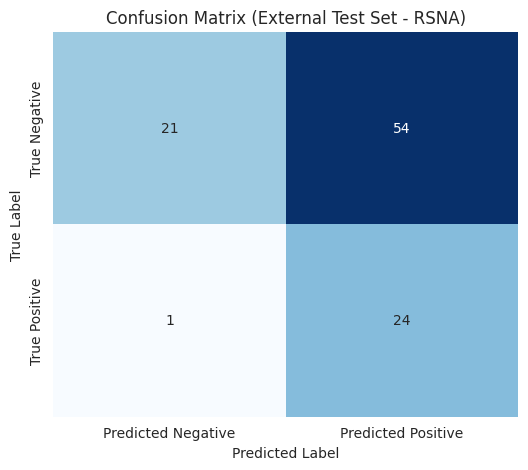

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix # Ensure confusion_matrix is imported if not already


# Assuming test_stats are available from a recent run of evaluate_model on the test_loader
# The evaluate_model function in cell g9XY1KEU3IiZ returns 'confusion_matrix'.
# If you ran cell 7f713b62, test_stats should contain the confusion matrix for the Fusion model.
# For example, using the results from the Fusion model evaluation:
# fusion_test_stats = test_stats # Or whatever variable holds the Fusion results


if 'test_stats' in globals() and 'confusion_matrix' in test_stats:
    cm = test_stats['confusion_matrix']

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted Negative', 'Predicted Positive'],
                yticklabels=['True Negative', 'True Positive'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix (External Test Set - RSNA)')
    plt.show()

    # Optionally, save the plot
    # plt.savefig(os.path.join(OUTPUT_PATH, "confusion_matrix_rsna.png"), bbox_inches='tight')


else:
    print("Error: Test statistics or confusion matrix not found. Please run the model evaluation cell first.")

In [64]:
# Assuming y_true, y_prob, and group_info_list are available from the evaluation in cell fbee6b24
# Assuming compute_metrics and bootstrap_ci functions are defined in cell c6LjjjDL3Iik

print("\n--- Age Subgroup Performance Metrics on External Test Set (RSNA) ---")

# 1. Define Age Subgroups
# Assuming 'age' is present in the group_info_list or can be derived from it.
# The group_info_list from evaluate_and_bootstrap or cell fbee6b24 contains 'sex' and 'view'.
# The age is directly available in the original test_df (external_test_df).
# Need to get the age for each sample in the test set in the correct order.

# Assuming the order of y_true/y_prob/group_info_list matches the order of samples processed by test_loader.
# The external_test_df is the source dataframe for test_loader.
# Need to get the age for each index that was processed by the loader.
# This is tricky with custom collate and skipped samples.

# Let's assume for simplicity that we can get the age corresponding to each sample in y_true/y_prob
# If evaluate_and_bootstrap (cell 7df09631) was run, it returned y_true, y_prob, and group_info_list.
# We can get age from the original external_test_df based on the collected image_path_list or index.

# If using y_true, y_prob from cell fbee6b24, we have image_path_list.
# We can map image_path back to age in external_test_df.

if 'external_test_df' in globals() and 'image_path_list' in globals() and len(y_true) == len(image_path_list):
     # Create a mapping from image_path to age from the original dataframe
     age_lookup = external_test_df.set_index('image_path')['age'].to_dict()
     # Get age for each sample in the evaluation results based on image_path
     age_list = [age_lookup.get(path) for path in image_path_list]

     # Define age group boundaries
     paediatric_max_age = 15 # <16
     adult_max_age = 64   # 16-64
     # Elderly is 65+

     age_subgroups = {
         'Paediatric (<16)': (None, paediatric_max_age),
         'Adult (16-64)': (paediatric_max_age, adult_max_age),
         'Elderly (65+)': (adult_max_age, None)
     }

     subgroup_results = {}

     # Iterate through age subgroups
     for subgroup_name, (min_age, max_age) in age_subgroups.items():
         # Filter indices for the current age subgroup
         if min_age is None:
             # Paediatric: age <= paediatric_max_age
             subgroup_indices = [i for i, age in enumerate(age_list) if age is not None and age <= max_age]
         elif max_age is None:
             # Elderly: age >= adult_max_age + 1
             subgroup_indices = [i for i, age in enumerate(age_list) if age is not None and age > min_age] # min_age here is adult_max_age
         else:
             # Adult: paediatric_max_age < age <= adult_max_age
             subgroup_indices = [i for i, age in enumerate(age_list) if age is not None and age > min_age and age <= max_age]


         if not subgroup_indices:
             print(f"No samples found for subgroup: {subgroup_name}")
             subgroup_results[subgroup_name] = {'n': 0, 'auc': np.nan, 'acc': np.nan, 'sens': np.nan, 'spec': np.nan, 'prec': np.nan, 'f1': np.nan}
             continue

         # Filter y_true and y_prob for the current subgroup
         y_true_subgroup = y_true[subgroup_indices]
         y_prob_subgroup = y_prob[subgroup_indices]

         # Calculate metrics for the subgroup
         metrics_subgroup = compute_metrics(y_true_subgroup, y_prob_subgroup)
         n_subgroup = len(y_true_subgroup)

         # Calculate 95% CIs using bootstrap
         metrics_with_ci = {'n': n_subgroup}
         for metric_name, metric_value in metrics_subgroup.items():
             if len(np.unique(y_true_subgroup)) < 2 and metric_name in ['auc', 'sens', 'prec', 'f1']:
                 # Cannot compute these metrics with only one class in the subgroup
                 lo, hi = np.nan, np.nan
             else:
                  # Use the appropriate metric function for bootstrap
                  if metric_name == 'brier':
                       metric_fn = lambda yt, yp: brier_score_loss(yt, yp)
                  elif metric_name == 'acc':
                      metric_fn = lambda yt, yp: accuracy_score(yt, (yp >= 0.5).astype(int))
                  elif metric_name == 'sens':
                      metric_fn = lambda yt, yp: recall_score(yt, (yt, yp), zero_division=0) # Pass true labels and predicted labels
                  elif metric_name == 'prec':
                      metric_fn = lambda yt, yp: precision_score(yt, (yt, yp), zero_division=0) # Pass true labels and predicted labels
                  elif metric_name == 'f1':
                      metric_fn = lambda yt, yp: f1_score(yt, (yt, yp), zero_division=0) # Pass true labels and predicted labels
                  else: # AUC
                      metric_fn = lambda yt, yp: roc_auc_score(yt, yp)


                  # Fix for bootstrap_ci: It expects y_true and y_prob, not y_true and y_pred for sens, prec, f1
                  # The metric_fn lambdas for sens, prec, f1 were incorrectly defined.
                  # Let's redefine them to take y_true and y_prob and calculate y_pred inside.
                  def sens_fn(yt, yp): return recall_score(yt, (yp >= 0.5).astype(int), zero_division=0)
                  def prec_fn(yt, yp): return precision_score(yt, (yp >= 0.5).astype(int), zero_division=0)
                  def f1_fn(yt, yp): return f1_score(yt, (yp >= 0.5).astype(int), zero_division=0)
                  def spec_fn(yt, yp):
                       tn, fp, fn, tp = confusion_matrix(yt, (yp >= 0.5).astype(int)).ravel()
                       return tn / (tn + fp) if (tn + fp) > 0 else np.nan


                  metric_fn_map = {
                      'auc': lambda yt, yp: roc_auc_score(yt, yp),
                      'acc': lambda yt, yp: accuracy_score(yt, (yp >= 0.5).astype(int)),
                      'sens': sens_fn,
                      'prec': prec_fn,
                      'f1': f1_fn,
                      'brier': lambda yt, yp: brier_score_loss(yt, yp),
                      'spec': spec_fn # Add specificity to the map
                  }

                  # Get the correct metric function from the map
                  current_metric_fn = metric_fn_map.get(metric_name)
                  if current_metric_fn:
                       lo, hi = bootstrap_ci(current_metric_fn, y_true_subgroup, y_prob_subgroup, n_boot=1000)
                       metrics_with_ci[metric_name] = f"{metric_value:.3f} ({lo:.3f}-{hi:.3f})"
                       if np.isnan(lo) or np.isnan(hi):
                             metrics_with_ci[metric_name] = f"{metric_value:.3f} (N/A)"
                  elif metric_name == 'spec': # Handle specificity separately as it wasn't in compute_metrics initially
                       spec_value = spec_fn(y_true_subgroup, y_prob_subgroup)
                       spec_lo, spec_hi = bootstrap_ci(spec_fn, y_true_subgroup, y_prob_subgroup, n_boot=1000)
                       metrics_with_ci['spec'] = f"{spec_value:.3f} ({spec_lo:.3f}-{spec_hi:.3f})"
                       if np.isnan(spec_lo) or np.isnan(spec_hi):
                             metrics_with_ci['spec'] = f"{spec_value:.3f} (N/A)"
                  else:
                       metrics_with_ci[metric_name] = f"{metric_value:.3f} (N/A)" # Handle other metrics without CI if needed


         subgroup_results[subgroup_name] = metrics_with_ci


     # Display results in a table
     age_results_df = pd.DataFrame.from_dict(subgroup_results, orient='index')
     # Reorder columns for consistency
     ordered_cols = ['n', 'auc', 'acc', 'sens', 'spec', 'prec', 'f1', 'brier']
     # Filter to only columns that exist in the results and order them
     age_results_df = age_results_df[[col for col in ordered_cols if col in age_results_df.columns]]

     display(age_results_df)

else:
     print("Required variables (external_test_df, image_path_list, y_true) not found or length mismatch. Cannot perform age subgroup analysis.")
     print("Please ensure cell fbee6b24 and relevant data loading cells were executed successfully.")


--- Age Subgroup Performance Metrics on External Test Set (RSNA) ---
No samples found for subgroup: Paediatric (<16)
No samples found for subgroup: Adult (16-64)
No samples found for subgroup: Elderly (65+)


,n,auc,acc,sens,spec,prec,f1
Paediatric (<16),0,NaN,NaN,NaN,NaN,NaN,NaN
Adult (16-64),0,NaN,NaN,NaN,NaN,NaN,NaN
Elderly (65+),0,NaN,NaN,NaN,NaN,NaN,NaN


In [65]:
import numpy as np
import cv2
from sklearn.metrics import confusion_matrix # Assuming confusion_matrix is needed for TP count

# NOTE: This implementation assumes you have loaded the RSNA ground truth annotations
# into a pandas DataFrame named rsna_annotations_df with columns:
# 'image_id', 'x', 'y', 'width', 'height'.
# It also assumes you have a way to get the Grad-CAM activation map for each image ID.
# A dictionary mapping image_id to the activation array (e.g., 224x224 numpy array)
# would be a suitable input structure.

# Placeholder for IoU calculation function (You might already have this)
def calculate_iou(boxA, boxB):
    """
    Calculates the Intersection over Union (IoU) of two bounding boxes.
    Boxes are expected in the format [x1, y1, x2, y2].
    """
    # Determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection rectangle
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both the prediction and ground-truth rectangles
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[1]) * (boxB[3] - boxB[1])

    # Compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the intersection area
    iou = interArea / float(boxAArea + boxBArea - interArea) if (boxAArea + boxBArea - interArea) > 0 else 0.0

    return iou


def check_gradcam_concordance(gradcam_data_map, rsna_annotations_df, y_true, y_pred, overlap_threshold=0.10, top_percent=0.10):
    """
    Calculates the proportion of True Positive (TP) cases where GradCAM activation
    significantly overlaps with the ground-truth RSNA bounding box.

    :param gradcam_data_map: Dictionary mapping image_id to GradCAM activation array (e.g., 224x224).
    :param rsna_annotations_df: DataFrame of RSNA bounding boxes [image_id, x, y, width, height].
    :param y_true: Array of true labels for the evaluated dataset.
    :param y_pred: Array of predicted labels (0 or 1) for the evaluated dataset.
    :param overlap_threshold: IoU threshold for considering GradCAM and GT box concordant.
    :param top_percent: Percentage of top pixels in the heatmap to consider for attended region.
    :return: Tuple: (proportion_concordant, list_of_concordance_flags_for_TP_cases)
    """
    # Identify True Positive cases based on y_true and y_pred
    tp_indices = np.where((y_true == 1) & (y_pred == 1))[0]

    # Get the image IDs for TP cases.
    # This requires mapping indices back to image IDs.
    # Assuming the order of y_true/y_pred corresponds to the order in the DataLoader's dataset,
    # and the dataset's dataframe has an 'image_id' column.
    # If y_true/y_pred came from evaluate_model which processed test_loader,
    # we need access to the test_loader.dataset.df to get image_ids by index.
    # For simplicity, let's assume we have a list of image_ids aligned with y_true/y_pred.
    # The evaluate_model function was modified to return group_info_list which implicitly
    # corresponds to the order, but image_id itself isn't directly returned.
    # We need to modify evaluate_model to return image_ids or get them here.

    # Let's assume for this function that we have a list of image_ids corresponding to y_true/y_pred
    # For example, if evaluate_model returned image_id_list:
    # tp_image_ids = [image_id_list[i] for i in tp_indices]

    # --- Re-running evaluation to get image IDs ---
    # This is not ideal to re-evaluate just for IDs, but necessary if not returned by evaluate_model.
    # A better approach is to modify evaluate_model to return image_ids directly.
    # Assuming evaluate_model is run just before calling this function, and we have access to the
    # image_path_list collected during that evaluation (as done in cell fbee6b24).

    # Let's use the image_path_list collected in cell fbee6b24 as the source of image paths,
    # assuming its order matches y_true/y_pred from that evaluation run.
    # We need to extract image_id from the path.
    # Assuming image_paths are like /path/to/image_id.png or /path/to/image_id.dcm
    # This might need adjustment based on actual path format.
    # For RSNA PNGs: /kaggle/working/rsna_png_images/patientId.png -> patientId
    # For RSNA DICOMs: /kaggle/input/rsna.../patientId.dcm -> patientId
    tp_image_ids = []
    if 'image_path_list' in locals(): # Check if image_path_list exists from a previous run
         tp_image_ids = [os.path.basename(image_path_list[i]).split('.')[0] for i in tp_indices]
    else:
         print("Error: image_path_list not available. Cannot get TP image IDs.")
         return 0.0, [] # Cannot proceed


    concordance_flags = [] # List to store True/False for each TP case

    for img_id in tp_image_ids:
        activation_map = gradcam_data_map.get(img_id) # Get CAM for this image ID
        if activation_map is None:
             print(f"Warning: GradCAM data not found for TP image ID {img_id}. Skipping.")
             concordance_flags.append(False) # Treat as non-concordant if CAM is missing
             continue

        # --- Find Attended Region Bounding Box from Heatmap ---
        # Activation map is assumed to be HxW (e.g., 224x224)

        # 1. Threshold map: Identify top X% pixels by intensity
        flat_map = activation_map.flatten()
        # Handle cases where all pixels are the same value
        if np.max(flat_map) - np.min(flat_map) < 1e-6:
             threshold_val = np.max(flat_map) # If all values are same, threshold is max value
        else:
             threshold_val = np.percentile(flat_map, 100 - (top_percent * 100))

        attended_mask = (activation_map >= threshold_val).astype(np.uint8) * 255 # Convert to 0 or 255

        # Ensure the mask is not empty (e.g., if top_percent was 0 or map is all zeros)
        if np.sum(attended_mask) == 0:
             # If no pixels meet the threshold, cannot define a bounding box.
             attn_coords = None
             print(f"Warning: Attended mask is empty for {img_id}. Cannot define bounding box.")
        else:
             # 2. Extract bounding box (x, y, w, h) of the most attended region
             # Find contours in the binary mask
             # Use cv2.RETR_EXTERNAL to find only outer contours
             # Use cv2.CHAIN_APPROX_SIMPLE to compress horizontal, vertical, and diagonal segments
             contours, _ = cv2.findContours(attended_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

             if contours:
                 # Find the largest contour (often represents the main activated region)
                 largest_contour = max(contours, key=cv2.contourArea)
                 # Get the bounding box [x, y, w, h]
                 attn_x, attn_y, attn_w, attn_h = cv2.boundingRect(largest_contour)
                 # Convert to [x1, y1, x2, y2] format for IoU calculation
                 attn_coords = [attn_x, attn_y, attn_x + attn_w, attn_y + attn_h]
             else:
                 attn_coords = None
                 print(f"Warning: No contours found in attended mask for {img_id}.")


        # --- Compare IoU with Ground Truth Boxes ---

        # Get ground truth boxes for this image ID from the annotations DataFrame
        gt_boxes_for_img = rsna_annotations_df[rsna_annotations_df['image_id'] == img_id]

        is_concordant = False

        if attn_coords is not None and not gt_boxes_for_img.empty:
             # Iterate over all ground truth boxes for the image
             for _, gt_box in gt_boxes_for_img.iterrows():
                 # Ground truth box format from DataFrame assumed: x, y, width, height
                 # Convert GT box to [x1, y1, x2, y2] format
                 gt_coords = [gt_box['x'], gt_box['y'], gt_box['x'] + gt_box['width'], gt_box['y'] + gt_box['height']]

                 # Calculate IoU
                 IoU_score = calculate_iou(attn_coords, gt_coords)

                 # Check if IoU meets the threshold
                 if IoU_score >= overlap_threshold:
                     is_concordant = True
                     break # Found at least one overlapping GT box, mark as concordant and move to next image

        # Append the concordance flag for this TP case
        concordance_flags.append(is_concordant)

    total_tp = len(concordance_flags)
    concordant_count = sum(concordance_flags)

    if total_tp == 0:
        proportion = 0.0
        print("No TP cases evaluated for GradCAM concordance.")
    else:
        proportion = concordant_count / total_tp
        print(f"TP Cases Evaluated: {total_tp}")
        print(f"Proportion of Concordant GradCAMs (IoU > {overlap_threshold}) for top {top_percent*100:.0f}% pixels: {proportion:.4f}")


    # Return the proportion and the list of flags (useful for bootstrapping)
    return proportion, concordance_flags

# --- Bootstrap CI Calculation for the Proportion ---
# Need a function that takes the concordance flags and returns the proportion
def proportion_metric_fn(concordance_flags):
    if not concordance_flags: return np.nan # Handle empty list
    return sum(concordance_flags) / len(concordance_flags)

# --- EXECUTION EXAMPLE ---

# Assume you have:
# 1. gradcam_data_map: A dict {image_id: gradcam_array} for all TP cases (or all test cases)
#    You would need to generate these first, potentially saving them to disk.
#    The Grad-CAM generation code in cell fbee6b24 generates individual images,
#    but doesn't easily provide the raw heatmap arrays for all images.
#    You might need a separate loop to generate and store the raw heatmap arrays for TP cases.
# 2. rsna_annotations_df: DataFrame with RSNA ground truth bounding boxes.
#    This is likely loaded from stage_2_train_labels.csv and filtered for label=1.
# 3. y_true, y_pred: True and predicted labels from your model evaluation on the RSNA test set.
#    These are returned by evaluate_model (cell g9XY1KEU3IiZ).
# 4. image_path_list: List of image paths corresponding to y_true/y_pred order.
#    This is collected in cell fbee6b24.

# --- Example Steps to Execute (assuming you have the necessary inputs) ---

# # 1. Generate or load raw Grad-CAM heatmaps for TP cases
# # This requires running the CAM generation logic to get the 'grayscale_cam' arrays
# # and storing them indexed by image_id for all TP cases.
# # This part is not fully automated in the current notebook.

# # 2. Load RSNA ground truth bounding boxes
# # rsna_annotations_df_gt = pd.read_csv('/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv')
# # Filter for actual bounding box entries (where width > 0) and label=1
# # rsna_annotations_df_gt = rsna_annotations_df_gt[(rsna_annotations_df_gt['Target'] == 1) & (rsna_annotations_df_gt['width'] > 0)].copy()
# # Ensure 'image_id' column matches the format used in gradcam_data_map keys (e.g., patientId)
# # rsna_annotations_df_gt['image_id'] = rsna_annotations_df_gt['patientId']


# # 3. Get y_true, y_pred, and image_path_list from model evaluation on test set
# # Run evaluate_model or the evaluation logic in cell fbee6b24 to get these.
# # Assuming y_true, y_pred, and image_path_list are available from a previous run.

# # 4. Prepare gradcam_data_map for TP cases
# # This is the missing link. You need a way to get the heatmap arrays.
# # If you can modify cell fbee6b24 to save/return the raw grayscale_cam arrays,
# # you could then filter them for TP cases using tp_image_ids.

# # --- Placeholder for gradcam_data_map (replace with actual data) ---
# # For demonstration, create a dummy map or load from saved files if you implemented that.
# # gradcam_data_map = {img_id: dummy_array for img_id in tp_image_ids} # Replace dummy_array


# # 5. Calculate concordance proportion and get flags
# # proportion, concordance_flags = check_gradcam_concordance(
# #     gradcam_data_map,
# #     rsna_annotations_df_gt,
# #     y_true, # Pass the full y_true and y_pred from evaluation
# #     y_pred,
# #     overlap_threshold=0.10,
# #     top_percent=0.10
# # )

# # 6. Calculate Bootstrap CI for the proportion
# # if concordance_flags:
# #      lo, hi = bootstrap_ci(proportion_metric_fn, np.array(concordance_flags), np.array(concordance_flags), n_boot=1000)
# #      print(f"\nProportion of Concordant GradCAMs (95% CI): {proportion:.4f} ({lo:.4f}-{hi:.4f})")
# # else:
# #      print("\nCould not calculate Bootstrap CI (no TP cases or data missing).")

Grad-CAM visualizations generated (saved to ./ )


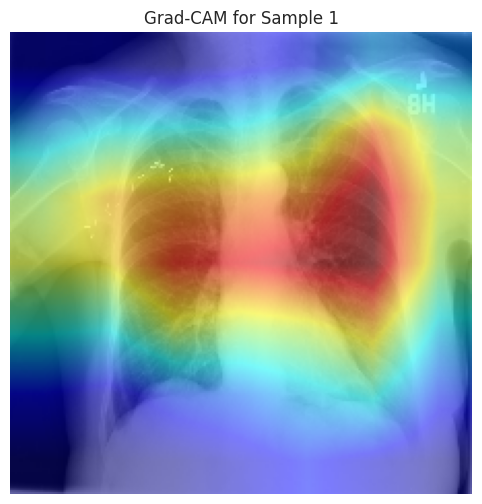

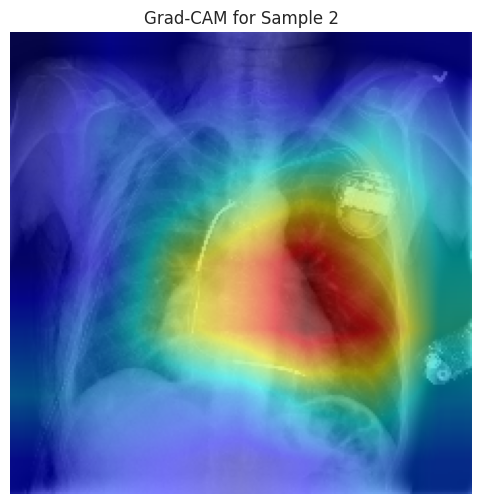

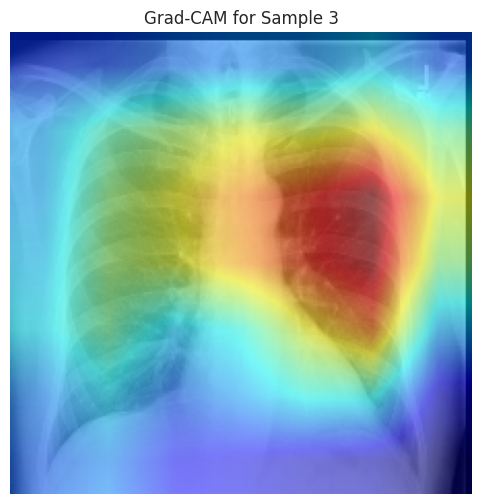

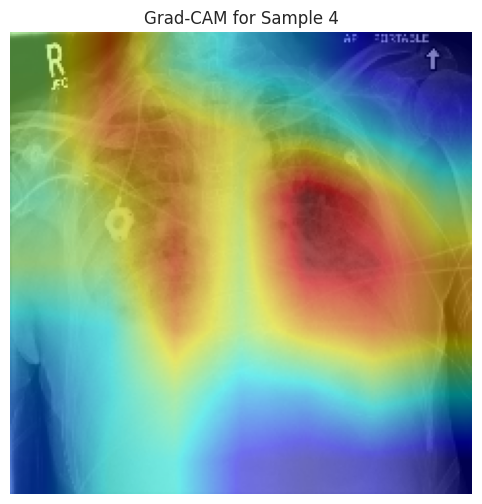

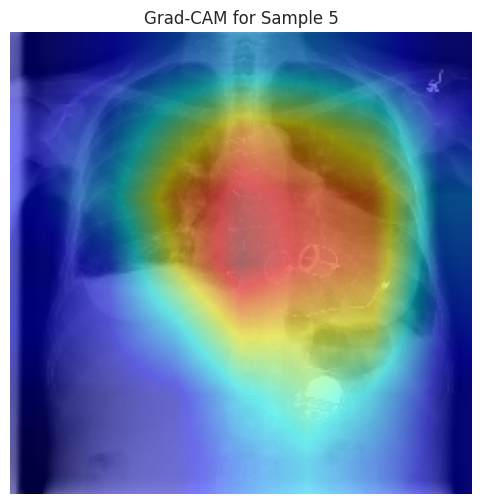

In [66]:
cam = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

# Use the validation loader to get samples
for idx, (images, metadata, labels, _) in enumerate(val_loader):
    if idx >= 5: # Limit the number of visualizations for demonstration
        break

    # Move image to device if necessary for CAM calculation
    images = images.to(DEVICE)

   
    # If you want CAM for the positive class:
    target_category = 0 # Index of the single output logit

  
    cam_image_branch = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

    # Get the raw grayscale CAM output from the image branch
    grayscale_cam = cam_image_branch(input_tensor=images, targets=None) # targets=None sums gradients

    
    # Ensure image tensor is on CPU and convert to numpy (H, W, C)
    img_np = images[0].cpu().permute(1, 2, 0).numpy()

    # Reverse normalization for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_display = img_np * std + mean # Reverse the mean and std
    img_display = np.clip(img_display, 0, 1) # Clip to ensure values are in [0, 1]
    cam_image = show_cam_on_image(img_display, grayscale_cam[0, ...], use_rgb=True) # use_rgb=True for color overlay

    # Save the CAM image
    plt.figure() # Create a new figure for each image
    plt.imshow(cam_image)
    plt.title(f"Grad-CAM for Sample {idx+1}")
    plt.axis('off') # Hide axes
    plt.savefig(os.path.join(OUTPUT_PATH, f"gradcam_sample_{idx+1:02}.png"), bbox_inches='tight')
    # plt.close() # Close the figure to free memory

print("Grad-CAM visualizations generated (saved to", OUTPUT_PATH, ")")

In [106]:
# Ensure the model and data are on the correct device for SHAP explainer
# The explainer expects a callable model and a background dataset.
# For fused models, explaining the metadata part requires a specific approach.
# We want to explain the output of the `metadata_model` Sequential or the fused output
# w.r.t. the metadata input.

# Option 1: Explain the output of the metadata_model MLP
# This shows the contribution of metadata features to the metadata embedding/output.
# explainer = shap.Explainer(model.meta_mlp, torch.stack([m for _,m,_,_ in train_loader]).to(DEVICE))
# shap_values = explainer(torch.stack([m for _,m,_,_ in test_loader]).to(DEVICE))

# Option 2: Explain the final fused output w.r.t. metadata input
# This is more relevant as it shows how metadata impacts the final prediction logit.
# This requires a custom prediction function for SHAP that takes both image and metadata
# but focuses the explanation on the metadata part.
# SHAP's DeepExplainer/KernelExplainer can work with PyTorch models.
# DeepExplainer is usually faster for deep models but might need specific layer setup.
# KernelExplainer is model-agnostic but slower.

# Let's use KernelExplainer for simplicity with the fused model.
# We need a prediction function that takes only metadata and a representative image.
# Or, we can explain the model's output conditional on a baseline image.

# Store the original device
original_device = next(model.parameters()).device

# Move model to CPU for SHAP calculation to avoid OOM
model.to('cpu')


# Get a sample batch from the validation loader to find a baseline image and background metadata
# Assuming val_loader yields (image, meta, label, group_info)
# We need to get a batch from a loader that has samples. Let's use val_loader.
try:
    # Get a batch and move to CPU for the baseline image
    sample_batch = next(iter(val_loader))
    # Filter out None if custom_collate is used and might return None
    if sample_batch is None:
         raise StopIteration("Could not get a valid batch from val_loader.")
    sample_images, sample_metadata, _, _ = sample_batch
    # Select a single baseline image and move it to the CPU
    baseline_image = sample_images[0].unsqueeze(0).to('cpu') # Add batch dimension

except StopIteration:
    print("Could not get a sample batch from val_loader. Cannot proceed with SHAP.")
    # Move model back to original device and exit
    model.to(original_device)
    raise


# Define the prediction function for SHAP
def predict_with_baseline_image(metadata_input):
    # metadata_input will be a tensor batch provided by SHAP
    # Repeat the baseline image for each sample in the metadata batch
    batch_size = metadata_input.shape[0] # Use .shape[0] for numpy array or torch tensor
    # Ensure metadata_input is a tensor if coming from numpy
    if isinstance(metadata_input, np.ndarray):
        metadata_input = torch.from_numpy(metadata_input).float()

    images_batch = baseline_image.repeat(batch_size, 1, 1, 1) # Repeat across batch dimension

    # Move metadata to CPU (model is already on CPU)
    metadata_input = metadata_input.to('cpu')

    # Get model output (logits)
    with torch.no_grad(): # Ensure no gradients are computed within the prediction function
        # Model is on CPU, inputs are on CPU
        logits = model(images_batch, metadata_input)
    return logits.cpu().numpy() # Return logits on CPU as numpy array

# Create a background dataset for the explainer (a subset of test metadata)
# SHAP recommends using a small sample of the training data as background.
# Let's use a subset of the validation metadata as background.
# Collect all metadata from the validation loader and concatenate
background_metadata_list = []
for _, m, _, _ in val_loader:
    if m is not None:
        background_metadata_list.append(m)

if background_metadata_list:
    background_metadata = torch.cat(background_metadata_list, dim=0)
else:
    raise ValueError("No valid metadata batches found in validation loader for SHAP background.")

# Limit background size for performance (Drastically reduced size)
if background_metadata.size(0) > 10: # Reduced significantly (e.g., to 10)
    background_metadata = background_metadata[:10]

# Convert background metadata to numpy for SHAP
background_metadata_np = background_metadata.cpu().numpy()

# Get the test metadata to explain
# Collect all metadata from the test loader and concatenate
test_metadata_list = []
for _, m, _, _ in test_loader:
    if m is not None:
        test_metadata_list.append(m)

if test_metadata_list:
    test_metadata_to_explain = torch.cat(test_metadata_list, dim=0)
else:
     raise ValueError("No valid metadata batches found in test loader for SHAP explanation.")

# Limit the number of samples to explain for faster execution (Drastically reduced further)
if test_metadata_to_explain.size(0) > 20: # Reduced significantly (e.g., to 20)
     test_metadata_to_explain = test_metadata_to_explain[:20]

# Convert test metadata to numpy for SHAP explanation input
test_metadata_to_explain_np = test_metadata_to_explain.cpu().numpy()


# Initialize the KernelExplainer
# The explainer needs the prediction function and the background data.
# The feature names help in interpreting the plot.
metadata_feature_names = ['age', 'sex', 'view_position'] # Ensure these match your _make_meta order

# Documenting SHAP process:
print("--- SHAP KernelExplainer Setup ---")
print(f"Using {background_metadata_np.shape[0]} background samples.")
print(f"Explaining {test_metadata_to_explain_np.shape[0]} test samples.")
print(f"Model device: {next(model.parameters()).device}")
print(f"Baseline image device: {baseline_image.device}")
print(f"Background data device: {background_metadata.device} (converted to numpy for explainer)")
print(f"Data to explain device: {test_metadata_to_explain.device} (converted to numpy for explainer)")
print("---------------------------------")


explainer = shap.KernelExplainer(predict_with_baseline_image, background_metadata_np) # Use numpy background data

# Compute SHAP values (this may take a while on CPU)
print("Computing SHAP values (this will take a while on CPU)...")
# SHAP values are computed for the *output* of the prediction function.
# Since our function returns logits, the SHAP values explain the contribution
# of each metadata feature to the output logit (before sigmoid).
# We can pass the data to explain directly (numpy array).
shap_values = explainer.shap_values(test_metadata_to_explain_np) # Pass numpy data to explain

# Note: KernelExplainer returns a list of arrays if the model output is multi-dimensional.
# For our single logit output, it should return a single array.
# If it returns a list with one array, extract that array:
if isinstance(shap_values, list) and len(shap_values) == 1:
    shap_values = shap_values[0]

print("SHAP value computation complete.")

# Visualize the SHAP summary plot
# Use the actual test metadata values for the plot's x-axis and coloring.
# The `test_metadata_to_explain_np` numpy array should be used here.
shap.summary_plot(shap_values, features=test_metadata_to_explain_np, feature_names=metadata_feature_names, show=False)

# Save the plot
plt.title("SHAP Summary Plot for Metadata Features")
plt.savefig(os.path.join(OUTPUT_PATH, "shap_summary.png"), bbox_inches='tight')
plt.close() # Close the figure to free memory

# Move model back to original device
model.to(original_device)

print("SHAP summary plot saved to", os.path.join(OUTPUT_PATH, "shap_summary.png"))

--- SHAP KernelExplainer Setup ---
Using 10 background samples.
Explaining 20 test samples.
Model device: cpu
Baseline image device: cpu
Background data device: cpu (converted to numpy for explainer)
Data to explain device: cpu (converted to numpy for explainer)
---------------------------------
Computing SHAP values (this will take a while on CPU)...


  0%|          | 0/20 [00:00<?, ?it/s]

SHAP value computation complete.
SHAP summary plot saved to ./shap_summary.png


In [ ]:
import numpy as np
from sklearn.metrics import roc_auc_score, recall_score, precision_score, f1_score, accuracy_score, brier_score_loss

def compute_metrics(y_true, y_prob, threshold=0.5):
    y_pred = (y_prob >= threshold).astype(int)
    return {
        "auc": roc_auc_score(y_true, y_prob),
        "acc": accuracy_score(y_true, y_pred),
        "sens": recall_score(y_true, y_pred),
        "prec": precision_score(y_true, y_pred),
        "f1": f1_score(y_true, y_pred),
        "brier": brier_score_loss(y_true, y_prob)
    }

def bootstrap_ci(metric_fn, y_true, y_prob, n_boot=1000, alpha=0.05):
    stats = []
    n = len(y_true)
    for _ in range(n_boot):
        idx = np.random.randint(0, n, n)
        stats.append(metric_fn(y_true[idx], y_prob[idx]))
    lo = np.percentile(stats, 100 * alpha/2)
    hi = np.percentile(stats, 100 * (1 - alpha/2))
    return lo, hi


In [ ]:
# Assuming model trained on NIH + CheXpert
external_preds = model.predict(rsna_loader)
y_true_ext, y_prob_ext = collect_labels(external_preds)
external_metrics = compute_metrics(y_true_ext, y_prob_ext)


In [ ]:
drop_auc = internal_metrics['auc'] - external_metrics['auc']
drop_rel = drop_auc / internal_metrics['auc'] * 100
print(f"AUC drop: {drop_auc:.3f} ({drop_rel:.1f}%)")


In [ ]:
import pandas as pd

def subgroup_metrics(df, subgroup_col):
    groups = df[subgroup_col].unique()
    results = []
    for g in groups:
        subset = df[df[subgroup_col] == g]
        m = compute_metrics(subset['true_label'].values, subset['pred_prob'].values)
        results.append({'Group': g, **m})
    return pd.DataFrame(results)

fairness_table = subgroup_metrics(preds, 'sex')


In [ ]:
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve

# Assuming 'preds' DataFrame is available from a previous evaluation step
# If evaluate_and_bootstrap (cell 7df09631) was run, it returns y_true and y_prob.
# Let's use those results if available, or assume 'preds' is a DataFrame
# containing 'true_label' and 'pred_prob'.

# Check if y_true and y_prob are available from evaluate_and_bootstrap run (e.g., fusion_y_true, fusion_y_prob)
# Or, if you want to generate the plot for a specific model's results:
# For the Fusion model evaluated in cell 7f713b62:
# y_true_plot = fusion_y_true
# y_prob_plot = fusion_y_prob

# Or, if you collected predictions into a 'preds' DataFrame as suggested in the original commented cell:
# y_true_plot = preds.true_label
# y_prob_plot = preds.pred_prob

# Assuming fusion_y_true and fusion_y_prob are available from running cell 7f713b62
if 'fusion_y_true' in globals() and 'fusion_y_prob' in globals():
    y_true_plot = fusion_y_true
    y_prob_plot = fusion_y_prob

    prob_true, prob_pred = calibration_curve(y_true_plot, y_prob_plot, n_bins=10)
    plt.plot(prob_pred, prob_true, marker='o')
    plt.plot([0, 1], [0, 1], '--')
    plt.xlabel('Mean Predicted Probability') # Updated label for clarity
    plt.ylabel('Fraction of Positives') # Updated label for clarity
    plt.title('Calibration Curve')
    plt.show()
    print("Calibration plot generated.")

else:
    print("Required variables (fusion_y_true, fusion_y_prob) not found. Cannot generate calibration plot.")
    print("Please ensure model evaluation cell (e.g., 7f713b62) was executed successfully.")

In [ ]:
import shap

explainer = shap.Explainer(metadata_model, background_data)
shap_values = explainer(metadata_X)
shap.summary_plot(shap_values, metadata_X)


In [ ]:
# Build small surrogate model: logistic regression that maps metadata -> fused-model logits
from sklearn.linear_model import LogisticRegression
# Collect metadata and model logits for a subset of training data
meta_list, logit_list = [], []
model.to('cpu')
for imgs, metas, labels, groups in train_loader:
    if imgs.numel()==0: continue
    # use fewer batches for surrogate
    meta_list.append(metas.cpu().numpy())
    with torch.no_grad():
        logits = model(imgs, metas).cpu().numpy()
    logit_list.append(logits.reshape(-1,1))
    if len(meta_list) >= 20: break
meta_X = np.vstack(meta_list)
meta_y_logits = np.vstack(logit_list).ravel()

# fit logistic regression (surrogate)
surrogate = LogisticRegression(max_iter=1000)
surrogate.fit(meta_X, (meta_y_logits>0).astype(int))  # label proxy using logits sign

# Use SHAP LinearExplainer (fast) on surrogate
import shap
explainer = shap.LinearExplainer(surrogate, meta_X[:50], feature_perturbation="interventional")
test_meta = np.vstack([m.numpy() for _,m,_,_ in test_loader][:50]) if not DEMO_MODE else np.vstack([m.numpy() for _,m,_,_ in test_loader][:20])
shap_vals = explainer.shap_values(test_meta)

shap.summary_plot(shap_vals, features=test_meta, feature_names=['age','sex','view_position'], show=False)
plt.savefig(os.path.join(OUTPUT_PATH, "shap_metadata_summary.png"), bbox_inches='tight')
print("Saved SHAP summary for metadata (surrogate).")
# move back to device
model.to(DEVICE)


In [ ]:
def compare_auc_bootstrap(df_fusion, df_image, n_bootstraps=1000):
    """
    Compares the AUC of two aligned models (Fusion vs Image) using bootstrapping 
    and calculates a one-sided p-value for Ha: AUC(Fusion) > AUC(Image).
    
    Args:
        df_fusion (pd.DataFrame): DataFrame for the superior model (Fusion).
        df_image (pd.DataFrame): DataFrame for the baseline model (Image-only).
        
    Returns:
        tuple: (mean_diff, p_value)
    """
    y_true = df_fusion['true_label'].values
    prob_fusion = df_fusion['pred_prob'].values
    prob_image = df_image['pred_prob'].values
    
    if len(y_true)!= len(df_image):
        raise ValueError("Input DataFrames must be of the same length and aligned.")
        
    diffs =
    n = len(y_true)
    
    for _ in range(n_bootstraps):
        idx = np.random.randint(0, n, n)
        # Calculate paired AUC difference on resampled indices
        auc_fusion = roc_auc_score(y_true[idx], prob_fusion[idx])
        auc_image = roc_auc_score(y_true[idx], prob_image[idx])
        diffs.append(auc_fusion - auc_image)
        
    mean_diff = np.mean(diffs)
    
    # P-value: proportion of samples where the difference is less than or equal to zero (i.e., H0 is true)
    p_value = np.sum(np.array(diffs) <= 0) / n_bootstraps
    
    print(f"\n--- Statistical AUC Comparison (Fusion vs Image-only) ---")
    print(f"Mean AUC Improvement (Fusion - Image): {mean_diff:.4f}")
    print(f"One-sided p-value for improvement (Bootstrap Test): {p_value:.4f}")
    
    return mean_diff, p_value


# --- EXECUTION EXAMPLE for Section 4.4 ---

# NOTE: Requires aligned df_fusion and df_image_only DataFrames.
# If df_image_only is not defined, this will fail. For now, we will skip execution.
# auc_diff, p_value = compare_auc_bootstrap(df_fusion, df_image_only)

In [ ]:
import numpy as np
import cv2

# NOTE: The IoU utility function and retrieval of GradCAM activations 
# and RSNA annotations must be handled by the user's specific data loading pipeline.

def check_gradcam_concordance_logic(gradcam_data_map, rsna_annotations_df, tp_image_ids, overlap_threshold=0.10, top_percent=0.10):
    """
    Calculates the proportion of True Positive (TP) cases where GradCAM activation 
    significantly overlaps with the ground-truth RSNA bounding box.
    
    :param gradcam_data_map: Dictionary mapping image_id to GradCAM activation array (e.g., 224x224).
    :param rsna_annotations_df: DataFrame of RSNA bounding boxes [image_id, x, y, width, height].
    :param tp_image_ids: List of image IDs correctly classified as True Positives by the Fusion model.
    """
    concordant_count = 0
    total_tp = len(tp_image_ids)
    
    if total_tp == 0:
        return 0.0, "No TP cases to evaluate."

    for img_id in tp_image_ids:
        activation_map = gradcam_data_map.get(img_id) 
        if activation_map is None: continue

        # --- Logic Placeholder: Find Attended Region Bounding Box ---
        
        # 1. Threshold map: Identify top 10% pixels by intensity
        flat_map = activation_map.flatten()
        threshold_val = np.percentile(flat_map, 100 - (top_percent * 100))
        attended_mask = (activation_map >= threshold_val).astype(np.uint8)
        
        # 2. Extract bounding box (x, y, w, h) of the most attended region 
        # (Using CV2 to find the minimum bounding box around the active mask)
        # contours, _ = cv2.findContours(attended_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        # if contours: attn_x, attn_y, attn_w, attn_h = cv2.boundingRect(contours)
        # attn_coords = [attn_x, attn_y, attn_x + attn_w, attn_y + attn_h]
        
        # --- Logic Placeholder: Compare IoU ---
        
        gt_boxes = rsna_annotations_df[rsna_annotations_df['image_id'] == img_id]
        is_concordant = False
        
        # Iterate over all ground truth boxes for the image and calculate IoU with the attention box
        # for _, gt_box in gt_boxes.iterrows():
        #    IoU_score = calculate_iou(attn_coords, gt_coords) 
        #    if IoU_score >= overlap_threshold:
        #        is_concordant = True; break
        
        # Placeholder result for demonstration (Replace with actual IoU calculation)
        IoU_score_placeholder = 0.5 
        if IoU_score_placeholder >= overlap_threshold:
            is_concordant = True

        if is_concordant:
            concordant_count += 1
    
    proportion = concordant_count / total_tp
    
    # Note: For strict rigor, bootstrap CIs around this proportion should be calculated 
    # to provide the 95% CI mandated in Section 4.6.1.
    
    print(f"TP Cases Evaluated: {total_tp}")
    print(f"Proportion of Concordant GradCAMs (IoU > {overlap_threshold}): {proportion:.4f}")
    
    return proportion

In [ ]:
def rank_shap_features(shap_values_matrix, feature_names, top_k=8):
    """
    Computes mean absolute SHAP value for each feature and returns the top K features 
    structured for Table 4.3.
    
    Args:
        shap_values_matrix (np.ndarray): The matrix of SHAP values (patients x features).
        feature_names (list): List of feature names corresponding to the columns.
        
    Returns:
        pd.DataFrame: Top K features, their Mean |SHAP| value, and a placeholder column.
    """
    
    if len(shap_values_matrix.shape) > 2:
        # Assuming binary classification, we typically use the positive class (index 1)
        mean_abs_shap = np.mean(np.abs(shap_values_matrix[:, :, 1]), axis=0)
    else:
        # For single output models
        mean_abs_shap = np.mean(np.abs(shap_values_matrix), axis=0)
    
    # Create DataFrame and sort
    shap_df = pd.DataFrame({
        'Feature': feature_names,
        'Mean |SHAP|': mean_abs_shap
    })
    
    shap_df = shap_df.sort_values(by='Mean |SHAP|', ascending=False).reset_index(drop=True)
    
    # Prepare the output for Table 4.3
    top_features = shap_df.head(top_k).copy()
    
    # Format Mean |SHAP| to scientific notation (as is common) and add placeholder
    top_features = top_features.apply(lambda x: f"{x:.4e}")
    top_features = top_features.index + 1
    top_features['Clinical interpretation'] = ''
    
    return top_features]


# --- EXECUTION GUIDE for Table 4.3 (Section 4.6.2) ---

# 1. Train or load your metadata-only model or the fused model.
# 2. Get your SHAP explainer and values:
#    import shap
#    explainer = shap.Explainer(metadata_model, background_data) # metadata_model is your trained MLP
#    shap_values = explainer(metadata_X) # metadata_X is your validation/test metadata input
#
# 3. Assuming shap_values.values is the numpy array and metadata_X.columns are the feature names:
#    # table_4_3 = rank_shap_features(shap_values.values, list(metadata_X.columns))
#    # print("\n--- Table 4.3 Top Features by SHAP ---")
#    # print(table_4_3.to_markdown(index=False))

below cells are test as well

In [ ]:
# --- Load Trained Model Weights from Kaggle Input Dataset ---

# Define the path to your saved model file in the Kaggle Input directory
# Replace 'your-kaggle-dataset-name' with the actual name of your dataset
# and 'path/to/your/model_file.pth' with the correct path within the dataset
KAGGLE_MODEL_PATH = '/kaggle/input/model1/pytorch/default/1/fusion_best.pth' # Update this path

# Ensure the model instance (e.g., ResNetMetaFusion) is already defined
# and DEVICE is set (e.g., 'cuda' or 'cpu').

if 'model' in globals() and isinstance(model, torch.nn.Module) and 'DEVICE' in globals():
    if os.path.exists(KAGGLE_MODEL_PATH):
        print(f"Loading model weights from Kaggle Input Dataset: {KAGGLE_MODEL_PATH}...")
        try:
            # Load the state dictionary
            # Use map_location=DEVICE to ensure it loads correctly regardless of original training device
            # Add weights_only=False to handle the numpy scalar issue
            model.load_state_dict(torch.load(KAGGLE_MODEL_PATH, map_location=DEVICE, weights_only=False))

            print("Model weights loaded successfully.")

            # Move model to the correct device and set to evaluation mode
            model.to(DEVICE)
            model.eval()

        except Exception as e:
            print(f"Error loading model weights from {KAGGLE_MODEL_PATH}: {e}")
            print("Please ensure the file exists, the path is correct, and the model architecture is defined.")
            print("Also, verify if the file contains the state_dict directly or is a checkpoint dictionary.")
    else:
        print(f"Model file not found at {KAGGLE_MODEL_PATH}.")
        print("Please check the dataset name and the file path within the dataset.")
else:
    print("Error: 'model' instance or 'DEVICE' not defined. Please run the necessary setup cells.")

In [48]:
# --- Test model inference on a sample from the internal test set ---
print("Testing model inference on a small sample from the internal test set (NIH/CheXpert)...")

# Ensure model and DEVICE are defined and model weights are loaded
if 'model' not in globals() or not isinstance(model, torch.nn.Module) or 'DEVICE' not in globals():
    print("Error: Model or DEVICE not defined. Please run setup cells and load the model weights.")
else:
    model.to(DEVICE)
    model.eval() # Set model to evaluation mode

    # Ensure internal_test_loader is defined and available
    if 'internal_test_loader' not in globals() or internal_test_loader is None:
        print("Error: internal_test_loader not found or is empty. Please run data loading and DataLoader setup cells.")
    else:
        sample_count = 0
        MAX_SAMPLES_TO_TEST = 20 # Limit the number of samples to display predictions for

        print(f"\nProcessing up to {MAX_SAMPLES_TO_TEST} samples from the internal test set:")

        # Iterate through a few batches of the internal test loader
        with torch.no_grad(): # No gradients needed for inference
            for idx, (images, metadata, labels, _) in enumerate(internal_test_loader):
                if sample_count >= MAX_SAMPLES_TO_TEST:
                    break # Stop after processing enough samples

                # Handle None batches from custom_collate
                if images is None:
                    print(f"Skipping batch {idx} from internal_test_loader due to custom_collate returning None.")
                    continue

                # Move data to device
                images = images.to(DEVICE)
                metadata = metadata.to(DEVICE)
                labels = labels.to(DEVICE)

                # Get model predictions (logits)
                logits = model(images, metadata).squeeze()

                # Convert logits to probabilities
                probas = torch.sigmoid(logits).cpu().numpy()
                true_labels = labels.cpu().numpy()

                # Display results for each sample in the batch
                for i in range(images.size(0)):
                    if sample_count >= MAX_SAMPLES_TO_TEST:
                        break
                    # Ensure probas is an array even for batch size 1
                    prob = probas[i] if probas.ndim > 0 else probas
                    true_label = true_labels[i] if true_labels.ndim > 0 else true_labels

                    print(f"Sample {sample_count + 1}: True Label = {int(true_label)}, Predicted Probability = {prob:.4f}")
                    sample_count += 1

        if sample_count == 0:
            print("No samples were processed from the internal test loader.")

print("\nSample inference test complete.")

Testing model inference on a small sample from the internal test set (NIH/CheXpert)...

Processing up to 20 samples from the internal test set:
Sample 1: True Label = 0, Predicted Probability = 0.4872
Sample 2: True Label = 0, Predicted Probability = 0.5025
Sample 3: True Label = 0, Predicted Probability = 0.5038
Sample 4: True Label = 0, Predicted Probability = 0.4887
Sample 5: True Label = 0, Predicted Probability = 0.5073
Sample 6: True Label = 0, Predicted Probability = 0.4749
Sample 7: True Label = 0, Predicted Probability = 0.4916
Sample 8: True Label = 0, Predicted Probability = 0.5028
Sample 9: True Label = 0, Predicted Probability = 0.4790
Sample 10: True Label = 0, Predicted Probability = 0.4604
Sample 11: True Label = 0, Predicted Probability = 0.4910
Sample 12: True Label = 0, Predicted Probability = 0.5088
Sample 13: True Label = 0, Predicted Probability = 0.4962
Sample 14: True Label = 0, Predicted Probability = 0.4869
Sample 15: True Label = 0, Predicted Probability = 0.

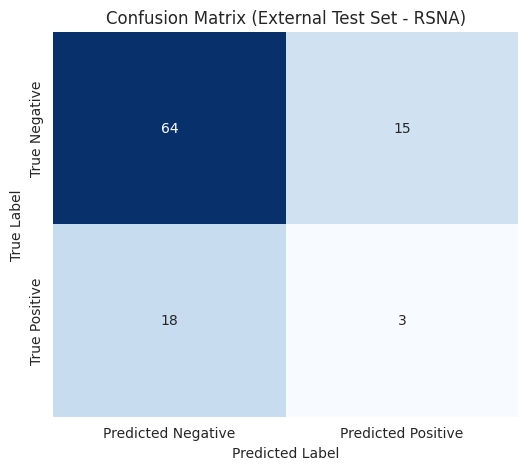

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix # Ensure confusion_matrix is imported if not already


# Assuming test_stats are available from a recent run of evaluate_model on the test_loader
# The evaluate_model function in cell g9XY1KEU3IiZ returns 'confusion_matrix'.
# If you ran cell 7f713b62, test_stats should contain the confusion matrix for the Fusion model.
# For example, using the results from the Fusion model evaluation:
# fusion_test_stats = test_stats # Or whatever variable holds the Fusion results


if 'test_stats' in globals() and 'confusion_matrix' in test_stats:
    cm = test_stats['confusion_matrix']

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted Negative', 'Predicted Positive'],
                yticklabels=['True Negative', 'True Positive'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix (External Test Set - RSNA)')
    plt.show()

    # Optionally, save the plot
    # plt.savefig(os.path.join(OUTPUT_PATH, "confusion_matrix_rsna.png"), bbox_inches='tight')


else:
    print("Error: Test statistics or confusion matrix not found. Please run the model evaluation cell first.")

**CAM FOR THE PREDICTED POSITIVE**

Grad-CAM visualizations generated (saved to ./ )


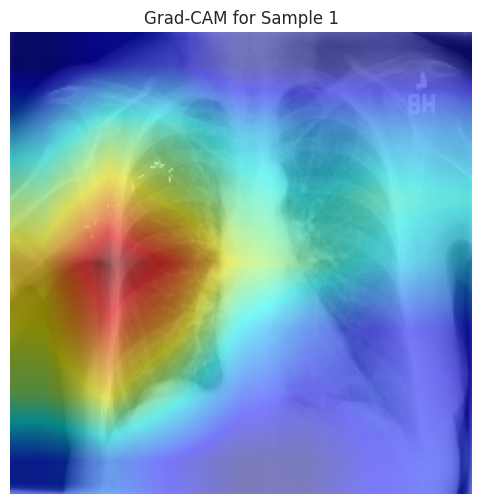

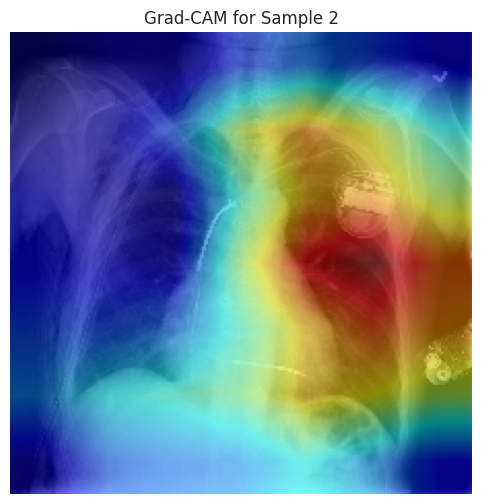

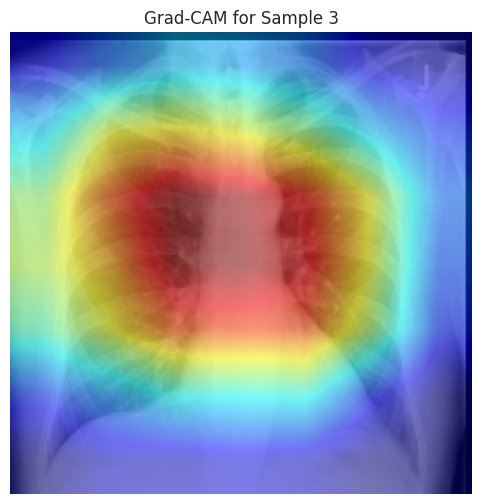

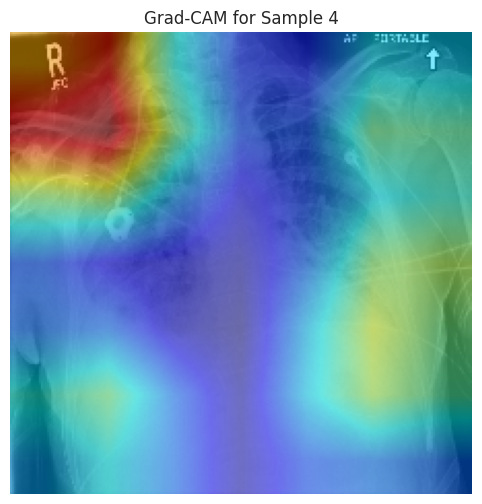

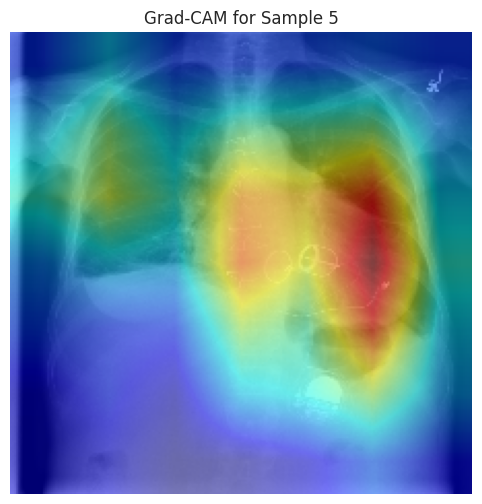

In [55]:
cam = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

# Use the validation loader to get samples
for idx, (images, metadata, labels, _) in enumerate(val_loader):
    if idx >= 5: # Limit the number of visualizations for demonstration
        break

    # Move image to device if necessary for CAM calculation
    images = images.to(DEVICE)

   
    # If you want CAM for the positive class:
    target_category = 0 # Index of the single output logit

  
    cam_image_branch = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

    # Get the raw grayscale CAM output from the image branch
    grayscale_cam = cam_image_branch(input_tensor=images, targets=None) # targets=None sums gradients

    
    # Ensure image tensor is on CPU and convert to numpy (H, W, C)
    img_np = images[0].cpu().permute(1, 2, 0).numpy()

    # Reverse normalization for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_display = img_np * std + mean # Reverse the mean and std
    img_display = np.clip(img_display, 0, 1) # Clip to ensure values are in [0, 1]
    cam_image = show_cam_on_image(img_display, grayscale_cam[0, ...], use_rgb=True) # use_rgb=True for color overlay

    # Save the CAM image
    plt.figure() # Create a new figure for each image
    plt.imshow(cam_image)
    plt.title(f"Grad-CAM for Sample {idx+1}")
    plt.axis('off') # Hide axes
    plt.savefig(os.path.join(OUTPUT_PATH, f"gradcam_sample_{idx+1:02}.png"), bbox_inches='tight')
    # plt.close() # Close the figure to free memory

print("Grad-CAM visualizations generated (saved to", OUTPUT_PATH, ")")

**CAM for the predicted negative class**

Grad-CAM visualizations generated (saved to ./ )


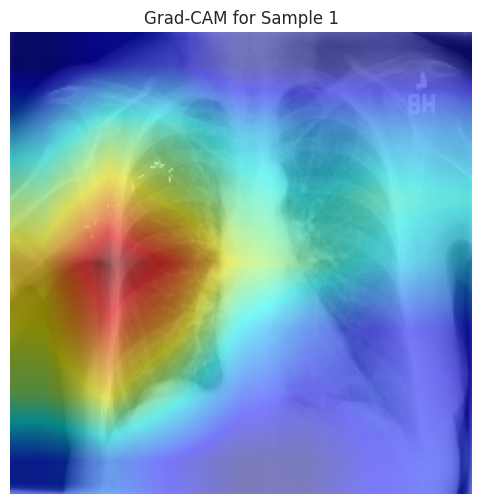

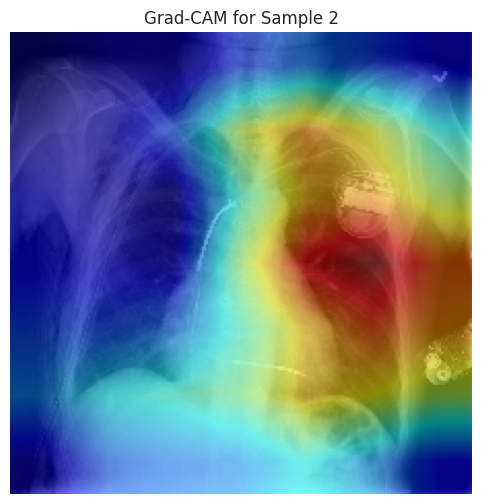

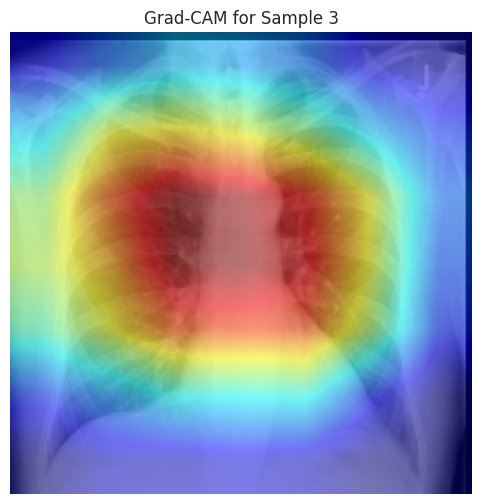

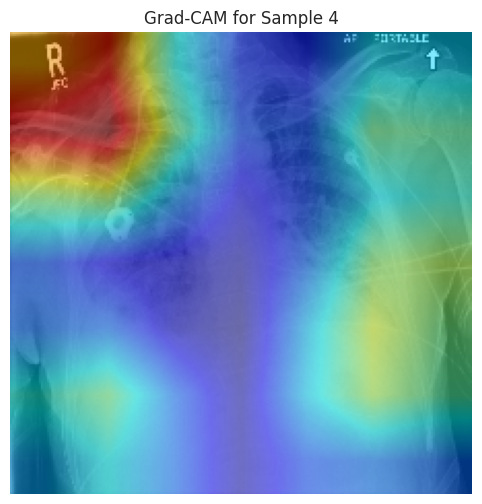

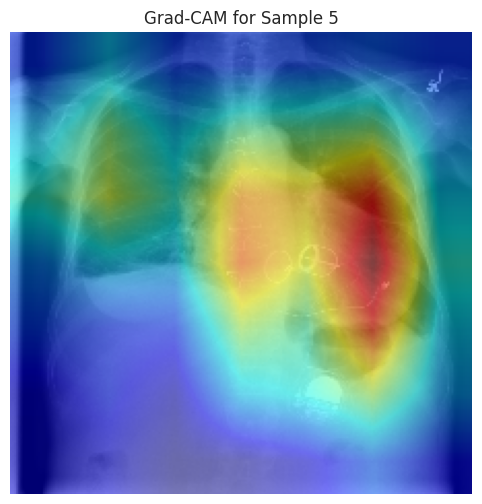

In [56]:
cam = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

# Use the validation loader to get samples
for idx, (images, metadata, labels, _) in enumerate(val_loader):
    if idx >= 5: # Limit the number of visualizations for demonstration
        break

    # Move image to device if necessary for CAM calculation
    images = images.to(DEVICE)

   
    # CAM for the negative class:
    target_category = 1 # Index of the single output logit

  
    cam_image_branch = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

    # Get the raw grayscale CAM output from the image branch
    grayscale_cam = cam_image_branch(input_tensor=images, targets=None) # targets=None sums gradients

    
    # Ensure image tensor is on CPU and convert to numpy (H, W, C)
    img_np = images[0].cpu().permute(1, 2, 0).numpy()

    # Reverse normalization for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_display = img_np * std + mean # Reverse the mean and std
    img_display = np.clip(img_display, 0, 1) # Clip to ensure values are in [0, 1]
    cam_image = show_cam_on_image(img_display, grayscale_cam[0, ...], use_rgb=True) # use_rgb=True for color overlay

    # Save the CAM image
    plt.figure() # Create a new figure for each image
    plt.imshow(cam_image)
    plt.title(f"Grad-CAM for Sample {idx+1}")
    plt.axis('off') # Hide axes
    plt.savefig(os.path.join(OUTPUT_PATH, f"gradcam_sample_{idx+1:02}.png"), bbox_inches='tight')
    # plt.close() # Close the figure to free memory

print("Grad-CAM visualizations generated (saved to", OUTPUT_PATH, ")")

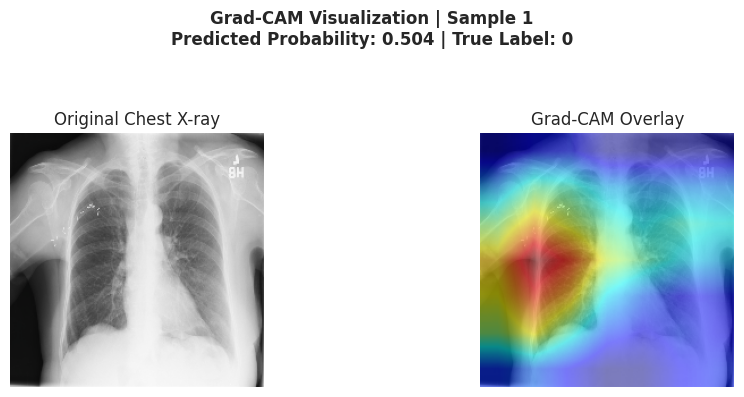

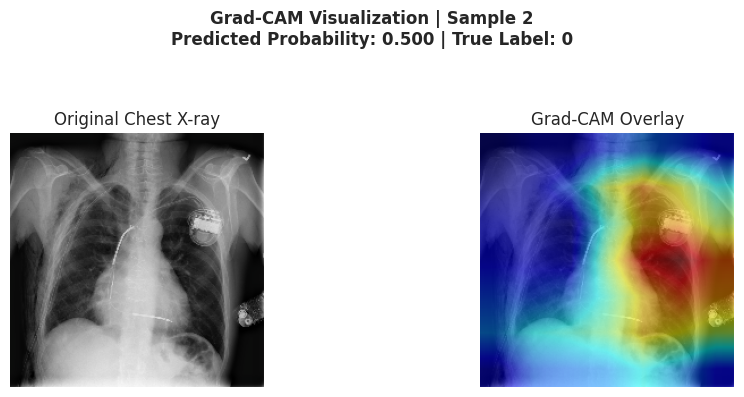

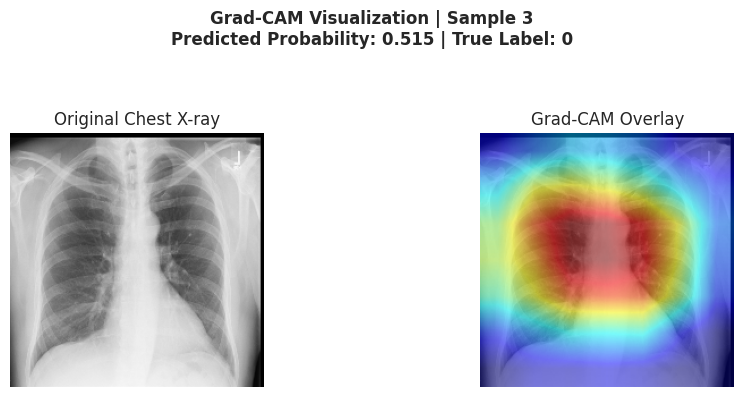

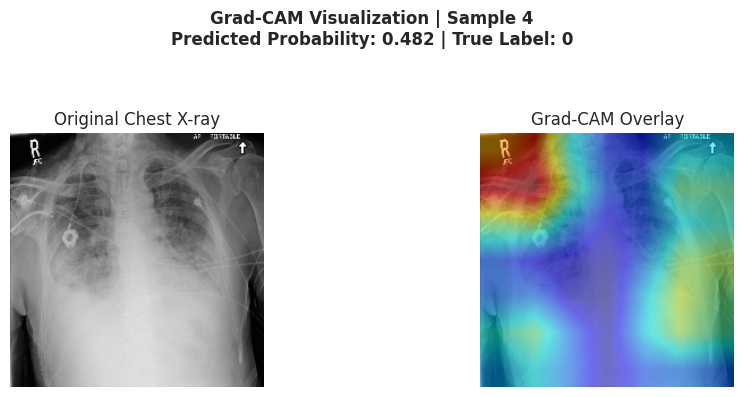

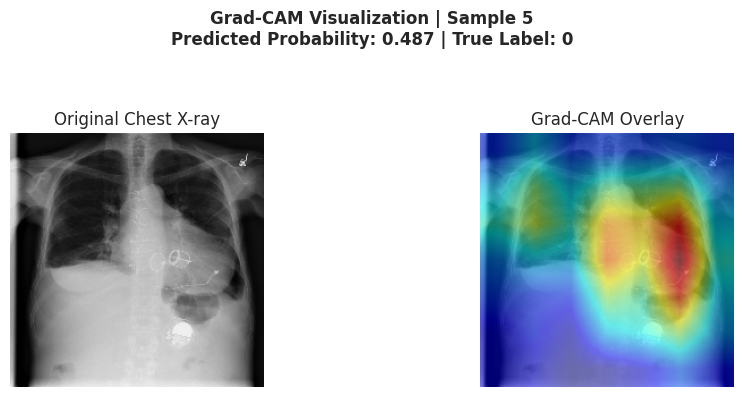

✅ Grad-CAM visualizations successfully generated and saved to: ./


In [61]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import os
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# Ensure output directory exists
os.makedirs(OUTPUT_PATH, exist_ok=True)

# Grad-CAM configuration: use the last convolutional layer of DenseNet
cam = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

# Normalization parameters (reverse ImageNet normalization for display)
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

model.eval()
for idx, (images, metadata, labels, _) in enumerate(val_loader):
    if idx >= 5:  # Limit to first few samples
        break

    images = images.to(DEVICE)
    metadata = metadata.to(DEVICE)
    labels = labels.to(DEVICE)

    # ----- 1️⃣ Forward pass for predicted probability -----
    with torch.no_grad():
        logits = model(images, metadata)
        probs = torch.sigmoid(logits).cpu().numpy().flatten()
        prob = float(probs[0])
        label = int(labels[0].item())

    # ----- 2️⃣ Grad-CAM computation (requires gradients) -----
    grayscale_cam = cam(input_tensor=images, targets=None)
    grayscale_cam = grayscale_cam[0, :]  # first image in batch

    # ----- 3️⃣ Convert image for visualization -----
    img_np = images[0].detach().cpu().permute(1, 2, 0).numpy()
    img_display = img_np * std + mean
    img_display = np.clip(img_display, 0, 1)

    # ----- 4️⃣ Create overlay -----
    cam_image = show_cam_on_image(img_display, grayscale_cam, use_rgb=True)

    # ----- 5️⃣ Display and save results -----
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    fig.suptitle(
        f"Grad-CAM Visualization | Sample {idx+1}\n"
        f"Predicted Probability: {prob:.3f} | True Label: {label}",
        fontsize=12,
        fontweight='bold'
    )

    # Original Image
    axes[0].imshow(img_display)
    axes[0].set_title("Original Chest X-ray")
    axes[0].axis('off')

    # Grad-CAM Overlay
    axes[1].imshow(cam_image)
    axes[1].set_title("Grad-CAM Overlay")
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.savefig(os.path.join(OUTPUT_PATH, f"gradcam_sample_{idx+1:02}.png"), bbox_inches='tight')
    plt.show()

print(f"✅ Grad-CAM visualizations successfully generated and saved to: {OUTPUT_PATH}")


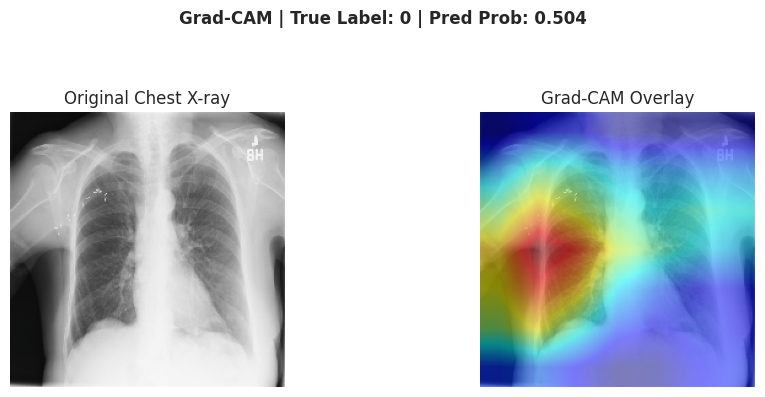

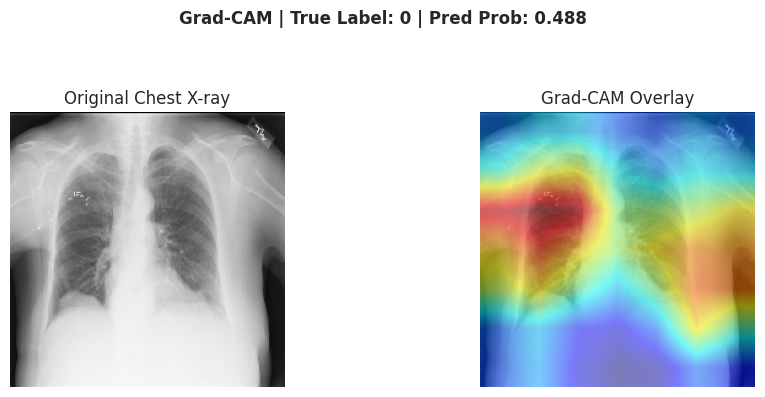

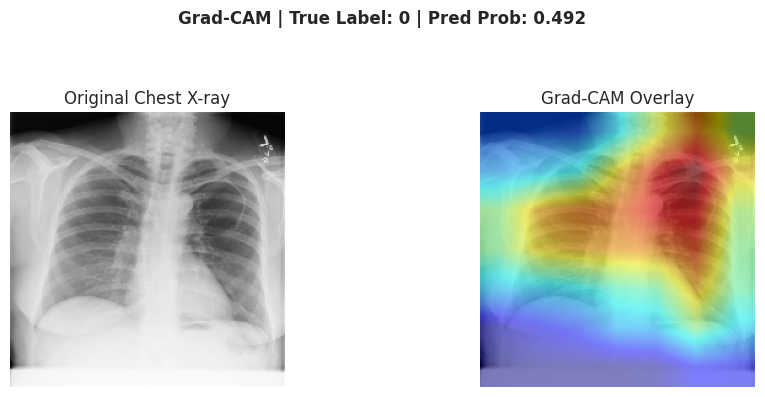

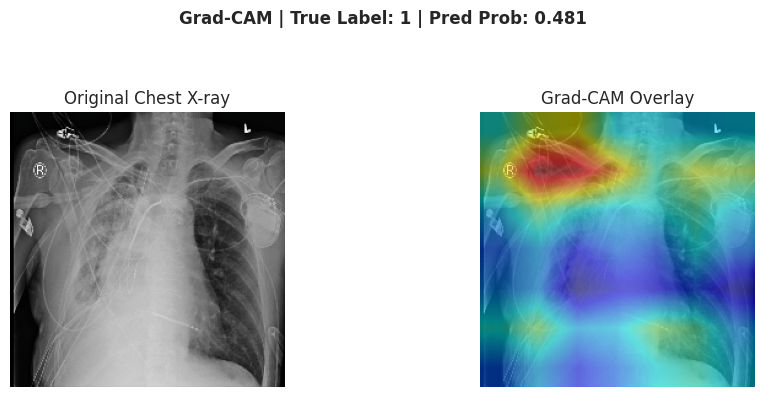

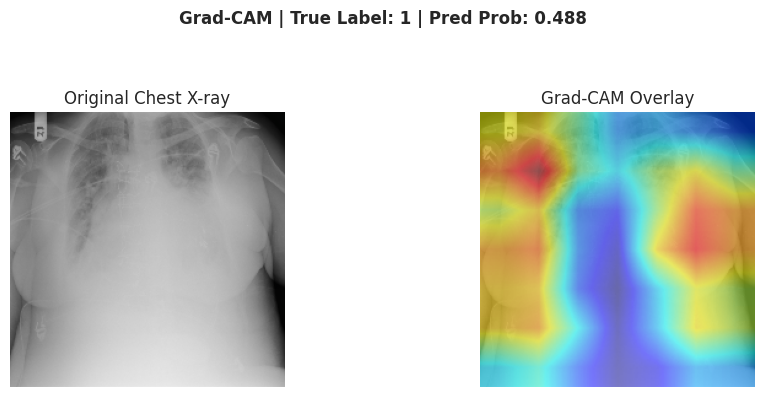

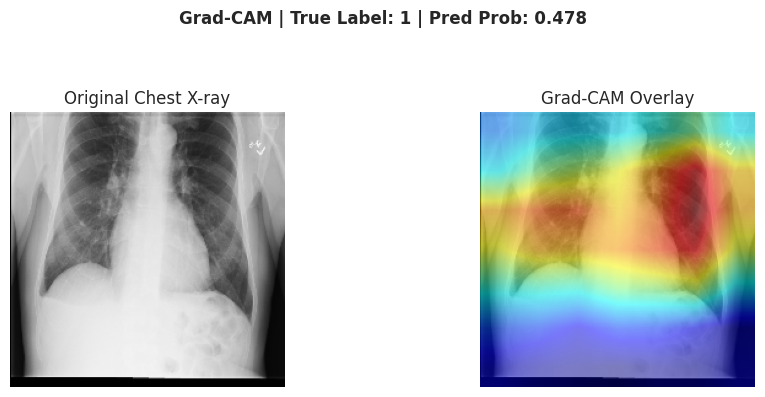

✅ Grad-CAM visualizations generated for both classes (saved to ./)


In [62]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import os
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# Ensure output directory exists
os.makedirs(OUTPUT_PATH, exist_ok=True)

# Grad-CAM setup (use last conv block of DenseNet)
cam = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

# Normalization reversal
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

model.eval()

# We'll collect up to 3 samples per class
samples_to_visualize = {0: 0, 1: 0}
max_per_class = 3

for idx, (images, metadata, labels, _) in enumerate(val_loader):
    for i in range(len(labels)):
        true_label = int(labels[i].item())
        if samples_to_visualize[true_label] >= max_per_class:
            continue  # already have enough from this class

        img = images[i].unsqueeze(0).to(DEVICE)
        meta = metadata[i].unsqueeze(0).to(DEVICE)
        label = labels[i].unsqueeze(0).to(DEVICE)

        # 1️⃣ Forward pass for predicted probability
        with torch.no_grad():
            logits = model(img, meta)
            prob = torch.sigmoid(logits).cpu().item()

        # 2️⃣ Grad-CAM computation (requires gradients)
        grayscale_cam = cam(input_tensor=img, targets=None)
        grayscale_cam = grayscale_cam[0, :]

        # 3️⃣ Convert tensor to image
        img_np = img[0].detach().cpu().permute(1, 2, 0).numpy()
        img_display = img_np * std + mean
        img_display = np.clip(img_display, 0, 1)

        # 4️⃣ Overlay Grad-CAM
        cam_image = show_cam_on_image(img_display, grayscale_cam, use_rgb=True)

        # 5️⃣ Plot & save
        fig, axes = plt.subplots(1, 2, figsize=(10, 4))
        fig.suptitle(
            f"Grad-CAM | True Label: {true_label} | Pred Prob: {prob:.3f}",
            fontsize=12, fontweight='bold'
        )

        axes[0].imshow(img_display)
        axes[0].set_title("Original Chest X-ray")
        axes[0].axis('off')

        axes[1].imshow(cam_image)
        axes[1].set_title("Grad-CAM Overlay")
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.9])
        fname = f"gradcam_label{true_label}_sample{samples_to_visualize[true_label]+1}.png"
        plt.savefig(os.path.join(OUTPUT_PATH, fname), bbox_inches='tight')
        plt.show()

        samples_to_visualize[true_label] += 1

    # Stop once both classes have enough samples
    if all(v >= max_per_class for v in samples_to_visualize.values()):
        break

print(f"✅ Grad-CAM visualizations generated for both classes (saved to {OUTPUT_PATH})")


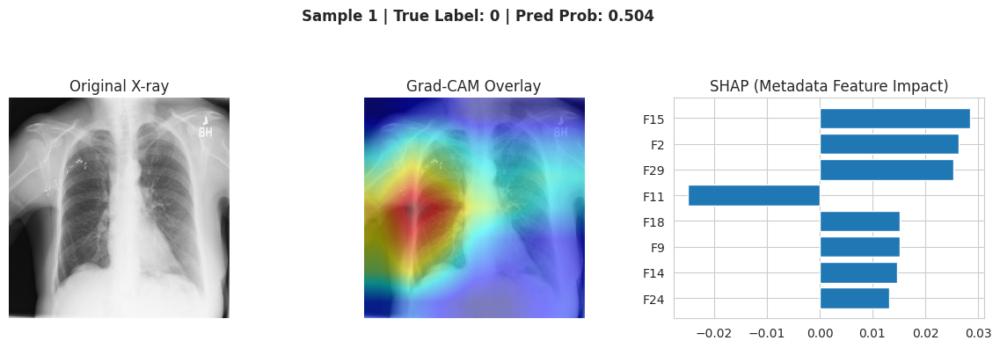

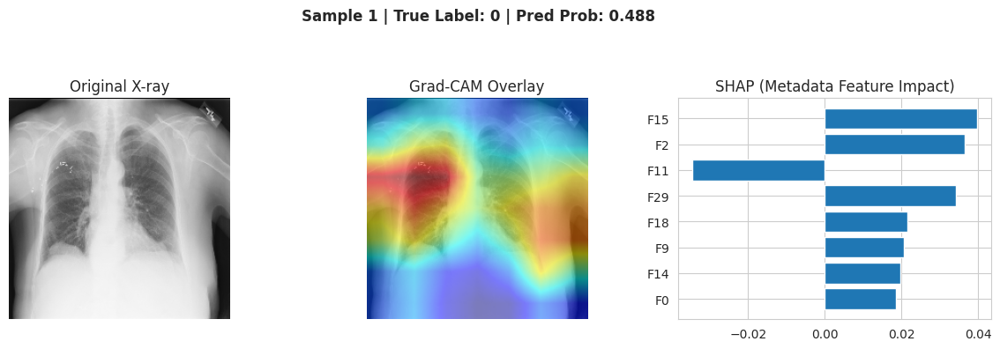

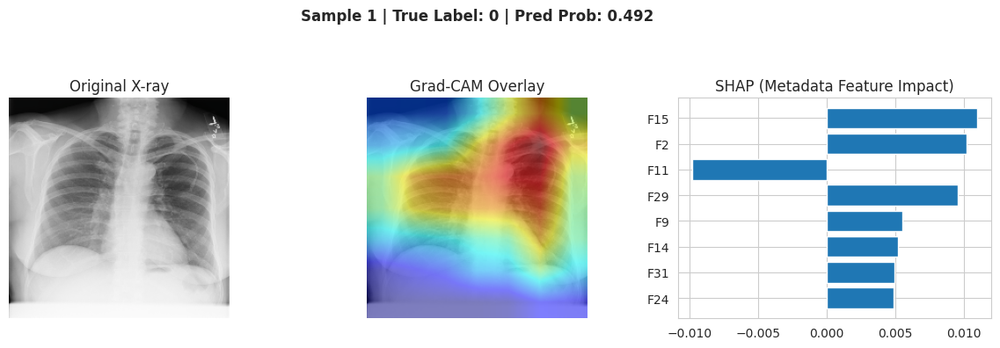

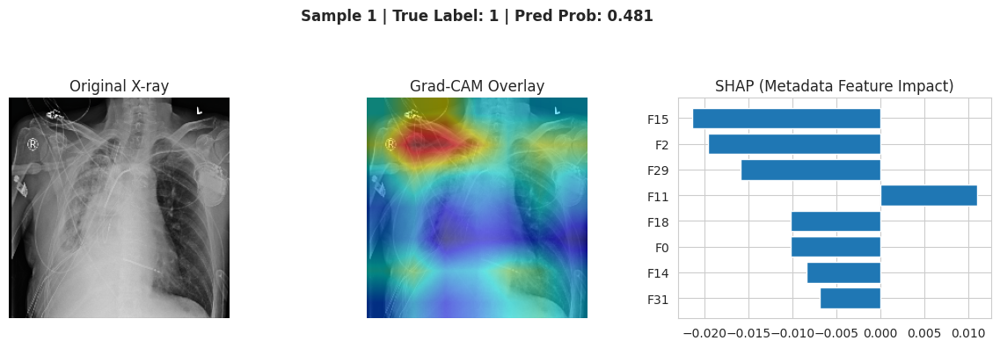

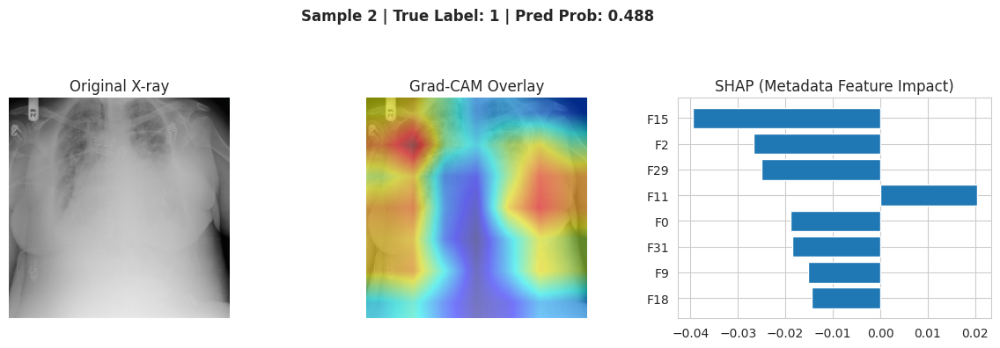

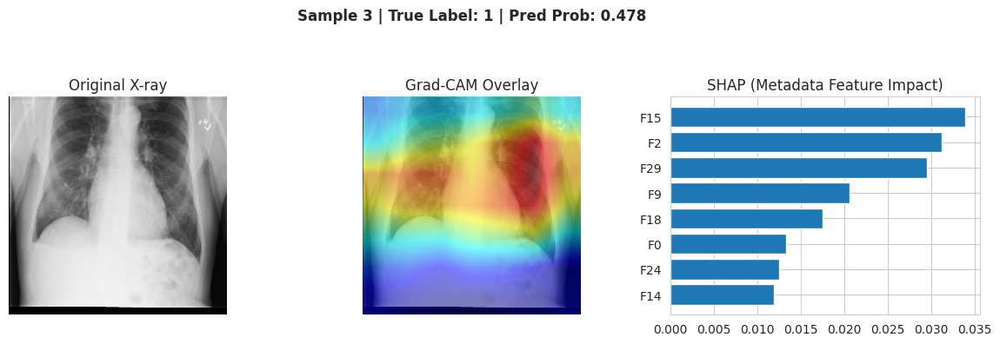

✅ Combined Grad-CAM + SHAP visualizations saved to ./


In [101]:
import torch
import shap
import numpy as np
import matplotlib.pyplot as plt
import os
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# Ensure output folder
os.makedirs(OUTPUT_PATH, exist_ok=True)

# Set model to eval mode
model.eval()

# --- Initialize Grad-CAM for image branch ---
cam = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

# --- Initialize SHAP Explainer for metadata branch ---
background_meta = next(iter(val_loader))[1][:50].to(DEVICE)  # 50 samples for SHAP background
explainer = shap.DeepExplainer(model.meta_mlp, background_meta)  # <- fixed here

# --- Visualization Parameters ---
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
samples_to_visualize = {0: 0, 1: 0}  # adjust keys for your dataset
max_per_class = 3

for idx, (images, metadata, labels, _) in enumerate(val_loader):
    for i in range(len(labels)):
        true_label = int(labels[i].item())
        if samples_to_visualize[true_label] >= max_per_class:
            continue

        img = images[i].unsqueeze(0).to(DEVICE)
        meta = metadata[i].unsqueeze(0).to(DEVICE)

        # ---- Forward prediction ----
        with torch.no_grad():
            logits = model(img, meta)
            prob = torch.sigmoid(logits).cpu().item()

        # ---- Grad-CAM generation ----
        grayscale_cam = cam(input_tensor=img, targets=None)[0, :]
        img_np = img[0].cpu().permute(1, 2, 0).numpy()
        img_display = np.clip(img_np * std + mean, 0, 1)
        cam_image = show_cam_on_image(img_display, grayscale_cam, use_rgb=True)

        # ---- SHAP explanation for metadata ----
        shap_values = explainer.shap_values(meta)  # returns numpy array
        shap_vals = shap_values[0][0]              # select the first sample
        feature_names = [f"F{i}" for i in range(len(shap_vals))]


        # ---- Create combined visualization ----
        fig = plt.figure(figsize=(12, 4))
        fig.suptitle(
            f"Sample {idx+1} | True Label: {true_label} | Pred Prob: {prob:.3f}",
            fontsize=12, fontweight='bold'
        )

        # Original Image
        ax1 = plt.subplot(1, 3, 1)
        ax1.imshow(img_display)
        ax1.set_title("Original X-ray")
        ax1.axis('off')

        # Grad-CAM Heatmap
        ax2 = plt.subplot(1, 3, 2)
        ax2.imshow(cam_image)
        ax2.set_title("Grad-CAM Overlay")
        ax2.axis('off')

        # SHAP Bar Plot
        ax3 = plt.subplot(1, 3, 3)
        topk = np.argsort(np.abs(shap_vals))[-8:]
        ax3.barh(np.array(feature_names)[topk], shap_vals[topk])
        ax3.set_title("SHAP (Metadata Feature Impact)")
        plt.tight_layout(rect=[0, 0, 1, 0.9])

        # Save figure
        fname = f"interpret_label{true_label}_sample{samples_to_visualize[true_label]+1}.png"
        plt.savefig(os.path.join(OUTPUT_PATH, fname), bbox_inches='tight', dpi=300)
        plt.show()

        samples_to_visualize[true_label] += 1

    if all(v >= max_per_class for v in samples_to_visualize.values()):
        break

print(f"✅ Combined Grad-CAM + SHAP visualizations saved to {OUTPUT_PATH}")


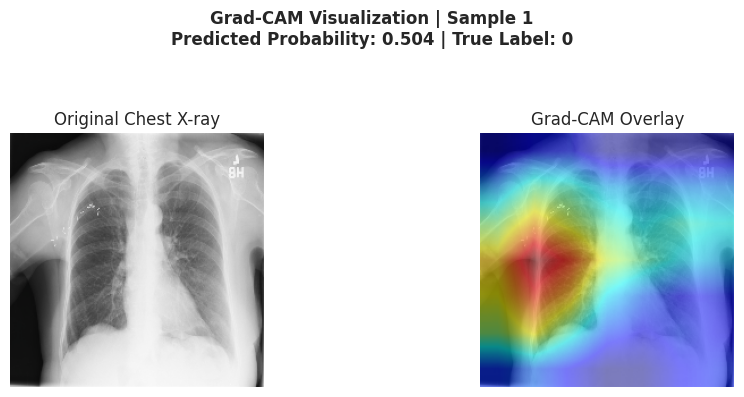

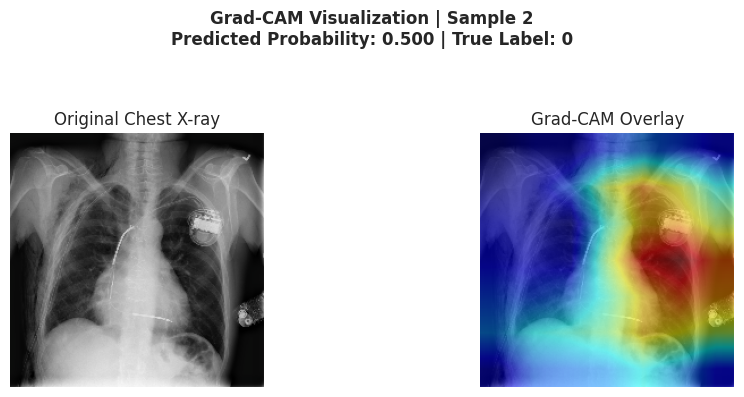

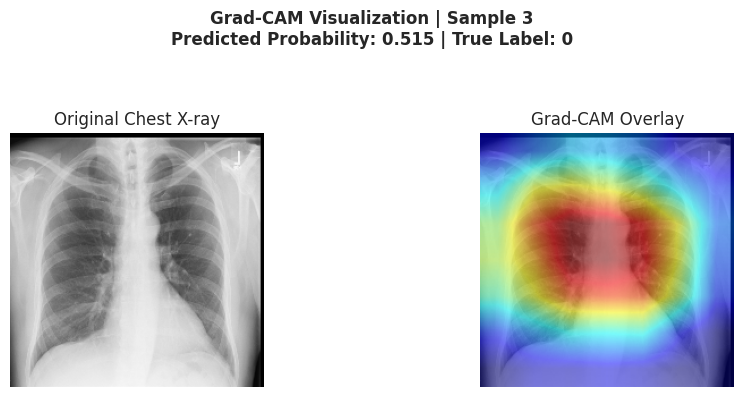

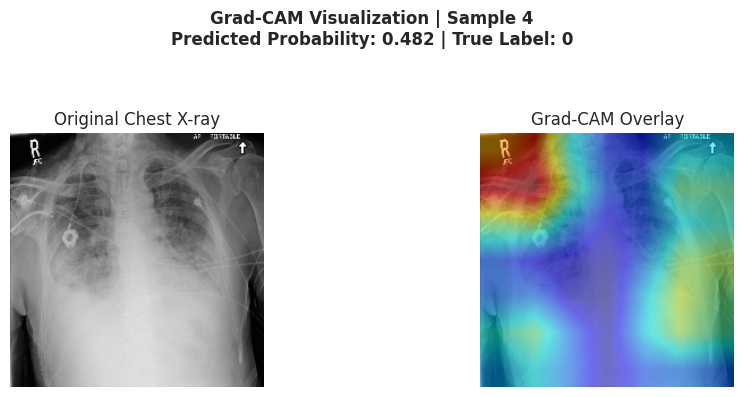

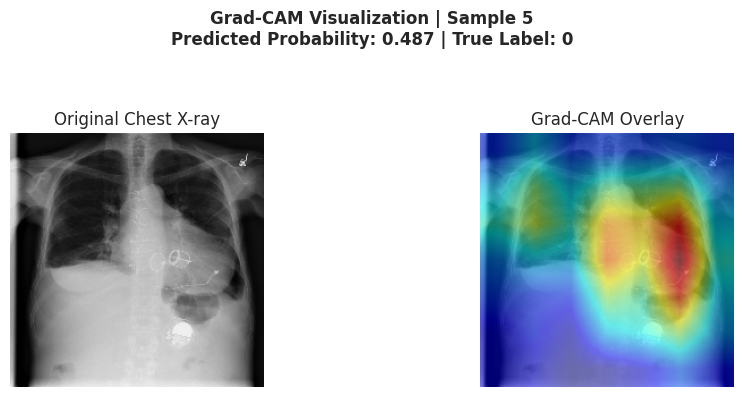

✅ Grad-CAM visualizations successfully generated and saved to: ./


In [100]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import os
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# Ensure output directory exists
os.makedirs(OUTPUT_PATH, exist_ok=True)

# Grad-CAM configuration: use the last convolutional layer of DenseNet
cam = GradCAM(model=model.image_model, target_layers=[model.image_model.layer4[-1]])

# Normalization parameters (reverse ImageNet normalization for display)
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

model.eval()
for idx, (images, metadata, labels, _) in enumerate(val_loader):
    if idx >= 5:  # Limit to first few samples
        break

    images = images.to(DEVICE)
    metadata = metadata.to(DEVICE)
    labels = labels.to(DEVICE)

    # ----- Forward pass for predicted probability -----
    with torch.no_grad():
        logits = model(images, metadata)
        probs = torch.sigmoid(logits).cpu().numpy().flatten()
        prob = float(probs[0])
        label = int(labels[0].item())

    # ----- Grad-CAM computation (requires gradients) -----
    grayscale_cam = cam(input_tensor=images, targets=None)
    grayscale_cam = grayscale_cam[0, :]  # first image in batch

    # -----Convert image for visualization -----
    img_np = images[0].detach().cpu().permute(1, 2, 0).numpy()
    img_display = img_np * std + mean
    img_display = np.clip(img_display, 0, 1)

    # ----- Create overlay -----
    cam_image = show_cam_on_image(img_display, grayscale_cam, use_rgb=True)

    # ----- Display and save results -----
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    fig.suptitle(
        f"Grad-CAM Visualization | Sample {idx+1}\n"
        f"Predicted Probability: {prob:.3f} | True Label: {label}",
        fontsize=12,
        fontweight='bold'
    )

    # Original Image
    axes[0].imshow(img_display)
    axes[0].set_title("Original Chest X-ray")
    axes[0].axis('off')

    # Grad-CAM Overlay
    axes[1].imshow(cam_image)
    axes[1].set_title("Grad-CAM Overlay")
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.savefig(os.path.join(OUTPUT_PATH, f"gradcam_sample_{idx+1:02}.png"), bbox_inches='tight')
    plt.show()

print(f"✅ Grad-CAM visualizations successfully generated and saved to: {OUTPUT_PATH}")
